## 1. Importing Libraries

In [1]:
#import packages
import warnings
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd
import numpy as np
from functools import reduce
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from mpl_toolkits.axes_grid1 import make_axes_locatable
from spreg import OLS, ML_Error, ML_Lag
import libpysal as ps
import statsmodels.api as sm
from libpysal import weights
from esda import Moran
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import plotly.graph_objects as go
import plotly.express as px
import matplotlib.patheffects as path_effects

## 2. Load Datasets

### 2.1 Affordable Housing Data
Load the main dataset on affordable housing in London. The data on affordable housing contains the units of affordable housing in London boroughs from 2017 to 2022, this was gotten from London Datastore. The data is collected by the Greater London Authourity, it includes all council and affordable housing that has been built in London since 2016/2017. 

In [2]:
# Load the dataset
df_affordable_housing = pd.read_excel('Affordable Housing DLUHC Open Data.xlsx')

### 2.2 Additional Datasets

Load the relevant datasets for the research including population, unemployment rate, mean income, crime statistics, education levels, economic activity, job density, and housing tenure per London borough.

Poluplation Data: This data set contains the annual population estimates from 2000 to 2022. Collated by the Office of National Statistics (ONS) and gotten from their official website.

Unemployment Data: This dataset contains the unemployment estimates for local authourities, it captures all the people above 16 without a job from 2004 to 2021. This data is collected by the Office of National Statistics and downloaded from their official website.

Income Data: This dataset contains the average income of people 16 and above in London boroughs from 2000 to 2022. This data is also collected by the Office of National Statistics and downloaded from their website.

Education Data: This dataset contains the people having their highest education qualifications as NVQ4 and above in London boroughs from 2004 to 2021. The dataset was also downloaded from the official website of the Office of National Statistics. 

Economic Activity Data: This dataset contains the percentage of people in households in London boroughs that are economically active from 2004 to 2022. The data is also gathered and collected by the Office of National Statistics.

Job Density Data: This dataset contains the number of jobs and job density by boroughs from 2000 to 2022. The data is collected by the Office of National Statistics and was downloaded from London datastore.

Housing Tenure Data: This dataset is made up of the percentage of homes in London boroughs that are either owned outrightly, bought with mortgage, ented from local authority or housing associations or rented privately from landlords from 2006 to 2020. This data is aslo collated by the Office of National Statistics and was downloaded from their official website.

In [3]:
# Load the additional datasets
df_population = pd.read_excel('london_population.xlsx')
df_unemployment = pd.read_excel('unemployment-rate-london-boroughs.xlsx')
df_income = pd.read_excel('mean-income-of-tax-payers.xlsx')
df_crime = pd.read_csv('London_crimes.csv')
df_education = pd.read_excel('NVQ4-education.xlsx')
df_economic_activity = pd.read_excel('economic-activity-london-borough.xlsx')
df_job_density = pd.read_excel('Job-density.xlsx')
df_housing_tenure = pd.read_excel('tenure-households-london-borough.xlsx')

## 3 Data Wrangling

Note: The datasets have been previously pre-processed and is prepared for analysis.

### 3.1 Data Cleaning

### 3.1.1 View the data
Examine the structure of the data, the number of rows and columns and also the data type of the variables

In [4]:
df_affordable_housing

,Borough,Code,Inner_Outer_London,2017,2018,2019,2020,2021,2022
0,Barking and Dagenham,E09000002,Outer London,312,194,549,1007,1587,941
1,Barnet,E09000003,Outer London,235,963,325,415,805,1207
2,Bexley,E09000004,Outer London,83,164,258,653,374,192
3,Brent,E09000005,Outer London,499,70,2002,1650,491,461
4,Bromley,E09000006,Outer London,6,281,125,23,285,136
5,Camden,E09000007,Inner London,356,126,367,51,216,218
6,Croydon,E09000008,Outer London,282,540,697,1357,962,511
7,Ealing,E09000009,Outer London,1138,1037,1092,948,898,1658
8,Enfield,E09000010,Outer London,51,299,170,419,512,457
9,Greenwich,E09000011,Outer London,358,452,430,1168,516,620


In [5]:
df_affordable_housing.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32 entries, 0 to 31
Data columns (total 9 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   Borough             32 non-null     object
 1   Code                32 non-null     object
 2   Inner_Outer_London  32 non-null     object
 3   2017                32 non-null     int64 
 4   2018                32 non-null     int64 
 5   2019                32 non-null     int64 
 6   2020                32 non-null     int64 
 7   2021                32 non-null     int64 
 8   2022                32 non-null     int64 
dtypes: int64(6), object(3)
memory usage: 2.4+ KB


In [6]:
df_population

,Borough,Code,Inner_Outer_London,2000,2001,2002,2003,2004,2005,2006,...,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
0,Barking and Dagenham,E09000002,Outer London,163893,165654,166357,166210,165610,166275,167157,...,196204,201244,206450,211047,214017,216298,218828,219227,218714,219992
1,Barnet,E09000003,Outer London,315784,319481,320552,321802,323723,327541,330801,...,368611,373853,377826,382925,384117,387574,390590,391046,388955,389101
2,Bexley,E09000004,Outer London,218717,218757,219123,220016,220917,222391,223280,...,236169,239112,241427,244006,244494,245244,246622,246924,246637,247835
3,Brent,E09000005,Outer London,264945,269620,269871,268323,268335,270939,276504,...,324345,329981,335605,339524,342439,345558,347424,343988,339248,341221
4,Bromley,E09000006,Outer London,295317,296218,296668,297253,297307,299421,300963,...,318582,321800,325653,327701,329134,330367,331192,331247,329899,329578
5,Camden,E09000007,Inner London,196174,202567,203972,204254,207341,211088,211032,...,221348,221095,221032,221024,218833,217915,217136,214768,210968,218049
6,Croydon,E09000008,Outer London,334241,335112,335415,335919,337134,339052,340449,...,374270,378244,381277,384382,385567,386999,390643,392101,390691,392224
7,Ealing,E09000009,Outer London,304370,307276,309242,308108,310073,312774,315329,...,350650,354660,359144,362163,362670,364208,367284,367936,366762,369937
8,Enfield,E09000010,Outer London,275068,277266,280745,281835,282217,284779,287429,...,321754,326340,330868,333295,333077,334000,335151,333149,329876,327224
9,Greenwich,E09000011,Outer London,214438,217460,221476,224303,227190,230494,233990,...,264036,268305,274230,278768,282376,285773,288205,288384,289537,291080


In [7]:
df_population.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32 entries, 0 to 31
Data columns (total 26 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   Borough             32 non-null     object
 1   Code                32 non-null     object
 2   Inner_Outer_London  32 non-null     object
 3   2000                32 non-null     int64 
 4   2001                32 non-null     int64 
 5   2002                32 non-null     int64 
 6   2003                32 non-null     int64 
 7   2004                32 non-null     int64 
 8   2005                32 non-null     int64 
 9   2006                32 non-null     int64 
 10  2007                32 non-null     int64 
 11  2008                32 non-null     int64 
 12  2009                32 non-null     int64 
 13  2010                32 non-null     int64 
 14  2011                32 non-null     int64 
 15  2012                32 non-null     int64 
 16  2013                32 non-n

In [8]:
df_unemployment

,Borough,Code,Inner_Outer_London,2004,2005,2006,2007,2008,2009,2010,...,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
0,Barking and Dagenham,E09000002,Outer London,8.3,9.1,9.5,7.8,8.6,11.9,13.1,...,13.5,13.6,10.7,9.7,6.8,7.7,5.9,5.7,8.0,7.7
1,Barnet,E09000003,Outer London,6.3,7.0,6.8,5.2,6.4,7.5,7.0,...,8.9,6.5,6.4,5.8,4.9,4.4,4.7,4.5,5.7,6.4
2,Bexley,E09000004,Outer London,4.1,5.0,5.5,4.4,5.6,8.2,8.5,...,7.6,8.1,5.7,6.0,4.2,4.6,4.0,4.2,4.9,5.1
3,Brent,E09000005,Outer London,9.1,7.9,9.1,8.7,7.3,9.4,8.9,...,10.3,9.8,7.4,7.1,7.1,6.3,5.3,4.7,6.5,6.4
4,Bromley,E09000006,Outer London,4.7,4.7,5.1,4.4,4.5,6.2,6.9,...,6.6,6.1,5.5,4.9,4.1,4.2,4.2,3.0,4.9,4.7
5,Camden,E09000007,Inner London,7.6,7.7,8.3,6.9,7.0,8.8,8.7,...,7.8,7.6,6.7,5.5,5.8,5.2,4.5,4.5,5.3,4.7
6,Croydon,E09000008,Outer London,6.2,7.0,6.6,6.0,6.1,9.0,8.1,...,10.4,8.7,7.2,5.3,5.5,7.3,5.0,5.3,6.6,6.6
7,Ealing,E09000009,Outer London,6.5,7.7,7.3,6.4,6.9,10.3,9.2,...,10.9,10.2,7.8,6.1,5.7,5.1,5.5,5.4,6.4,6.7
8,Enfield,E09000010,Outer London,6.6,8.8,6.7,6.7,8.3,11.2,9.9,...,11.4,9.4,8.2,5.9,6.1,6.0,5.3,6.0,7.0,7.1
9,Greenwich,E09000011,Outer London,8.0,8.8,8.0,7.3,7.9,10.8,9.7,...,10.7,10.4,8.9,6.8,6.2,5.9,5.4,4.8,5.9,6.4


In [9]:
df_unemployment.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32 entries, 0 to 31
Data columns (total 21 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Borough             32 non-null     object 
 1   Code                32 non-null     object 
 2   Inner_Outer_London  32 non-null     object 
 3   2004                32 non-null     float64
 4   2005                32 non-null     float64
 5   2006                32 non-null     float64
 6   2007                32 non-null     float64
 7   2008                32 non-null     float64
 8   2009                32 non-null     float64
 9   2010                32 non-null     float64
 10  2011                32 non-null     float64
 11  2012                32 non-null     float64
 12  2013                32 non-null     float64
 13  2014                32 non-null     float64
 14  2015                32 non-null     float64
 15  2016                32 non-null     float64
 16  2017      

In [10]:
df_income

,Borough,Code,Inner_Outer_London,2000,2001,2002,2003,2004,2005,2006,...,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
0,Barking and Dagenham,E09000002,Outer London,16200,18100,18600,19100,18800,19400,20600,...,23700,24600,25500,25900,26700,27400,28800,29400,30800,31800
1,Barnet,E09000003,Outer London,26800,30800,30400,32300,33900,32800,35600,...,41000,45500,45800,49000,48600,49500,51600,51600,54400,59100
2,Bexley,E09000004,Outer London,20500,19800,22000,21500,21900,22300,24000,...,28600,29600,30200,30900,32300,33500,34600,36000,36400,38000
3,Brent,E09000005,Outer London,20000,22200,21100,21700,22500,21800,23200,...,28300,29700,31200,32600,34100,35400,36300,37800,40400,44100
4,Bromley,E09000006,Outer London,25100,26400,27400,27700,29200,29200,31400,...,37200,39000,40400,43500,44000,45500,46600,48200,49300,54500
5,Camden,E09000007,Inner London,39000,40000,42800,43000,45700,50200,56200,...,71200,78900,79200,85000,88000,92600,87400,96900,107000,119000
6,Croydon,E09000008,Outer London,21500,22100,23500,23400,23300,24300,25800,...,30700,31800,32600,34200,33800,35600,36500,37800,38300,40900
7,Ealing,E09000009,Outer London,22800,23800,25200,25400,26100,26500,26900,...,32600,34500,35300,37000,37300,39700,39800,42700,44100,46800
8,Enfield,E09000010,Outer London,21500,20800,23100,24100,24200,23900,25800,...,30800,32900,34400,34600,34600,36200,37200,39500,40700,42800
9,Greenwich,E09000011,Outer London,20700,22400,24000,22900,23300,23100,25500,...,31500,34200,34800,37300,37500,40200,41300,44700,46400,48900


In [11]:
df_income.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32 entries, 0 to 31
Data columns (total 25 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   Borough             32 non-null     object
 1   Code                32 non-null     object
 2   Inner_Outer_London  32 non-null     object
 3   2000                32 non-null     int64 
 4   2001                32 non-null     int64 
 5   2002                32 non-null     int64 
 6   2003                32 non-null     int64 
 7   2004                32 non-null     int64 
 8   2005                32 non-null     int64 
 9   2006                32 non-null     int64 
 10  2007                32 non-null     int64 
 11  2008                32 non-null     int64 
 12  2010                32 non-null     int64 
 13  2011                32 non-null     int64 
 14  2012                32 non-null     int64 
 15  2013                32 non-null     int64 
 16  2014                32 non-n

In [12]:
df_crime

,Borough,Code,Inner_Outer_London,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
0,Barking and Dagenham,E09000002,Outer London,14454,18533,17297,16500,16210,17167,17753,18670,18310,20201,19187,19853,21172,22306
1,Barnet,E09000003,Outer London,18937,26174,25595,23163,23000,24584,25678,26957,28263,31577,27390,27146,28000,29335
2,Bexley,E09000004,Outer London,10526,12283,12333,11896,12187,12335,13399,14804,15369,18062,15601,14997,16018,16895
3,Brent,E09000005,Outer London,21867,30556,28287,24457,25103,25579,27618,29707,30778,30451,28800,28156,30570,31731
4,Bromley,E09000006,Outer London,16314,22007,20586,19422,20152,21055,20692,22751,23187,25176,22013,22478,22919,24029
5,Camden,E09000007,Inner London,25107,35889,33520,29218,27880,30292,30130,37892,35606,39785,29574,28111,35283,40326
6,Croydon,E09000008,Outer London,24180,32252,32351,28381,28321,29290,30203,30540,31015,33853,33313,33128,34551,34698
7,Ealing,E09000009,Outer London,26076,32404,30841,26645,25647,26946,27966,28306,28294,31823,29361,29147,30258,32890
8,Enfield,E09000010,Outer London,17358,23373,22608,22266,22370,22812,23297,25192,28000,30588,28862,29124,30445,30236
9,Greenwich,E09000011,Outer London,18175,22468,21355,19664,20554,21580,23500,25480,25681,28863,25754,26753,28330,29519


In [13]:
df_crime.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32 entries, 0 to 31
Data columns (total 17 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   Borough             32 non-null     object
 1   Code                32 non-null     object
 2   Inner_Outer_London  32 non-null     object
 3   2010                32 non-null     int64 
 4   2011                32 non-null     int64 
 5   2012                32 non-null     int64 
 6   2013                32 non-null     int64 
 7   2014                32 non-null     int64 
 8   2015                32 non-null     int64 
 9   2016                32 non-null     int64 
 10  2017                32 non-null     int64 
 11  2018                32 non-null     int64 
 12  2019                32 non-null     int64 
 13  2020                32 non-null     int64 
 14  2021                32 non-null     int64 
 15  2022                32 non-null     int64 
 16  2023                32 non-n

In [14]:
df_education

,Borough,Code,Inner_Outer_London,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019
0,Barking and Dagenham,E09000002,Outer London,15.980630,16.726835,16.752577,19.660194,23.488372,25.769669,28.952991,31.034483,30.1,31.9,33.5,35.7,37.9,35.5,36.2,37.0
1,Barnet,E09000003,Outer London,42.377869,44.332344,41.437756,43.614055,45.288099,46.292482,52.681891,55.896351,54.6,56.5,50.9,57.5,62.7,62.4,57.1,57.3
2,Bexley,E09000004,Outer London,16.875000,20.860018,24.555160,25.044883,25.359256,31.097561,29.880137,29.247675,31.6,32.8,37.1,36.4,41.3,39.2,44.5,39.1
3,Brent,E09000005,Outer London,27.266388,31.098825,29.130142,30.044558,29.495074,37.797101,29.519698,31.404959,45.7,47.7,50.9,50.1,48.8,43.7,45.2,54.5
4,Bromley,E09000006,Outer London,38.258575,35.060781,36.875395,37.325729,35.254445,37.815126,41.543901,47.621915,48.8,50.3,50.0,51.1,53.4,50.6,52.4,58.2
5,Camden,E09000007,Inner London,52.454992,54.508197,53.087410,55.502008,56.889605,58.623418,60.160000,61.611374,66.6,64.0,67.6,66.2,66.1,66.2,69.4,67.4
6,Croydon,E09000008,Outer London,30.269960,32.480534,32.717391,32.854776,36.601993,34.609415,42.695524,40.768463,46.7,48.3,44.9,47.0,52.5,50.3,50.9,47.4
7,Ealing,E09000009,Outer London,39.074400,39.604520,37.613122,42.220937,45.792350,39.422028,44.085433,51.125755,50.5,49.5,51.2,54.3,59.0,55.1,58.1,64.0
8,Enfield,E09000010,Outer London,24.850498,30.891500,35.355512,32.428941,35.012594,38.202247,38.881910,39.866099,38.6,38.2,45.2,48.7,46.7,39.2,45.3,44.9
9,Greenwich,E09000011,Outer London,30.352748,31.310680,37.218650,36.037441,40.488923,39.777778,42.761693,48.871085,48.0,49.0,46.0,48.4,52.6,61.1,56.7,53.9


In [15]:
df_education.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32 entries, 0 to 31
Data columns (total 19 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Borough             32 non-null     object 
 1   Code                32 non-null     object 
 2   Inner_Outer_London  32 non-null     object 
 3   2004                32 non-null     float64
 4   2005                32 non-null     float64
 5   2006                32 non-null     float64
 6   2007                32 non-null     float64
 7   2008                32 non-null     float64
 8   2009                32 non-null     float64
 9   2010                32 non-null     float64
 10  2011                32 non-null     float64
 11  2012                32 non-null     float64
 12  2013                32 non-null     float64
 13  2014                32 non-null     float64
 14  2015                32 non-null     float64
 15  2016                32 non-null     float64
 16  2017      

In [16]:
df_economic_activity

,Borough,Code,Inner_Outer_London,2004,2005,2006,2007,2008,2009,2010,...,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
0,Barking and Dagenham,E09000002,Outer London,44.5,45.0,39.3,45.1,45.2,42.8,39.7,...,39.2,40.2,44.0,41.8,41.6,45.2,47.7,41.7,40.8,47.8
1,Barnet,E09000003,Outer London,47.2,53.8,45.7,48.0,48.1,48.1,47.1,...,54.7,49.2,49.7,49.9,50.0,47.5,52.8,56.6,51.9,53.1
2,Bexley,E09000004,Outer London,61.7,57.8,55.9,51.7,51.0,44.7,50.9,...,50.1,52.6,55.9,58.3,57.4,59.8,55.1,56.0,49.8,62.3
3,Brent,E09000005,Outer London,44.7,43.0,40.9,43.7,46.6,48.0,42.0,...,37.5,41.5,42.4,42.5,41.9,45.1,51.4,45.1,46.0,49.1
4,Bromley,E09000006,Outer London,62.0,64.6,56.2,62.2,63.2,58.8,54.3,...,56.9,53.6,59.2,64.0,56.4,62.4,61.9,59.2,63.8,61.9
5,Camden,E09000007,Inner London,55.4,49.0,53.6,56.5,55.9,50.6,49.1,...,47.7,47.7,51.5,54.7,50.4,50.7,53.8,48.9,45.8,52.3
6,Croydon,E09000008,Outer London,56.3,57.4,54.7,55.7,60.0,55.5,54.7,...,53.7,53.9,55.7,55.1,51.8,56.5,58.3,59.9,57.7,61.4
7,Ealing,E09000009,Outer London,53.6,49.8,51.2,50.3,45.6,45.5,45.2,...,47.1,42.6,49.2,52.7,54.2,48.7,46.3,55.4,58.3,57.8
8,Enfield,E09000010,Outer London,50.8,44.3,52.6,46.9,44.3,43.8,43.8,...,46.8,52.9,51.8,52.5,50.0,49.2,44.9,48.3,57.8,50.7
9,Greenwich,E09000011,Outer London,47.9,48.6,52.0,49.8,47.0,46.2,48.1,...,46.5,46.7,53.2,53.4,52.7,55.1,56.6,58.5,60.7,59.1


In [17]:
df_economic_activity.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32 entries, 0 to 31
Data columns (total 22 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Borough             32 non-null     object 
 1   Code                32 non-null     object 
 2   Inner_Outer_London  32 non-null     object 
 3   2004                32 non-null     float64
 4   2005                32 non-null     float64
 5   2006                32 non-null     float64
 6   2007                32 non-null     float64
 7   2008                32 non-null     float64
 8   2009                32 non-null     float64
 9   2010                32 non-null     float64
 10  2011                32 non-null     float64
 11  2012                32 non-null     float64
 12  2013                32 non-null     float64
 13  2014                32 non-null     float64
 14  2015                32 non-null     float64
 15  2016                32 non-null     float64
 16  2017      

In [18]:
df_job_density

,Borough,Code,Inner_Outer_London,2000,2001,2002,2003,2004,2005,2006,...,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
0,Barking and Dagenham,E09000002,Outer London,0.56,0.52,0.50,0.53,0.51,0.51,0.49,...,0.44,0.47,0.48,0.48,0.49,0.49,0.50,0.52,0.51,0.53
1,Barnet,E09000003,Outer London,0.67,0.65,0.64,0.65,0.63,0.63,0.63,...,0.66,0.68,0.68,0.68,0.70,0.67,0.66,0.64,0.70,0.66
2,Bexley,E09000004,Outer London,0.55,0.54,0.57,0.55,0.61,0.57,0.52,...,0.54,0.53,0.57,0.56,0.59,0.56,0.59,0.54,0.56,0.59
3,Brent,E09000005,Outer London,0.67,0.62,0.62,0.65,0.65,0.64,0.58,...,0.57,0.60,0.62,0.67,0.71,0.71,0.71,0.69,0.63,0.63
4,Bromley,E09000006,Outer London,0.62,0.61,0.63,0.67,0.67,0.66,0.66,...,0.64,0.63,0.61,0.65,0.65,0.62,0.64,0.62,0.60,0.66
5,Camden,E09000007,Inner London,2.05,1.98,1.92,1.86,1.82,1.88,1.80,...,2.15,2.25,2.21,2.23,2.23,2.17,2.11,1.98,2.73,2.82
6,Croydon,E09000008,Outer London,0.73,0.71,0.68,0.69,0.69,0.67,0.66,...,0.53,0.58,0.58,0.60,0.63,0.60,0.58,0.58,0.55,0.59
7,Ealing,E09000009,Outer London,0.64,0.63,0.62,0.64,0.63,0.63,0.62,...,0.65,0.69,0.71,0.73,0.74,0.66,0.71,0.72,0.63,0.64
8,Enfield,E09000010,Outer London,0.63,0.61,0.57,0.60,0.59,0.62,0.56,...,0.57,0.61,0.63,0.60,0.59,0.62,0.63,0.59,0.58,0.61
9,Greenwich,E09000011,Outer London,0.60,0.50,0.50,0.51,0.50,0.52,0.51,...,0.48,0.52,0.51,0.51,0.53,0.55,0.55,0.52,0.51,0.53


In [19]:
df_job_density.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32 entries, 0 to 31
Data columns (total 26 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Borough             32 non-null     object 
 1   Code                32 non-null     object 
 2   Inner_Outer_London  32 non-null     object 
 3   2000                32 non-null     float64
 4   2001                32 non-null     float64
 5   2002                32 non-null     float64
 6   2003                32 non-null     float64
 7   2004                32 non-null     float64
 8   2005                32 non-null     float64
 9   2006                32 non-null     float64
 10  2007                32 non-null     float64
 11  2008                32 non-null     float64
 12  2009                32 non-null     float64
 13  2010                32 non-null     float64
 14  2011                32 non-null     float64
 15  2012                32 non-null     float64
 16  2013      

In [20]:
df_housing_tenure

,Borough,Code,Inner_Outer_London,Own Outright_2006,Buying with mortgage_2006,Rented from Local Authority or Housing Association_2006,Rented from Private landlord_2006,Own Outright_2007,Buying with mortgage_2007,Rented from Local Authority or Housing Association_2007,...,Rented from Local Authority or Housing Association_2018,Rented from Private landlord_2018,Own Outright_2019,Buying with mortgage_2019,Rented from Local Authority or Housing Association_2019,Rented from Private landlord_2019,Own Outright_2020,Buying with mortgage_2020,Rented from Local Authority or Housing Association_2020,Rented from Private landlord_2020
0,Barking and Dagenham,E09000002,Outer London,21.6,32.4,35.9,10.1,21.5,34.3,34.1,...,30.4,20.7,18.8,22.9,32.8,25.4,19.2,22.6,39.4,18.8
1,Barnet,E09000003,Outer London,27.7,35.0,14.6,22.7,30.1,36.8,14.3,...,13.9,25.2,30.3,29.1,12.5,28.2,32.4,30.2,12.7,24.7
2,Bexley,E09000004,Outer London,28.5,47.2,15.2,9.0,32.6,45.3,16.7,...,10.4,15.1,35.6,35.9,13.6,14.9,37.5,32.6,16.4,13.5
3,Brent,E09000005,Outer London,21.3,32.3,23.4,23.0,23.9,30.2,17.4,...,23.5,29.2,26.7,21.4,20.0,31.8,27.7,21.9,20.2,30.1
4,Bromley,E09000006,Outer London,34.0,40.6,13.4,12.0,31.6,42.9,12.9,...,13.3,19.1,32.0,37.2,9.7,21.1,35.4,37.8,12.8,14.0
5,Camden,E09000007,Inner London,16.2,19.1,36.5,28.1,15.3,18.5,35.0,...,35.3,28.2,19.9,14.7,37.2,28.1,21.8,19.9,34.1,24.2
6,Croydon,E09000008,Outer London,28.7,38.8,15.6,17.0,26.7,40.0,17.9,...,17.6,19.2,22.7,32.6,17.6,27.1,27.2,35.8,13.8,23.2
7,Ealing,E09000009,Outer London,25.4,38.0,17.7,19.0,28.7,32.4,14.8,...,11.2,25.6,26.4,30.8,12.7,30.1,27.6,28.5,13.7,30.2
8,Enfield,E09000010,Outer London,24.7,41.5,20.0,13.8,27.3,35.9,20.7,...,19.0,26.2,26.3,31.4,20.7,21.6,32.7,33.7,16.9,16.6
9,Greenwich,E09000011,Outer London,15.8,38.8,33.7,11.7,16.6,35.0,33.7,...,26.1,19.7,21.2,32.6,25.9,20.3,20.6,27.1,29.3,23.0


In [21]:
df_housing_tenure.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32 entries, 0 to 31
Data columns (total 63 columns):
 #   Column                                                   Non-Null Count  Dtype  
---  ------                                                   --------------  -----  
 0   Borough                                                  32 non-null     object 
 1   Code                                                     32 non-null     object 
 2   Inner_Outer_London                                       32 non-null     object 
 3   Own Outright_2006                                        32 non-null     float64
 4   Buying with mortgage_2006                                32 non-null     float64
 5   Rented from Local Authority or Housing Association_2006  32 non-null     float64
 6   Rented from Private landlord_2006                        32 non-null     float64
 7   Own Outright_2007                                        32 non-null     float64
 8   Buying with mortgage_2007       

### 3.1.2 Check for Duplicates
Ensure that there are no duplicates in the dataset.

In [22]:
df_affordable_housing.duplicated().sum()

0

In [23]:
df_population.duplicated().sum()

0

In [24]:
df_unemployment.duplicated().sum()

0

In [25]:
df_income.duplicated().sum()

0

In [26]:
df_crime.duplicated().sum()

0

In [27]:
df_education.duplicated().sum()

0

In [28]:
df_economic_activity.duplicated().sum()

0

In [29]:
df_job_density.duplicated().sum()

0

In [30]:
df_housing_tenure.duplicated().sum()

0

### 3.1.2 Check for Missing Values
Identify and handle missing values if there are any present.

In [31]:
df_affordable_housing.isnull().sum()

Borough               0
Code                  0
Inner_Outer_London    0
2017                  0
2018                  0
2019                  0
2020                  0
2021                  0
2022                  0
dtype: int64

In [32]:
df_population.isnull().sum()

Borough               0
Code                  0
Inner_Outer_London    0
2000                  0
2001                  0
2002                  0
2003                  0
2004                  0
2005                  0
2006                  0
2007                  0
2008                  0
2009                  0
2010                  0
2011                  0
2012                  0
2013                  0
2014                  0
2015                  0
2016                  0
2017                  0
2018                  0
2019                  0
2020                  0
2021                  0
2022                  0
dtype: int64

In [33]:
df_unemployment.isnull().sum()

Borough               0
Code                  0
Inner_Outer_London    0
2004                  0
2005                  0
2006                  0
2007                  0
2008                  0
2009                  0
2010                  0
2011                  0
2012                  0
2013                  0
2014                  0
2015                  0
2016                  0
2017                  0
2018                  0
2019                  0
2020                  0
2021                  0
dtype: int64

In [34]:
df_income.isnull().sum()

Borough               0
Code                  0
Inner_Outer_London    0
2000                  0
2001                  0
2002                  0
2003                  0
2004                  0
2005                  0
2006                  0
2007                  0
2008                  0
2010                  0
2011                  0
2012                  0
2013                  0
2014                  0
2015                  0
2016                  0
2017                  0
2018                  0
2019                  0
2020                  0
2021                  0
2022                  0
dtype: int64

In [35]:
df_crime.isnull().sum()

Borough               0
Code                  0
Inner_Outer_London    0
2010                  0
2011                  0
2012                  0
2013                  0
2014                  0
2015                  0
2016                  0
2017                  0
2018                  0
2019                  0
2020                  0
2021                  0
2022                  0
2023                  0
dtype: int64

In [36]:
df_education.isnull().sum()

Borough               0
Code                  0
Inner_Outer_London    0
2004                  0
2005                  0
2006                  0
2007                  0
2008                  0
2009                  0
2010                  0
2011                  0
2012                  0
2013                  0
2014                  0
2015                  0
2016                  0
2017                  0
2018                  0
2019                  0
dtype: int64

In [37]:
df_economic_activity.isnull().sum()

Borough               0
Code                  0
Inner_Outer_London    0
2004                  0
2005                  0
2006                  0
2007                  0
2008                  0
2009                  0
2010                  0
2011                  0
2012                  0
2013                  0
2014                  0
2015                  0
2016                  0
2017                  0
2018                  0
2019                  0
2020                  0
2021                  0
2022                  0
dtype: int64

In [38]:
df_job_density.isnull().sum()

Borough               0
Code                  0
Inner_Outer_London    0
2000                  0
2001                  0
2002                  0
2003                  0
2004                  0
2005                  0
2006                  0
2007                  0
2008                  0
2009                  0
2010                  0
2011                  0
2012                  0
2013                  0
2014                  0
2015                  0
2016                  0
2017                  0
2018                  0
2019                  0
2020                  0
2021                  0
2022                  0
dtype: int64

In [39]:
df_housing_tenure.isnull().sum()

Borough                                                    0
Code                                                       0
Inner_Outer_London                                         0
Own Outright_2006                                          0
Buying with mortgage_2006                                  0
                                                          ..
Rented from Private landlord_2019                          0
Own Outright_2020                                          0
Buying with mortgage_2020                                  0
Rented from Local Authority or Housing Association_2020    0
Rented from Private landlord_2020                          0
Length: 63, dtype: int64

### 3.1.3 Rename Columns
Standardize the column names for ease of access and analysis.

In [40]:
df_affordable_housing.columns = [str(col) for col in df_affordable_housing.columns]

year_columns = [str(col) for col in df_affordable_housing.columns if str(col).isdigit()]

# Rename columns from 'YYYY' to 'affordable_housing_YYYY'
df_affordable_housing.rename(columns={year: f'affordable_housing_{year}' for year in year_columns}, inplace=True)

# Confirm the new column names
print(df_affordable_housing.columns)

Index(['Borough', 'Code', 'Inner_Outer_London', 'affordable_housing_2017',
       'affordable_housing_2018', 'affordable_housing_2019',
       'affordable_housing_2020', 'affordable_housing_2021',
       'affordable_housing_2022'],
      dtype='object')


In [41]:
df_population.columns = [str(col) for col in df_population.columns]

year_columns = [str(col) for col in df_population.columns if str(col).isdigit()]

# Rename columns from 'YYYY' to 'affordable_housing_YYYY'
df_population.rename(columns={year: f'population_{year}' for year in year_columns}, inplace=True)

# Confirm the new column names
print(df_population.columns)

Index(['Borough', 'Code', 'Inner_Outer_London', 'population_2000',
       'population_2001', 'population_2002', 'population_2003',
       'population_2004', 'population_2005', 'population_2006',
       'population_2007', 'population_2008', 'population_2009',
       'population_2010', 'population_2011', 'population_2012',
       'population_2013', 'population_2014', 'population_2015',
       'population_2016', 'population_2017', 'population_2018',
       'population_2019', 'population_2020', 'population_2021',
       'population_2022'],
      dtype='object')


In [42]:
df_unemployment.columns = [str(col) for col in df_unemployment.columns]

year_columns = [str(col) for col in df_unemployment.columns if str(col).isdigit()]

# Rename columns from 'YYYY' to 'affordable_housing_YYYY'
df_unemployment.rename(columns={year: f'unemployment_{year}' for year in year_columns}, inplace=True)

# Confirm the new column names
print(df_unemployment.columns)

Index(['Borough', 'Code', 'Inner_Outer_London', 'unemployment_2004',
       'unemployment_2005', 'unemployment_2006', 'unemployment_2007',
       'unemployment_2008', 'unemployment_2009', 'unemployment_2010',
       'unemployment_2011', 'unemployment_2012', 'unemployment_2013',
       'unemployment_2014', 'unemployment_2015', 'unemployment_2016',
       'unemployment_2017', 'unemployment_2018', 'unemployment_2019',
       'unemployment_2020', 'unemployment_2021'],
      dtype='object')


In [43]:
df_income.columns = [str(col) for col in df_income.columns]

year_columns = [str(col) for col in df_income.columns if str(col).isdigit()]

# Rename columns from 'YYYY' to 'affordable_housing_YYYY'
df_income.rename(columns={year: f'income_{year}' for year in year_columns}, inplace=True)

# Confirm the new column names
print(df_income.columns)

Index(['Borough', 'Code', 'Inner_Outer_London', 'income_2000', 'income_2001',
       'income_2002', 'income_2003', 'income_2004', 'income_2005',
       'income_2006', 'income_2007', 'income_2008', 'income_2010',
       'income_2011', 'income_2012', 'income_2013', 'income_2014',
       'income_2015', 'income_2016', 'income_2017', 'income_2018',
       'income_2019', 'income_2020', 'income_2021', 'income_2022'],
      dtype='object')


In [44]:
df_crime.columns = [str(col) for col in df_crime.columns]

year_columns = [str(col) for col in df_crime.columns if str(col).isdigit()]

# Rename columns from 'YYYY' to 'affordable_housing_YYYY'
df_crime.rename(columns={year: f'crime_{year}' for year in year_columns}, inplace=True)

# Confirm the new column names
print(df_crime.columns)

Index(['Borough', 'Code', 'Inner_Outer_London', 'crime_2010', 'crime_2011',
       'crime_2012', 'crime_2013', 'crime_2014', 'crime_2015', 'crime_2016',
       'crime_2017', 'crime_2018', 'crime_2019', 'crime_2020', 'crime_2021',
       'crime_2022', 'crime_2023'],
      dtype='object')


In [45]:
df_education.columns = [str(col) for col in df_education.columns]

year_columns = [str(col) for col in df_education.columns if str(col).isdigit()]

# Rename columns from 'YYYY' to 'affordable_housing_YYYY'
df_education.rename(columns={year: f'education_{year}' for year in year_columns}, inplace=True)

# Confirm the new column names
print(df_education.columns)

Index(['Borough', 'Code', 'Inner_Outer_London', 'education_2004',
       'education_2005', 'education_2006', 'education_2007', 'education_2008',
       'education_2009', 'education_2010', 'education_2011', 'education_2012',
       'education_2013', 'education_2014', 'education_2015', 'education_2016',
       'education_2017', 'education_2018', 'education_2019'],
      dtype='object')


In [46]:
df_economic_activity.columns = [str(col) for col in df_economic_activity.columns]

year_columns = [str(col) for col in df_economic_activity.columns if str(col).isdigit()]

# Rename columns from 'YYYY' to 'affordable_housing_YYYY'
df_economic_activity.rename(columns={year: f'economic_activity_{year}' for year in year_columns}, inplace=True)

# Confirm the new column names
print(df_economic_activity.columns)

Index(['Borough', 'Code', 'Inner_Outer_London', 'economic_activity_2004',
       'economic_activity_2005', 'economic_activity_2006',
       'economic_activity_2007', 'economic_activity_2008',
       'economic_activity_2009', 'economic_activity_2010',
       'economic_activity_2011', 'economic_activity_2012',
       'economic_activity_2013', 'economic_activity_2014',
       'economic_activity_2015', 'economic_activity_2016',
       'economic_activity_2017', 'economic_activity_2018',
       'economic_activity_2019', 'economic_activity_2020',
       'economic_activity_2021', 'economic_activity_2022'],
      dtype='object')


In [47]:
df_job_density.columns = [str(col) for col in df_job_density.columns]

year_columns = [str(col) for col in df_job_density.columns if str(col).isdigit()]

# Rename columns from 'YYYY' to 'affordable_housing_YYYY'
df_job_density.rename(columns={year: f'job_density_{year}' for year in year_columns}, inplace=True)

# Confirm the new column names
print(df_job_density.columns)

Index(['Borough', 'Code', 'Inner_Outer_London', 'job_density_2000',
       'job_density_2001', 'job_density_2002', 'job_density_2003',
       'job_density_2004', 'job_density_2005', 'job_density_2006',
       'job_density_2007', 'job_density_2008', 'job_density_2009',
       'job_density_2010', 'job_density_2011', 'job_density_2012',
       'job_density_2013', 'job_density_2014', 'job_density_2015',
       'job_density_2016', 'job_density_2017', 'job_density_2018',
       'job_density_2019', 'job_density_2020', 'job_density_2021',
       'job_density_2022'],
      dtype='object')


### 3.1.4 Handling Missing Data
Notice that the data for year 2009 is missing, this will be handled by filling it in with the average of other years.

In [48]:
income_columns = [col for col in df_income.columns if 'income_' in col and col[-4:].isdigit()]

# Calculate the mean income for 2009 using all available years except for 2009
df_income['income_2009'] = df_income[income_columns].mean(axis=1)

# To ensure the new column is in the correct place, we need to find the right position
# Find index positions of 2008 and 2010 income columns
index_2008 = df_income.columns.tolist().index('income_2008')
index_2010 = df_income.columns.tolist().index('income_2010')

# Reorder columns to place 2009 income correctly
new_columns = df_income.columns.tolist()[:index_2010] + ['income_2009'] + df_income.columns.tolist()[index_2010:]
df_income = df_income[new_columns]

# Slice off the last column since its duplicated
df_income = df_income.iloc[:, :-1]

# Print the modified DataFrame structure to confirm the removal of the last column
print(df_income.columns)

Index(['Borough', 'Code', 'Inner_Outer_London', 'income_2000', 'income_2001',
       'income_2002', 'income_2003', 'income_2004', 'income_2005',
       'income_2006', 'income_2007', 'income_2008', 'income_2009',
       'income_2010', 'income_2011', 'income_2012', 'income_2013',
       'income_2014', 'income_2015', 'income_2016', 'income_2017',
       'income_2018', 'income_2019', 'income_2020', 'income_2021',
       'income_2022'],
      dtype='object')


## 4 Descriptive Analysis
Provide the summary statistics for the numerical values in the datasets to explore the central tendencies and dispertion in the data

In [49]:
df_affordable_housing.describe()

,affordable_housing_2017,affordable_housing_2018,affordable_housing_2019,affordable_housing_2020,affordable_housing_2021,affordable_housing_2022
count,32.00000,32.00000,32.000000,32.00000,32.000000,32.000000
mean,267.59375,445.15625,482.718750,587.06250,459.406250,582.781250
std,240.08330,498.18659,450.753365,427.87411,409.174611,511.812323
min,6.00000,0.00000,21.000000,23.00000,2.000000,48.000000
25%,81.50000,170.75000,150.500000,238.75000,173.000000,227.000000
50%,237.00000,309.00000,337.500000,530.50000,346.500000,459.000000
75%,356.50000,463.25000,596.250000,891.00000,540.750000,763.750000
max,1138.00000,2431.00000,2002.000000,1650.00000,1689.000000,2090.000000


This table shows the descriptive statistics for affordable housing units in London from 2017 to 2022. The data reveals a general increase in the average number of units, with significant yearly variation indicating unequal distribution across different areas. These trends suggest that while overall affordable housing availability is improving, targeted policy interventions may be necessary to address disparities and ensure equitable access across all boroughs.

In [50]:
df_population.describe()

,population_2000,population_2001,population_2002,population_2003,population_2004,population_2005,population_2006,population_2007,population_2008,population_2009,...,population_2013,population_2014,population_2015,population_2016,population_2017,population_2018,population_2019,population_2020,population_2021,population_2022
count,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.00000,...,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000
mean,225928.062500,228595.125000,230293.468750,230865.687500,232050.375000,234746.187500,237205.343750,240183.312500,243897.875000,247972.56250,...,263482.812500,266863.281250,270371.156250,272997.312500,274011.000000,275786.562500,277530.562500,276833.656250,274877.500000,276729.156250
std,48200.485468,47926.822614,47828.708415,47730.358462,47818.241149,48113.819372,48935.504302,50085.047475,51492.559413,52664.55649,...,58121.279617,59310.522889,60424.113611,61676.124299,62426.995117,63393.763739,64456.290031,64695.167321,64525.610499,64758.697934
min,147328.000000,149045.000000,149642.000000,149683.000000,151055.000000,152489.000000,153667.000000,154485.000000,156027.000000,157307.00000,...,156823.000000,156178.000000,156149.000000,152708.000000,149651.000000,148471.000000,146805.000000,144874.000000,144266.000000,146154.000000
25%,194179.500000,198594.000000,200619.250000,200515.000000,202732.750000,205961.750000,206404.000000,207205.000000,206669.500000,209227.00000,...,215081.250000,214824.750000,217660.250000,219343.500000,217982.500000,217510.750000,218425.750000,218695.500000,216644.000000,219506.250000
50%,219281.000000,220004.000000,222626.000000,224209.000000,225385.500000,226868.500000,229464.500000,234559.500000,238827.500000,243519.00000,...,265300.500000,269753.500000,274404.500000,277841.000000,279611.000000,282612.500000,284610.000000,283955.500000,283155.500000,283187.500000
75%,255780.750000,259939.000000,259669.500000,259248.750000,260026.500000,264093.000000,269790.750000,275287.750000,280011.250000,288347.75000,...,314983.750000,318621.500000,322713.750000,326463.000000,327703.750000,329284.000000,329932.750000,326957.000000,320375.500000,326147.750000
max,334241.000000,335112.000000,335415.000000,335919.000000,337134.000000,339052.000000,340449.000000,344029.000000,349308.000000,352763.00000,...,374270.000000,378244.000000,381277.000000,384382.000000,385567.000000,387574.000000,390643.000000,392101.000000,390691.000000,392224.000000


This table provides yearly population statistics for London boroughs from 2000 to 2022. The data demonstrates a general upward trend in the mean population, reflecting urban growth and increasing density across the boroughs. However, the standard deviation indicates notable variability, suggesting disparities in population growth rates, which could have implications for regional planning and resource allocation in these areas.

In [51]:
df_unemployment.describe()

,unemployment_2004,unemployment_2005,unemployment_2006,unemployment_2007,unemployment_2008,unemployment_2009,unemployment_2010,unemployment_2011,unemployment_2012,unemployment_2013,unemployment_2014,unemployment_2015,unemployment_2016,unemployment_2017,unemployment_2018,unemployment_2019,unemployment_2020,unemployment_2021
count,32.00000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000
mean,7.33125,7.296875,7.731250,6.890625,7.028125,9.109375,8.893750,9.353125,9.093750,8.650000,6.915625,6.015625,5.603125,5.315625,4.968750,4.568750,5.971875,5.640625
std,2.43197,1.793264,2.149034,2.314381,1.773503,2.336576,1.806965,2.256458,2.087125,2.133753,1.437989,1.071360,1.035338,1.084527,0.710037,0.752389,0.843279,0.919628
min,4.00000,4.100000,4.100000,3.500000,3.700000,5.000000,5.900000,4.800000,4.600000,4.200000,4.500000,4.300000,3.800000,3.700000,3.600000,2.600000,4.100000,4.300000
25%,5.57500,6.150000,6.675000,5.125000,5.600000,7.500000,7.150000,7.800000,7.475000,7.225000,5.950000,5.250000,4.700000,4.750000,4.475000,4.200000,5.300000,5.000000
50%,6.65000,7.250000,7.450000,6.500000,7.100000,8.950000,8.800000,9.150000,9.400000,8.700000,6.600000,6.000000,5.800000,5.150000,4.950000,4.700000,5.900000,5.250000
75%,9.02500,8.525000,8.950000,8.100000,8.325000,10.850000,9.925000,10.800000,10.550000,9.900000,8.000000,6.550000,6.200000,5.925000,5.500000,5.000000,6.400000,6.400000
max,13.10000,11.800000,14.000000,11.700000,11.300000,13.900000,13.100000,14.200000,13.500000,13.600000,10.700000,9.700000,7.900000,8.000000,6.300000,6.000000,8.000000,7.700000


This table presents annual unemployment rates across London boroughs from 2004 to 2021. The data highlights a peak in unemployment in 2009 during the global financial crisis, followed by a gradual decline until 2019. The uptick in 2020 and 2021 reflects the economic impact of the COVID-19 pandemic. These fluctuations in unemployment rates are crucial for understanding the socio-economic stability of London and may guide targeted interventions in workforce development and economic support policies.

In [52]:
df_crime.describe()

,crime_2010,crime_2011,crime_2012,crime_2013,crime_2014,crime_2015,crime_2016,crime_2017,crime_2018,crime_2019,crime_2020,crime_2021,crime_2022,crime_2023
count,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.00000,32.00000,32.00000,32.000000,32.000000,32.000000
mean,19129.625000,25177.187500,24523.093750,22064.781250,21822.250000,22864.656250,23754.937500,25617.406250,26164.37500,28658.46875,24685.31250,24764.500000,27019.875000,28937.312500
std,7479.580266,10363.824162,10006.041789,8824.891891,7873.941047,8094.638312,8311.516852,9245.915481,9879.29538,12523.42881,7920.73579,8283.394559,11877.246085,14207.033436
min,8459.000000,11020.000000,10558.000000,9446.000000,9558.000000,10066.000000,10339.000000,11468.000000,12078.00000,12924.00000,11354.00000,11048.000000,11557.000000,12218.000000
25%,15680.250000,19941.500000,19763.750000,17910.000000,17875.750000,18934.750000,19576.250000,20842.000000,21208.25000,22886.00000,18747.25000,19484.250000,21153.000000,22975.750000
50%,18367.000000,24106.500000,23976.000000,21853.000000,21684.500000,22372.000000,23398.500000,25131.500000,25759.00000,28152.50000,25205.00000,25237.000000,26495.000000,28601.500000
75%,21598.500000,29492.500000,28748.000000,26348.000000,25622.250000,27474.000000,28437.000000,30854.250000,31019.00000,32819.50000,29414.25000,29129.750000,30914.750000,32593.750000
max,47509.000000,65854.000000,63404.000000,55597.000000,49147.000000,48983.000000,50133.000000,57049.000000,63023.00000,82897.00000,48558.00000,50925.000000,78449.000000,93527.000000


This table displays annual crime counts across London boroughs from 2010 to 2023. A general upward trend in crime rates is evident, with significant spikes in 2018, 2019, and a sharp increase in 2023. These trends are crucial for understanding changes in public safety and can influence urban planning.

In [53]:
df_education.describe()

,education_2004,education_2005,education_2006,education_2007,education_2008,education_2009,education_2010,education_2011,education_2012,education_2013,education_2014,education_2015,education_2016,education_2017,education_2018,education_2019
count,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.00000,32.000000
mean,35.194289,37.002564,38.624577,40.905540,41.770604,43.327504,45.405588,49.617271,51.812500,52.940625,54.009375,54.553125,56.515625,56.290625,57.49375,59.040625
std,10.706573,10.194297,10.327502,11.483773,11.455225,11.505354,12.160372,11.791062,11.580176,10.971278,11.605570,11.206680,10.380972,11.496489,10.75909,10.774039
min,14.232558,16.726835,16.752577,19.404255,20.340357,16.840417,18.557536,21.813725,24.000000,28.200000,28.300000,28.500000,29.100000,31.800000,31.80000,36.700000
25%,27.226207,31.046994,32.664765,33.632104,32.907126,36.604134,37.175287,41.209065,45.475000,48.150000,46.375000,48.050000,50.300000,48.800000,51.87500,53.000000
50%,37.889827,35.518704,36.869553,37.834978,40.791199,40.208987,44.037157,51.174338,52.350000,51.750000,51.700000,52.400000,55.100000,57.050000,57.60000,60.700000
75%,42.630148,44.383712,46.640969,50.432965,50.187456,51.205653,55.636754,59.535675,60.675000,61.600000,64.350000,64.100000,64.975000,65.975000,65.70000,67.475000
max,53.836930,54.508197,55.959032,60.280374,62.511628,64.541623,67.287234,68.605250,71.700000,71.100000,73.500000,76.100000,76.200000,76.700000,76.70000,74.300000


In [54]:
df_income.describe()

,income_2000,income_2001,income_2002,income_2003,income_2004,income_2005,income_2006,income_2007,income_2008,income_2009,...,income_2013,income_2014,income_2015,income_2016,income_2017,income_2018,income_2019,income_2020,income_2021,income_2022
count,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,...,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000
mean,25387.500000,27456.250000,29150.000000,29009.375000,29928.125000,30593.750000,33887.500000,36062.500000,39203.125000,41511.363636,...,41612.500000,45384.375000,46165.625000,49193.750000,49340.625000,51981.250000,52853.125000,54956.250000,57487.500000,61815.625000
std,9166.937435,12924.843232,12060.626421,11340.886902,13169.888293,13296.857196,17291.555836,19494.478126,24459.611006,22299.807225,...,21755.470206,26404.912903,26236.205093,29410.958431,28219.586648,30201.927278,28928.800075,30546.378672,32808.110229,35127.079063
min,15800.000000,17000.000000,17700.000000,17300.000000,17400.000000,18500.000000,19200.000000,19600.000000,21000.000000,23440.909091,...,23100.000000,24600.000000,25400.000000,25900.000000,26700.000000,27400.000000,28800.000000,29400.000000,30800.000000,31800.000000
25%,20475.000000,21275.000000,22925.000000,22850.000000,23175.000000,23100.000000,25425.000000,26850.000000,27900.000000,30011.363636,...,30675.000000,31725.000000,32550.000000,34425.000000,34525.000000,36125.000000,37100.000000,38400.000000,40375.000000,42775.000000
50%,21600.000000,22450.000000,25400.000000,25000.000000,25750.000000,26400.000000,27800.000000,29750.000000,30950.000000,33120.454545,...,33000.000000,36150.000000,37050.000000,39350.000000,39900.000000,41700.000000,43450.000000,45950.000000,47850.000000,50700.000000
75%,28025.000000,28425.000000,30025.000000,31775.000000,31950.000000,31900.000000,35000.000000,36825.000000,38875.000000,41979.545455,...,41850.000000,46300.000000,46075.000000,49450.000000,49750.000000,50775.000000,52775.000000,53875.000000,56100.000000,60075.000000
max,58200.000000,86500.000000,78900.000000,72900.000000,84900.000000,86600.000000,109000.000000,122000.000000,151000.000000,136863.636364,...,131000.000000,156000.000000,158000.000000,178000.000000,171000.000000,177000.000000,173000.000000,185000.000000,198000.000000,208000.000000


This table presents annual average income statistics across London boroughs from 2000 to 2022. The data illustrates a consistent upward trend in average incomes, with notable increases particularly in the last decade, reflecting economic growth or inflation impacts. The increasing income levels are essential for understanding economic stability and disparities within the boroughs, which could inform policies aimed at economic equity and housing affordability.

In [55]:
df_economic_activity.describe()

,economic_activity_2004,economic_activity_2005,economic_activity_2006,economic_activity_2007,economic_activity_2008,economic_activity_2009,economic_activity_2010,economic_activity_2011,economic_activity_2012,economic_activity_2013,economic_activity_2014,economic_activity_2015,economic_activity_2016,economic_activity_2017,economic_activity_2018,economic_activity_2019,economic_activity_2020,economic_activity_2021,economic_activity_2022
count,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000
mean,51.928125,51.143750,51.546875,52.462500,51.712500,50.440625,48.596875,48.196875,48.371875,49.596875,50.984375,52.987500,53.671875,53.662500,54.618750,55.750000,56.206250,56.443750,58.703125
std,6.264762,5.992357,5.859923,5.068737,5.928431,5.811938,5.654144,6.613597,5.596499,6.049286,5.923115,5.924621,5.855256,6.069424,5.640775,5.929043,7.102064,7.218432,7.360114
min,38.400000,38.000000,37.400000,41.400000,39.400000,35.900000,35.100000,31.800000,32.400000,37.500000,38.200000,39.400000,41.800000,41.600000,43.600000,44.900000,41.700000,40.800000,47.100000
25%,48.800000,48.350000,48.500000,49.575000,46.475000,46.150000,44.550000,45.375000,45.825000,47.025000,47.700000,49.350000,49.675000,49.825000,49.800000,51.550000,51.475000,50.600000,52.950000
50%,53.100000,50.950000,52.250000,51.700000,51.750000,50.850000,48.700000,48.250000,48.650000,49.850000,52.650000,53.450000,53.650000,53.650000,55.400000,56.750000,56.600000,57.750000,58.900000
75%,55.925000,54.975000,54.900000,56.050000,56.050000,54.450000,53.600000,52.550000,51.225000,54.150000,54.150000,57.400000,58.350000,58.125000,59.650000,60.025000,59.450000,61.325000,62.450000
max,62.000000,64.600000,62.600000,62.200000,63.200000,62.500000,57.700000,59.500000,58.800000,59.000000,61.000000,63.300000,64.000000,64.100000,62.700000,66.200000,73.900000,71.700000,76.300000


This table charts the percentage of economically active individuals across London boroughs from 2004 to 2022. The data exhibits a gradual increase in economic activity, peaking in recent years, indicative of an improving labor market or demographic shifts that favor a higher percentage of the workforce participating in the economy. These trends are critical for understanding labor market health and can influence economic policies aimed at boosting workforce participation and economic productivity.

In [56]:
df_job_density.describe()

,job_density_2000,job_density_2001,job_density_2002,job_density_2003,job_density_2004,job_density_2005,job_density_2006,job_density_2007,job_density_2008,job_density_2009,...,job_density_2013,job_density_2014,job_density_2015,job_density_2016,job_density_2017,job_density_2018,job_density_2019,job_density_2020,job_density_2021,job_density_2022
count,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,...,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000
mean,0.894062,0.868750,0.837812,0.846250,0.851562,0.852187,0.827187,0.836875,0.843125,0.818438,...,0.871563,0.898125,0.913438,0.929375,0.943125,0.930312,0.932187,0.891250,0.963125,1.007812
std,0.693322,0.665092,0.626355,0.619634,0.602351,0.597914,0.593265,0.627306,0.661467,0.671465,...,0.743835,0.754575,0.749338,0.749946,0.735630,0.730949,0.735127,0.661059,0.913958,0.944409
min,0.440000,0.430000,0.430000,0.450000,0.460000,0.450000,0.410000,0.410000,0.410000,0.400000,...,0.410000,0.430000,0.400000,0.400000,0.420000,0.390000,0.400000,0.390000,0.420000,0.450000
25%,0.597500,0.570000,0.570000,0.580000,0.585000,0.567500,0.550000,0.542500,0.507500,0.500000,...,0.522500,0.552500,0.565000,0.575000,0.590000,0.567500,0.577500,0.565000,0.557500,0.590000
50%,0.670000,0.640000,0.635000,0.655000,0.650000,0.635000,0.610000,0.610000,0.615000,0.580000,...,0.625000,0.655000,0.655000,0.675000,0.700000,0.665000,0.685000,0.665000,0.640000,0.660000
75%,1.000000,0.990000,0.912500,0.930000,0.897500,0.937500,0.945000,0.885000,0.877500,0.860000,...,0.967500,0.962500,1.040000,1.055000,1.055000,1.015000,1.040000,0.970000,0.945000,0.992500
max,4.230000,4.030000,3.820000,3.810000,3.680000,3.610000,3.560000,3.730000,3.890000,3.950000,...,4.390000,4.450000,4.420000,4.420000,4.330000,4.290000,4.350000,3.930000,5.260000,5.450000


The data reveals a fluctuating trend with a general increase towards 2022, suggesting a strengthening job market or possibly changes in commercial development and zoning policies. These trends are important for assessing the economic vitality of London boroughs and can guide urban planning and economic development strategies to enhance job creation and accessibility.

In [57]:
df_housing_tenure.describe()

,Own Outright_2006,Buying with mortgage_2006,Rented from Local Authority or Housing Association_2006,Rented from Private landlord_2006,Own Outright_2007,Buying with mortgage_2007,Rented from Local Authority or Housing Association_2007,Rented from Private landlord_2007,Own Outright_2008,Buying with mortgage_2008,...,Rented from Local Authority or Housing Association_2018,Rented from Private landlord_2018,Own Outright_2019,Buying with mortgage_2019,Rented from Local Authority or Housing Association_2019,Rented from Private landlord_2019,Own Outright_2020,Buying with mortgage_2020,Rented from Local Authority or Housing Association_2020,Rented from Private landlord_2020
count,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,...,32.000000,32.000000,32.000000,32.00000,32.00000,32.000000,32.000000,32.000000,32.000000,32.000000
mean,22.003125,33.637500,25.740625,18.634375,22.859375,32.640625,25.293750,19.196875,22.768750,32.006250,...,22.128125,24.915625,24.893750,26.44375,22.49375,26.168750,26.712500,27.962500,21.200000,24.115625
std,7.404640,9.343093,12.552852,6.344243,7.503542,8.684427,12.212393,6.759628,7.660937,8.709096,...,10.064734,5.187025,7.723568,7.76788,11.19023,5.533501,8.813946,6.690762,9.937969,6.291987
min,7.000000,18.700000,10.200000,7.500000,6.800000,18.200000,8.900000,5.300000,9.700000,16.800000,...,8.900000,13.900000,11.200000,10.00000,7.30000,12.800000,10.100000,12.000000,7.600000,13.500000
25%,16.350000,25.300000,15.050000,14.100000,16.400000,25.050000,15.250000,15.475000,17.125000,25.000000,...,13.100000,20.350000,19.825000,20.12500,13.15000,24.000000,20.250000,23.350000,12.775000,18.625000
50%,22.300000,36.150000,22.150000,18.600000,23.850000,35.300000,19.650000,18.850000,22.700000,32.750000,...,20.450000,25.800000,25.900000,28.50000,19.15000,26.700000,27.400000,28.750000,18.550000,24.500000
75%,27.825000,40.600000,34.175000,23.025000,29.500000,39.125000,33.800000,23.675000,29.500000,37.650000,...,30.325000,28.350000,30.300000,31.85000,31.75000,29.875000,35.250000,32.950000,29.900000,29.400000
max,35.500000,49.900000,53.600000,33.200000,33.400000,45.300000,51.400000,35.300000,36.900000,46.400000,...,42.900000,36.200000,39.400000,37.20000,42.90000,36.400000,40.000000,38.500000,39.400000,35.500000


This table details the distribution of housing tenure types in London boroughs from 2006 to 2020. The data reveals shifts in housing tenure preferences, with a gradual increase in private rentals and a variable trend in ownership and social housing. Analyzing these trends helps to understand the evolving housing market dynamics and socio-economic shifts, informing policies on housing affordability and urban development.

## 

## 5 Exploratory Data Analysis (EDA)

### 5.1 Visual Analysis
Plots, charts and maps will be used to visualize patterns and trends in the data

### 5.1.1 Overview of Affordable Housing

In [58]:
# Sum the affordable housing units by Inner/Outer London across all years
grouped_by_region = df_affordable_housing.groupby('Inner_Outer_London').sum()

# The years columns are the ones with 'affordable_housing' in their names
housing_columns = [col for col in df_affordable_housing.columns if 'affordable_housing' in col]
total_housing_by_region = grouped_by_region[housing_columns].sum(axis=1)

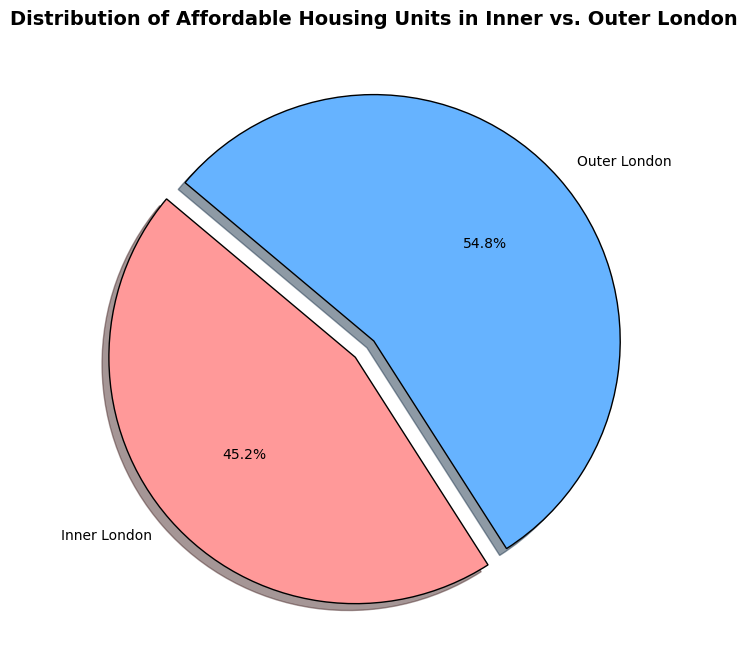

In [59]:
plt.figure(figsize=(8, 8))

# Define explode values
explode = (0.1, 0)  

# Create a pie chart
plt.pie(total_housing_by_region, labels=total_housing_by_region.index, autopct='%1.1f%%', 
        startangle=140, colors=['#ff9999','#66b3ff'], shadow=True, explode=explode, 
        wedgeprops={'edgecolor': 'black'})

plt.title('Distribution of Affordable Housing Units in Inner vs. Outer London', fontsize=14, fontweight='bold')
plt.show()


The pie chart illustrates the distribution of affordable housing units between Inner and Outer London. Notably, Outer London accounts for a slightly larger share with 54.8% of the affordable housing units compared to 45.2% in Inner London. This distribution highlights potential disparities in housing affordability and accessibility within the city, possibly reflecting variations in urban planning and development policies across different areas. Understanding these dynamics can inform targeted initiatives to balance housing equity across London.

In [60]:
# Create a bar
fig = px.bar(total_housing_by_region, 
             x=total_housing_by_region.index, 
             y=total_housing_by_region, 
             color=total_housing_by_region.index, 
             title="Total Affordable Housing Units in Inner vs. Outer London",
             labels={'x': 'Region', 'y': 'Total Housing Units'},
             color_discrete_sequence=px.colors.qualitative.Vivid)


fig.update_layout(
    xaxis_title='Region',
    yaxis_title='Total Affordable Housing Units',
    title_font_size=24,
    title_x=0.5,
    legend_title_text='Region',
    legend=dict(
        x=0.99, y=0.95,
        traceorder='normal',
        font=dict(size=12)
    ),
    plot_bgcolor='rgba(0,0,0,0)',
    paper_bgcolor='rgba(0,0,0,0)',
)

# Bar mode and add text on bars
fig.update_traces(
    text=total_housing_by_region,
    textposition='outside',
    marker_line_color='rgb(8,48,107)',
    marker_line_width=1.5,
    opacity=0.8
)

# Show the figure
fig.show()


The bar graph clearly depicts that Outer London has a slightly higher total number of affordable housing units compared to Inner London, with totals of 49,567 and 40,824 respectively. This aligns with the larger geographic area and potentially different development policies or availability of land in Outer London.

/Users/oladejiolajubu/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/Users/oladejiolajubu/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



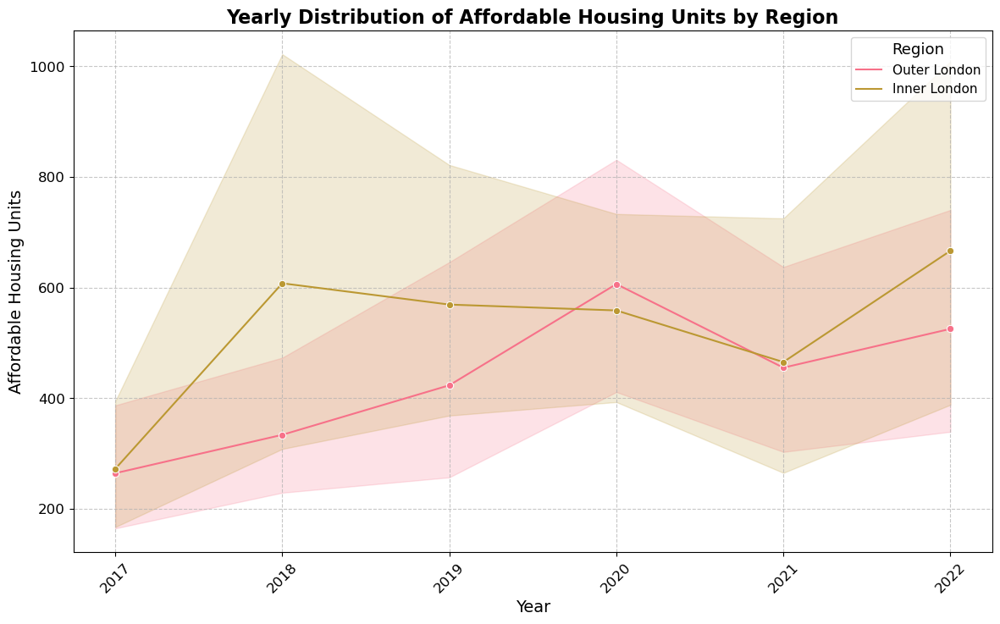

In [61]:
# Melt the DataFrame to make it suitable for time series plotting
df_melted = df_affordable_housing.melt(id_vars=['Borough', 'Inner_Outer_London'], value_vars=housing_columns, var_name='Year', value_name='Units')

# Convert 'Year' to extract just the year number for cleaner x-axis labels
df_melted['Year'] = df_melted['Year'].str.replace('affordable_housing_', '')

# Plotting
plt.figure(figsize=(14, 8))

# Set a color palette
sns.set_palette("husl")  
sns.lineplot(data=df_melted, x='Year', y='Units', hue='Inner_Outer_London', marker='o', style='Inner_Outer_London', dashes=False)

plt.title('Yearly Distribution of Affordable Housing Units by Region', fontsize=16, fontweight='bold')
plt.xlabel('Year', fontsize=14)
plt.ylabel('Affordable Housing Units', fontsize=14)
plt.legend(title='Region', title_fontsize='13', fontsize='11')
plt.xticks(rotation=45, fontsize=12)  # Make the year labels easier to read
plt.yticks(fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)  # Add grid lines

# Adding annotations for maximum points
for region in df_melted['Inner_Outer_London'].unique():
    max_units = df_melted[df_melted['Inner_Outer_London'] == region]['Units'].max()
    max_year = df_melted[(df_melted['Inner_Outer_London'] == region) & (df_melted['Units'] == max_units)]['Year'].values[0]
    plt.annotate(f'Max: {max_units}', xy=(max_year, max_units), xytext=(10, 10),
                 textcoords='offset points', arrowprops=dict(arrowstyle='->', color='black'), fontsize=10, color='black')

# Show the plot
plt.show()


This line graph shows fluctuations in the number of affordable housing units in Inner and Outer London over the years. Both regions show variability with Outer London generally maintaining a higher count than Inner London, particularly in 2022 after a noticeable dip in 2020 for both regions.

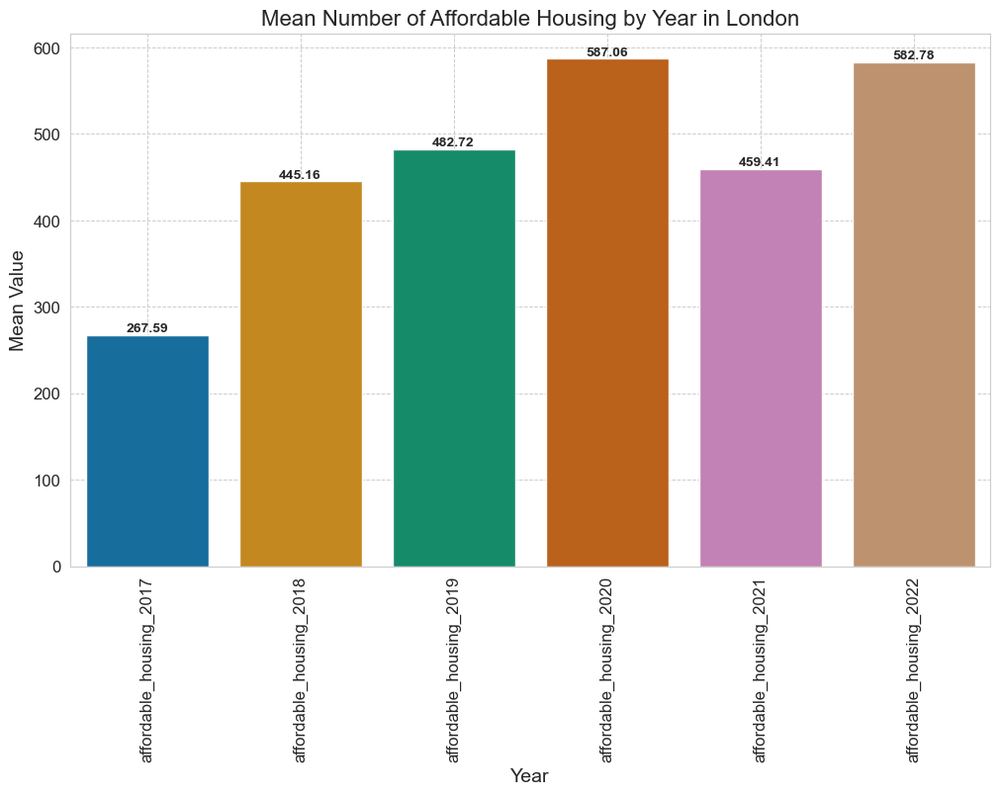

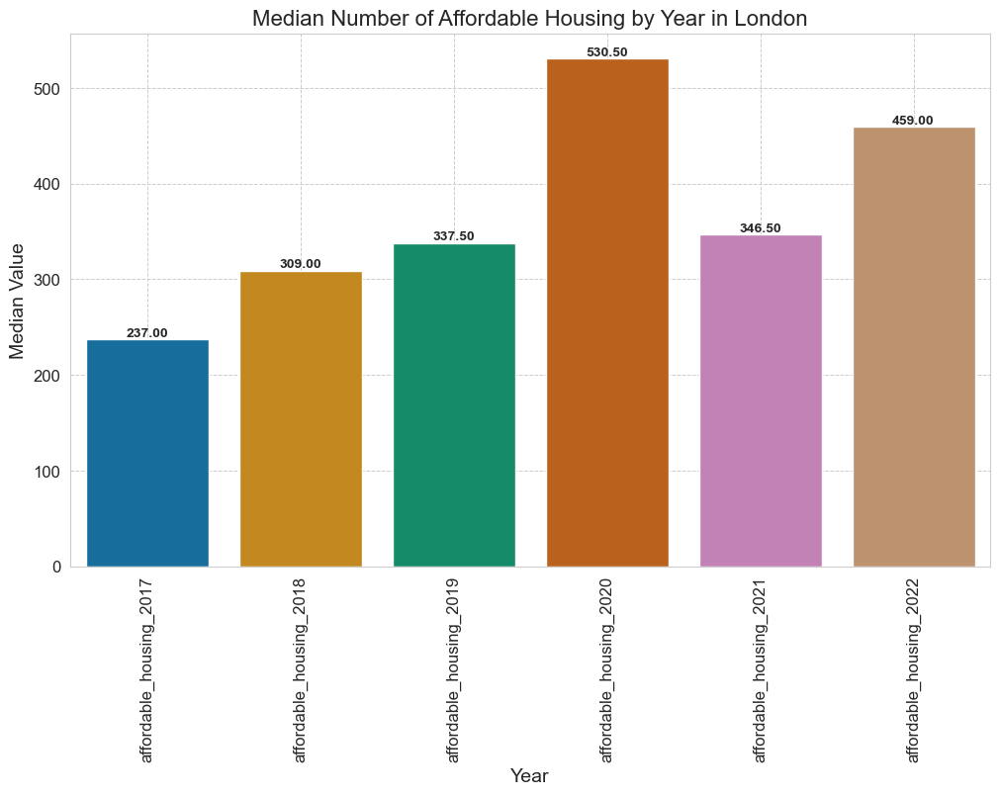

In [62]:
# Set the style for the plots
sns.set_style("whitegrid")

# Set the palette
custom_palette = sns.color_palette("colorblind")

# Transpose the summary statistics for better visualization
summary_stats = df_affordable_housing.describe().T

# Plot the means
plt.figure(figsize=(12, 7))
sns.barplot(x=summary_stats.index, y=summary_stats['mean'], palette=custom_palette)
plt.title('Mean Number of Affordable Housing by Year in London', fontsize=16)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Mean Value', fontsize=14)
plt.xticks(rotation=90, fontsize=12)
plt.yticks(fontsize=12)
plt.grid(True, which='both', linestyle='--', linewidth=0.7)

# Add annotations
for i, mean in enumerate(summary_stats['mean']):
    plt.text(i, mean + 0.5, f'{mean:.2f}', ha='center', va='bottom', fontsize=10, fontweight='bold')

plt.show()

# Plot the median values
plt.figure(figsize=(12, 7))
sns.barplot(x=summary_stats.index, y=summary_stats['50%'], palette=custom_palette)
plt.title('Median Number of Affordable Housing by Year in London', fontsize=16)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Median Value', fontsize=14)
plt.xticks(rotation=90, fontsize=12)
plt.yticks(fontsize=12)
plt.grid(True, which='both', linestyle='--', linewidth=0.7)

# Add annotations
for i, median in enumerate(summary_stats['50%']):
    plt.text(i, median + 0.5, f'{median:.2f}', ha='center', va='bottom', fontsize=10, fontweight='bold')

#show the plot
plt.show()


This bar graph indicates a general increase in the average number of affordable housing units per borough from 2017 onwards, with a peak in 2019 before a drop in 2020, likely influenced by external factors like economic or policy changes. Similar to the mean, the median number of units shows an initial increase, peaking in 2019 before decreasing in 2020 and then partially recovering. The median trend suggests that half of the boroughs exceed this count, providing insight into how widespread the increase in affordable housing is across London.

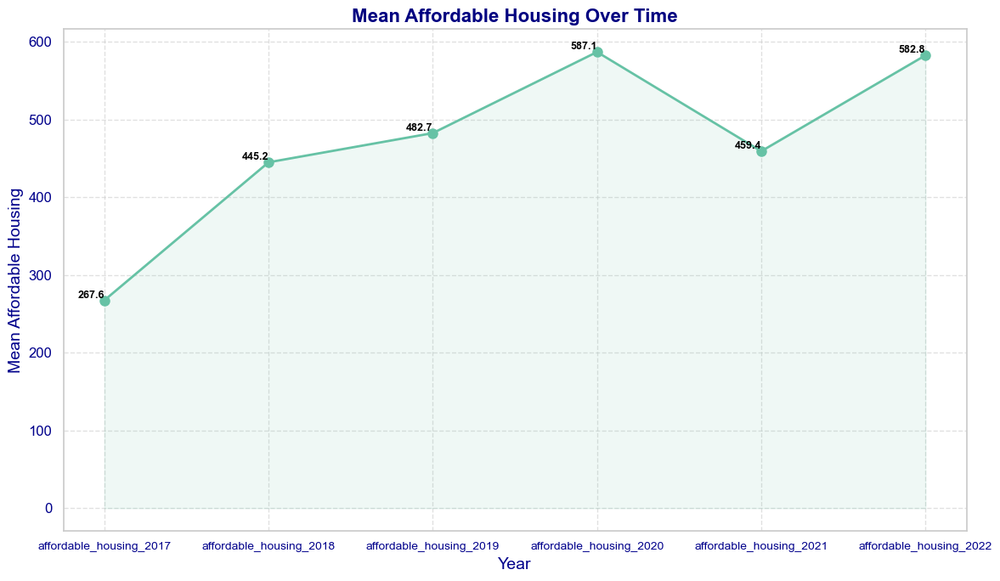

In [63]:
# Set a style for the plot
sns.set(style="whitegrid")

# Custom Color Palette
custom_palette = sns.color_palette("Set2")  

# Plot the mean affordable housing over time with a line plot
plt.figure(figsize=(12, 7))

# Plot with enhanced styling
plt.plot(summary_stats.index, summary_stats['mean'], marker='o', linestyle='-', color=custom_palette[0], linewidth=2, markersize=8)

# Add annotations to highlight specific points
for year, value in zip(summary_stats.index, summary_stats['mean']):
    plt.text(year, value, f'{value:.1f}', ha='right', va='bottom', fontsize=9, color='black', weight='bold')

# Add shaded area
plt.fill_between(summary_stats.index, summary_stats['mean'], color=custom_palette[0], alpha=0.1)

# Titles and labels
plt.title('Mean Affordable Housing Over Time', fontsize=16, fontweight='bold', color='navy')
plt.xlabel('Year', fontsize=14, color='darkblue')
plt.ylabel('Mean Affordable Housing', fontsize=14, color='darkblue')

# Customize the ticks
plt.xticks(rotation=0, fontsize=10, color='darkblue')
plt.yticks(fontsize=12, color='darkblue')

# Adding grid lines with dashed style
plt.grid(True, linestyle='--', alpha=0.6)

# Adjust layout to prevent overlapping elements
plt.tight_layout()

# Show the plot
plt.show()


This trend line reiterates the growth in the mean number of affordable housing units, highlighting the sharp increase up to 2019 and the significant dip in 2020, followed by a rebound in 2022. This visualization helps emphasize the overall trend amidst yearly fluctuations.

In [64]:
gdf_boroughs = gpd.read_file('London_Borough_Excluding_MHW.shp')
gdf_boroughs = gdf_boroughs.rename(columns={'NAME': 'Borough', 'GSS_CODE': 'Code'})
gdf_boroughs.head()

,Borough,Code,HECTARES,NONLD_AREA,ONS_INNER,SUB_2009,SUB_2006,geometry
0,Kingston upon Thames,E09000021,3726.117,0.000,F,None,None,"POLYGON ((516401.600 160201.800, 516407.300 16..."
1,Croydon,E09000008,8649.441,0.000,F,None,None,"POLYGON ((535009.200 159504.700, 535005.500 15..."
2,Bromley,E09000006,15013.487,0.000,F,None,None,"POLYGON ((540373.600 157530.400, 540361.200 15..."
3,Hounslow,E09000018,5658.541,60.755,F,None,None,"POLYGON ((521975.800 178100.000, 521967.700 17..."
4,Ealing,E09000009,5554.428,0.000,F,None,None,"POLYGON ((510253.500 182881.600, 510249.900 18..."


In [65]:
boroughs_to_delete = ['City of London']

# Filter out rows that belong to the specified boroughs
gdf_boroughs = gdf_boroughs[~gdf_boroughs['Borough'].isin(boroughs_to_delete)]
gdf_boroughs

,Borough,Code,HECTARES,NONLD_AREA,ONS_INNER,SUB_2009,SUB_2006,geometry
0,Kingston upon Thames,E09000021,3726.117,0.000,F,None,None,"POLYGON ((516401.600 160201.800, 516407.300 16..."
1,Croydon,E09000008,8649.441,0.000,F,None,None,"POLYGON ((535009.200 159504.700, 535005.500 15..."
2,Bromley,E09000006,15013.487,0.000,F,None,None,"POLYGON ((540373.600 157530.400, 540361.200 15..."
3,Hounslow,E09000018,5658.541,60.755,F,None,None,"POLYGON ((521975.800 178100.000, 521967.700 17..."
4,Ealing,E09000009,5554.428,0.000,F,None,None,"POLYGON ((510253.500 182881.600, 510249.900 18..."
5,Havering,E09000016,11445.735,210.763,F,None,None,"POLYGON ((549893.900 181459.800, 549894.600 18..."
6,Hillingdon,E09000017,11570.063,0.000,F,None,None,"POLYGON ((510599.800 191689.500, 510615.200 19..."
7,Harrow,E09000015,5046.330,0.000,F,None,None,"POLYGON ((510599.800 191689.500, 510660.000 19..."
8,Brent,E09000005,4323.270,0.000,F,None,None,"POLYGON ((525201.000 182512.600, 525181.500 18..."
9,Barnet,E09000003,8674.837,0.000,F,None,None,"POLYGON ((524579.900 198355.200, 524594.300 19..."


<Axes: >

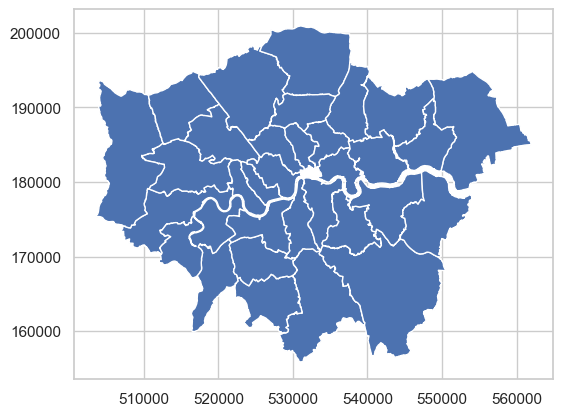

In [66]:
gdf_boroughs.plot()

In [67]:
gdf_boroughs.crs

<Projected CRS: PROJCS["OSGB36 / British National Grid",GEOGCS["OS ...>
Name: OSGB36 / British National Grid
Axis Info [cartesian]:
- [east]: Easting (metre)
- [north]: Northing (metre)
Area of Use:
- undefined
Coordinate Operation:
- name: unnamed
- method: Transverse Mercator
Datum: Ordnance Survey of Great Britain 1936
- Ellipsoid: Airy 1830
- Prime Meridian: Greenwich

In [68]:
housing_columns = [col for col in df_affordable_housing.columns if 'affordable_housing_' in col]

# Calculate the mean of these columns for each row
df_affordable_housing['Average Affordable Housing'] = df_affordable_housing[housing_columns].mean(axis=1)
df_affordable_housing.head()

,Borough,Code,Inner_Outer_London,affordable_housing_2017,affordable_housing_2018,affordable_housing_2019,affordable_housing_2020,affordable_housing_2021,affordable_housing_2022,Average Affordable Housing
0,Barking and Dagenham,E09000002,Outer London,312,194,549,1007,1587,941,765.000000
1,Barnet,E09000003,Outer London,235,963,325,415,805,1207,658.333333
2,Bexley,E09000004,Outer London,83,164,258,653,374,192,287.333333
3,Brent,E09000005,Outer London,499,70,2002,1650,491,461,862.166667
4,Bromley,E09000006,Outer London,6,281,125,23,285,136,142.666667


In [69]:
affordable_housing_merged_gdf = gdf_boroughs.merge(df_affordable_housing, on='Borough', how='left')
affordable_housing_merged_gdf = affordable_housing_merged_gdf.to_crs(gdf_boroughs.crs)
affordable_housing_merged_gdf.head()

,Borough,Code_x,HECTARES,NONLD_AREA,ONS_INNER,SUB_2009,SUB_2006,geometry,Code_y,Inner_Outer_London,affordable_housing_2017,affordable_housing_2018,affordable_housing_2019,affordable_housing_2020,affordable_housing_2021,affordable_housing_2022,Average Affordable Housing
0,Kingston upon Thames,E09000021,3726.117,0.000,F,None,None,"POLYGON ((516401.600 160201.800, 516407.300 16...",E09000021,Outer London,163,81,60,262,110,157,138.833333
1,Croydon,E09000008,8649.441,0.000,F,None,None,"POLYGON ((535009.200 159504.700, 535005.500 15...",E09000008,Outer London,282,540,697,1357,962,511,724.833333
2,Bromley,E09000006,15013.487,0.000,F,None,None,"POLYGON ((540373.600 157530.400, 540361.200 15...",E09000006,Outer London,6,281,125,23,285,136,142.666667
3,Hounslow,E09000018,5658.541,60.755,F,None,None,"POLYGON ((521975.800 178100.000, 521967.700 17...",E09000018,Outer London,535,356,612,716,540,911,611.666667
4,Ealing,E09000009,5554.428,0.000,F,None,None,"POLYGON ((510253.500 182881.600, 510249.900 18...",E09000009,Outer London,1138,1037,1092,948,898,1658,1128.500000


In [70]:
 # Create a GeoDataFrame using GeoPandas
gdf = gpd.GeoDataFrame(affordable_housing_merged_gdf, geometry='geometry')

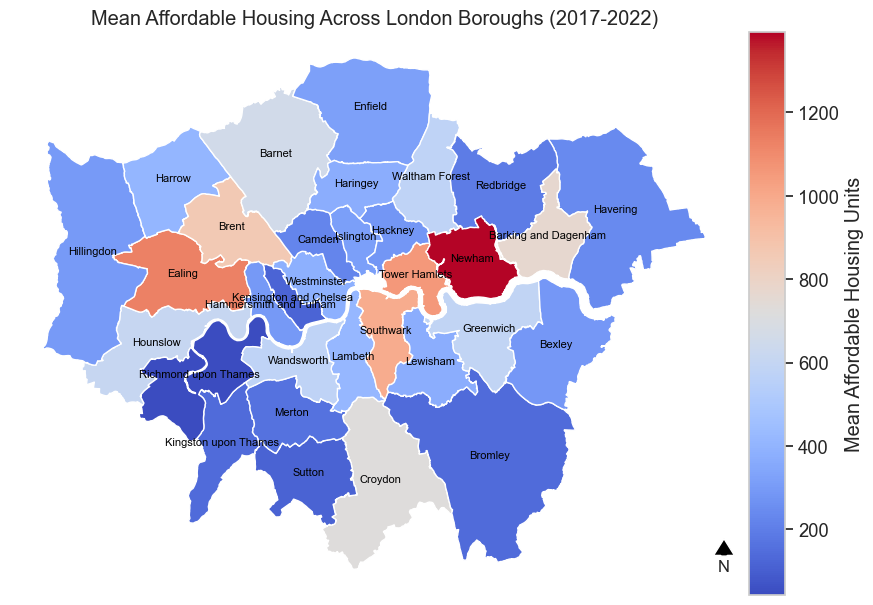

In [115]:
def plot_affordable_housing_distribution(gdf):
    # Create a plot
    fig, ax = plt.subplots(1, 1, figsize=(10, 10))
    plt.title('Mean Affordable Housing Across London Boroughs (2017-2022)')
    
    # Adding a North arrow
    x, y, arrow_length = 0.98, 0.1, 0.05
    ax.annotate('N', xy=(x, y), xytext=(x, y - arrow_length),
                arrowprops=dict(facecolor='black', width=5, headwidth=15),
                ha='center', va='center', fontsize=12, xycoords=ax.transAxes)
    
    # Adding annotations for borough names
    for idx, row in gdf.iterrows():
        ax.annotate(text=row['Borough'], xy=(row['geometry'].centroid.x, row['geometry'].centroid.y),
                    horizontalalignment='center', fontsize=8, color='black')
    
    # Setting up the color bar
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.1)

    # Plotting the data
    gdf.plot(column='Average Affordable Housing', ax=ax, legend=True, cax=cax,
             cmap='coolwarm', legend_kwds={'label': 'Mean Affordable Housing Units'})
    
    # Remove axis
    ax.set_axis_off()
    plt.show()


plot_affordable_housing_distribution(gdf) 


Newham stands out with the highest concentration of affordable housing units, with a mean close to or exceeding 1200 units. Barking and Dagenham, and Tower Hamlets also show significantly high numbers. On the other hand, boroughs such as Kingston upon Thames, Richmond upon Thames, and Merton exhibit much lower numbers of affordable housing units, as shown by their lighter blue coloring. 

This distribution provides critical insights into the geographical spread of affordable housing within London, highlighting areas where affordable housing is most and least prevalent. Such data is essential for policy makers to identify areas that may require more attention or resources to balance the availability of affordable housing across the city.

### 5.1.2 Overview of Housing Tenure

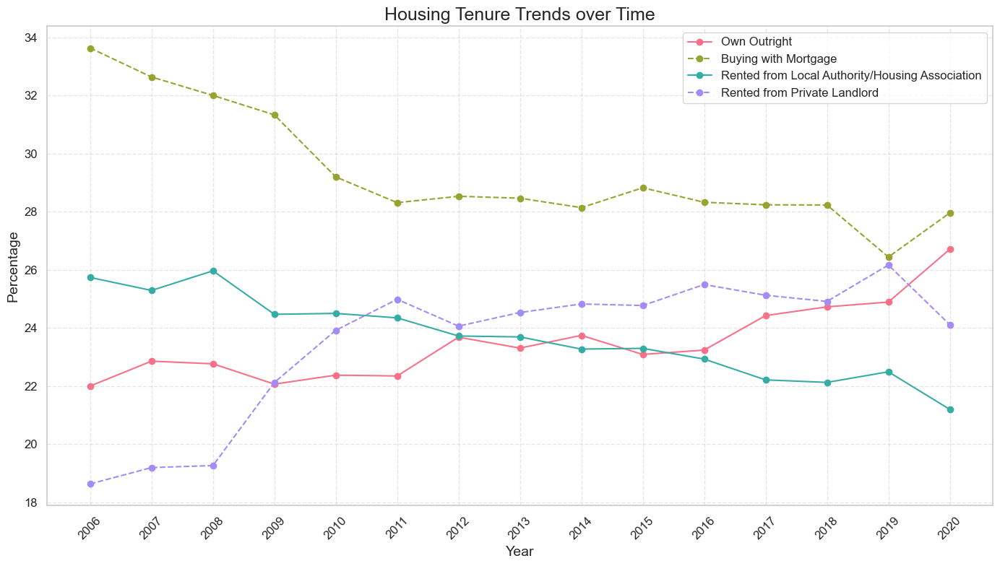

In [72]:
# Custom Color Palette
custom_palette = sns.color_palette("husl", 4)  

# Years for which data is available
years = list(range(2006, 2021))

# List of columns for each housing category by year
own_outright = [f'Own Outright_{year}' for year in years]
buying_mortgage = [f'Buying with mortgage_{year}' for year in years]
rented_local = [f'Rented from Local Authority or Housing Association_{year}' for year in years]
rented_private = [f'Rented from Private landlord_{year}' for year in years]

# Plotting housing statistics over the years for each category
plt.figure(figsize=(14, 8))
plt.plot(years, df_housing_tenure[own_outright].mean(), marker='o', label='Own Outright', color=custom_palette[0], linestyle='-')
plt.plot(years, df_housing_tenure[buying_mortgage].mean(), marker='o', label='Buying with Mortgage', color=custom_palette[1], linestyle='--')
plt.plot(years, df_housing_tenure[rented_local].mean(), marker='o', label='Rented from Local Authority/Housing Association', color=custom_palette[2], linestyle='-')
plt.plot(years, df_housing_tenure[rented_private].mean(), marker='o', label='Rented from Private Landlord', color=custom_palette[3], linestyle='--')
plt.title('Housing Tenure Trends over Time', fontsize=18)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Percentage', fontsize=14)
plt.xticks(years, rotation=45, fontsize=12)
plt.yticks(fontsize=12)
plt.legend(fontsize=12)
plt.grid(True, linestyle='--', alpha=0.5)  # Adding grid lines with dashed style
plt.tight_layout()  # Adjust layout to prevent overlapping elements

# Show plot
plt.show()


The line graph provides an overview of the trends in housing tenure types in London over the period from 2006 to 2020.

The decline in homeownership (both outright and with a mortgage) coupled with the rise in private rentals could be indicative of a broader shift in the housing market towards rental due to the high cost of property in London. The relatively stable and slightly increasing trend in social housing rentals may indicate sustained government support for affordable housing, but also underscores the ongoing need in the context of overall housing market dynamics.

These trends are crucial for understanding shifts in the housing market, impacting urban planning, housing policy, and economic factors in London.

### 5.1.3 Overview of Population

/Users/oladejiolajubu/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/Users/oladejiolajubu/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



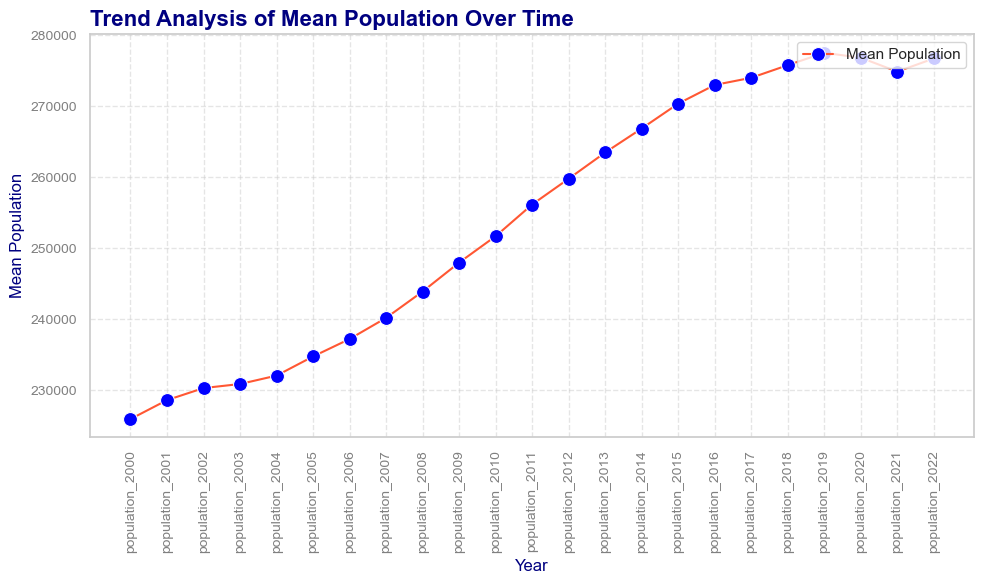

In [73]:
# Select only the numeric columns
numeric_df = df_population.select_dtypes(include='number')

# Calculate the mean values for each year
mean_population = numeric_df.mean()

# Plotting the trend analysis 
plt.figure(figsize=(10, 6))

# Add a background gradient
sns.set(style="whitegrid")
ax = sns.lineplot(data=mean_population, marker='o', linestyle='-', color='#FF5733')

# Apply shadow effect
ax.set_rasterized(True)

# Customise marker 
plt.setp(ax.lines, markersize=10, markerfacecolor='blue')

# Title and Label Styles
plt.title('Trend Analysis of Mean Population Over Time', fontsize=16, fontweight='bold', color='navy', loc='left')
plt.xlabel('Year', fontsize=12, color='navy')
plt.ylabel('Mean Population', fontsize=12, color='navy')

# Grid Style
plt.grid(True, linestyle='--', alpha=0.5)

# Adjust x-axis and y-axis labels
plt.xticks(rotation=90, fontsize=10, color='gray')
plt.yticks(fontsize=10, color='gray')

# Legend (if applicable)
plt.legend(['Mean Population'], loc='upper right')

plt.tight_layout()

# Show plot
plt.show()


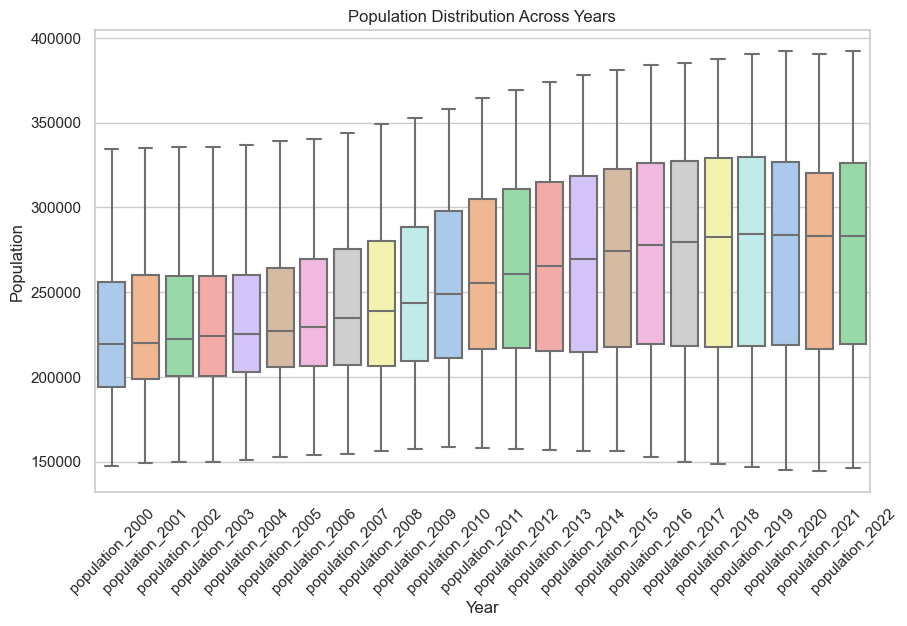

In [74]:
# Box Plot for Population Distribution
plt.figure(figsize=(10, 6))
sns.boxplot(data=df_population, palette='pastel')
plt.title('Population Distribution Across Years')
plt.xlabel('Year')
plt.ylabel('Population')
plt.xticks(rotation=45)
plt.show()

There is a clear upward trend in the median population over the years, indicating consistent population growth across the London boroughs. This can be inferred from the median line within each box moving upward over the timeline.

The range of the population within each year (indicated by the height of each box and the lines extending from them) suggests variability in population sizes across different boroughs. The expansion of the boxes over time also suggests increasing variance or disparities in population sizes among boroughs.

### 5.1.4 Overview of Unemployment

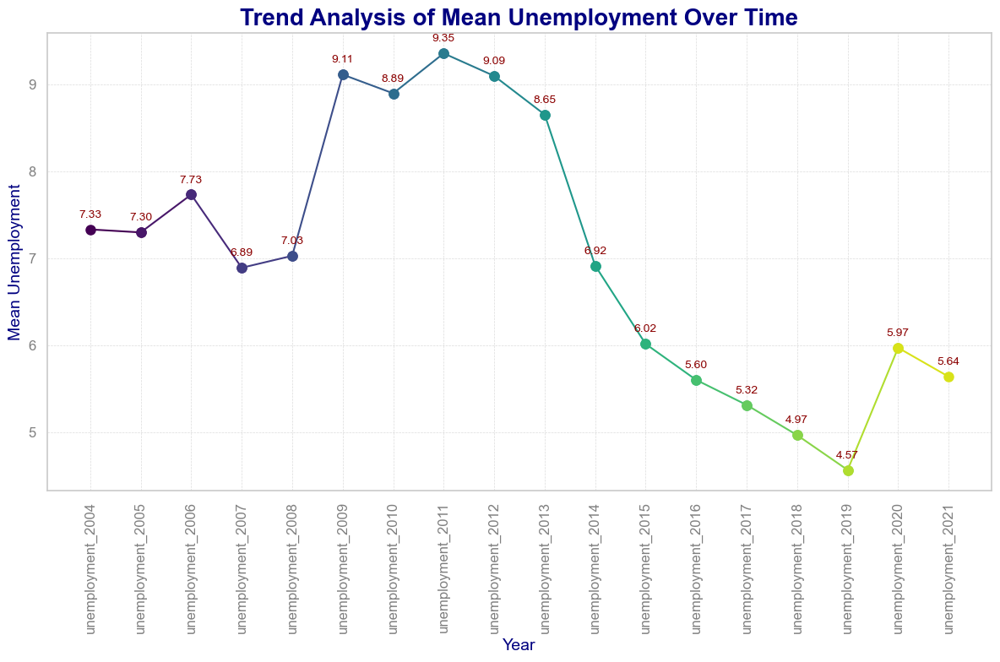

In [75]:
# Select only the numeric columns
numeric_df = df_unemployment.select_dtypes(include='number')

# Calculate the mean values for each year
mean_unemployment = numeric_df.mean()

# Plotting the trend analysis
plt.figure(figsize=(12, 8))

# Use a colormap for the line
colors = plt.cm.viridis(np.linspace(0, 1, len(mean_unemployment)))

# Plot each segment with different colors
for i in range(len(mean_unemployment) - 1):
    plt.plot(mean_unemployment.index[i:i+2], mean_unemployment.values[i:i+2], marker='o', linestyle='-', color=colors[i], markersize=8)

# Adding annotations for each year
for i in range(len(mean_unemployment)):
    plt.annotate(f'{mean_unemployment.values[i]:.2f}', 
                 (mean_unemployment.index[i], mean_unemployment.values[i]), 
                 textcoords="offset points", 
                 xytext=(0, 10), 
                 ha='center', 
                 fontsize=10, 
                 color='darkred')

# Title and labels
plt.title('Trend Analysis of Mean Unemployment Over Time', fontsize=20, fontweight='bold', color='navy')
plt.xlabel('Year', fontsize=14, color='navy')
plt.ylabel('Mean Unemployment', fontsize=14, color='navy')

# Enhanced grid
plt.grid(True, linestyle='--', linewidth=0.5, alpha=0.7)

# Customizing x and y ticks
plt.xticks(rotation=90, fontsize=12, color='gray')
plt.yticks(fontsize=12, color='gray')

# Adjust layout to prevent overlapping
plt.tight_layout()

# Show plot
plt.show()


This line graph presents the overall mean unemployment rates from 2004 to 2021, illustrating significant fluctuations.

Notable peaks occur around 2009 and 2011, likely reflecting economic downturns or policy shifts, followed by a substantial decrease leading into 2019.

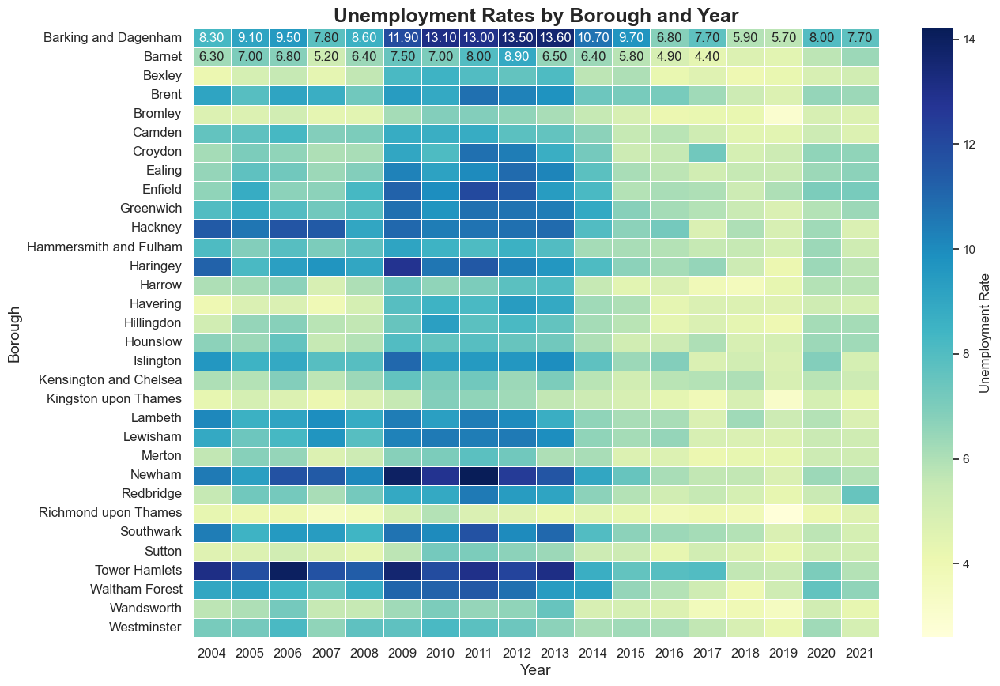

In [76]:
# Melt the DataFrame
df_melted = df_unemployment.melt(id_vars=["Borough", "Code", "Inner_Outer_London"], var_name="Year", value_name="Unemployment Rate")
df_melted['Year'] = df_melted['Year'].str.replace('unemployment_', '').astype(int)

# pivot table creation
heatmap_data = df_melted.pivot(index="Borough", columns="Year", values="Unemployment Rate")

# Setting the theme
plt.figure(figsize=(14, 10)) 

# Customize the heatmap
sns.heatmap(
    heatmap_data, 
    annot=True, 
    cmap='YlGnBu', 
    fmt='.2f', 
    linewidths=.5,  # Add grid lines
    cbar_kws={'label': 'Unemployment Rate'}  # Add color bar label
)

# plot the heatmap
plt.title('Unemployment Rates by Borough and Year', fontsize=18, fontweight='bold')
plt.xlabel('Year', fontsize=14)
plt.ylabel('Borough', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12, rotation=0)  

# Show plot
plt.show()


The heatmap offers a visual comparison across boroughs and years, highlighting areas and times with higher unemployment rates. Darker colors indicate higher unemployment rates, such as in Barking and Dagenham around 2012 and 2013, Tower Hamlets in 2006, 2009 and 2013 which consistently shows high rates.

In [77]:
# Plot an interactive line plot
fig = px.line(df_melted, x='Year', y='Unemployment Rate', color='Borough', title='Interactive Unemployment Rate by Borough over Years')
fig.update_xaxes(dtick=1)  
fig.show()


This multi-line chart shows the unemployment rates for each borough over time, revealing distinct patterns and spikes in certain areas. The visualization allows for comparisons between boroughs, identifying those that have managed to reduce unemployment effectively versus those that have struggled.

In [78]:
unemployment_columns = [col for col in df_unemployment.columns if 'unemployment_' in col]

# Calculate the mean of these columns for each row
df_unemployment['Average Unemployment Rate'] = df_unemployment[unemployment_columns].mean(axis=1)
df_unemployment.head()

,Borough,Code,Inner_Outer_London,unemployment_2004,unemployment_2005,unemployment_2006,unemployment_2007,unemployment_2008,unemployment_2009,unemployment_2010,...,unemployment_2013,unemployment_2014,unemployment_2015,unemployment_2016,unemployment_2017,unemployment_2018,unemployment_2019,unemployment_2020,unemployment_2021,Average Unemployment Rate
0,Barking and Dagenham,E09000002,Outer London,8.3,9.1,9.5,7.8,8.6,11.9,13.1,...,13.6,10.7,9.7,6.8,7.7,5.9,5.7,8.0,7.7,9.477778
1,Barnet,E09000003,Outer London,6.3,7.0,6.8,5.2,6.4,7.5,7.0,...,6.5,6.4,5.8,4.9,4.4,4.7,4.5,5.7,6.4,6.244444
2,Bexley,E09000004,Outer London,4.1,5.0,5.5,4.4,5.6,8.2,8.5,...,8.1,5.7,6.0,4.2,4.6,4.0,4.2,4.9,5.1,5.761111
3,Brent,E09000005,Outer London,9.1,7.9,9.1,8.7,7.3,9.4,8.9,...,9.8,7.4,7.1,7.1,6.3,5.3,4.7,6.5,6.4,7.894444
4,Bromley,E09000006,Outer London,4.7,4.7,5.1,4.4,4.5,6.2,6.9,...,6.1,5.5,4.9,4.1,4.2,4.2,3.0,4.9,4.7,5.088889


In [79]:
unemployment_merged_gdf = gdf_boroughs.merge(df_unemployment, on='Borough', how='left')
unemployment_merged_gdf.head()

,Borough,Code_x,HECTARES,NONLD_AREA,ONS_INNER,SUB_2009,SUB_2006,geometry,Code_y,Inner_Outer_London,...,unemployment_2013,unemployment_2014,unemployment_2015,unemployment_2016,unemployment_2017,unemployment_2018,unemployment_2019,unemployment_2020,unemployment_2021,Average Unemployment Rate
0,Kingston upon Thames,E09000021,3726.117,0.000,F,None,None,"POLYGON ((516401.600 160201.800, 516407.300 16...",E09000021,Outer London,...,5.6,5.3,4.9,4.4,3.8,4.9,3.2,5.0,4.3,4.977778
1,Croydon,E09000008,8649.441,0.000,F,None,None,"POLYGON ((535009.200 159504.700, 535005.500 15...",E09000008,Outer London,...,8.7,7.2,5.3,5.5,7.3,5.0,5.3,6.6,6.6,7.094444
2,Bromley,E09000006,15013.487,0.000,F,None,None,"POLYGON ((540373.600 157530.400, 540361.200 15...",E09000006,Outer London,...,6.1,5.5,4.9,4.1,4.2,4.2,3.0,4.9,4.7,5.088889
3,Hounslow,E09000018,5658.541,60.755,F,None,None,"POLYGON ((521975.800 178100.000, 521967.700 17...",E09000018,Outer London,...,7.3,6.0,5.1,5.3,6.0,4.9,5.0,6.4,6.3,6.411111
4,Ealing,E09000009,5554.428,0.000,F,None,None,"POLYGON ((510253.500 182881.600, 510249.900 18...",E09000009,Outer London,...,10.2,7.8,6.1,5.7,5.1,5.5,5.4,6.4,6.7,7.450000


In [80]:
 # Create a GeoDataFrame using GeoPandas
gdf1 = gpd.GeoDataFrame(unemployment_merged_gdf, geometry='geometry')

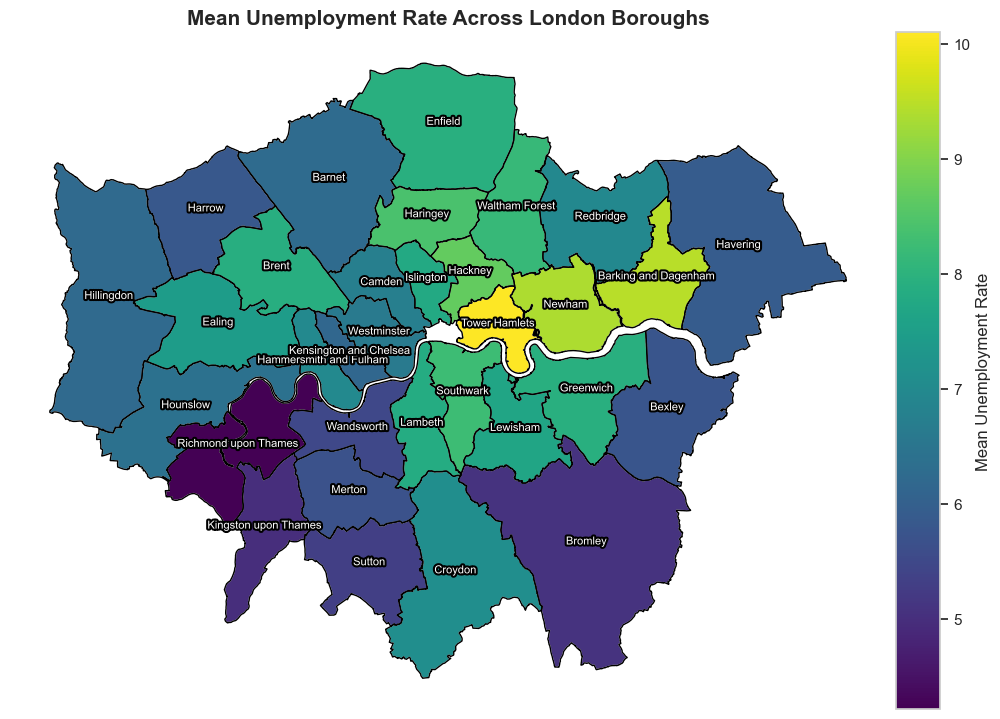

In [81]:
def plot_unemployment_rate_distribution(gdf1):
    # Create a plot
    fig, ax = plt.subplots(1, 1, figsize=(12, 12))
    plt.title('Mean Unemployment Rate Across London Boroughs', fontsize=15, fontweight='bold')
    
    # Setting up the color bar
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.1)

    # Plotting the data
    gdf1.boundary.plot(ax=ax, linewidth=1, color='black')  # Add borough boundaries
    gdf1.plot(column='Average Unemployment Rate', ax=ax, legend=True, cax=cax,
              cmap='viridis', legend_kwds={'label': 'Mean Unemployment Rate', 'orientation': 'vertical'})
   
    # Remove axis
    ax.set_axis_off()

    # Annotate borough names
    for x, y, label in zip(gdf1.geometry.centroid.x, gdf1.geometry.centroid.y, gdf1['Borough']):
        ax.text(x, y, label, fontsize=8, ha='center', color='white', 
                path_effects=[path_effects.withStroke(linewidth=3, foreground="black")])
    
    # Show plot
    plt.show()


plot_unemployment_rate_distribution(gdf1)

Areas such as Richmond upon Thames and Kingston upon Thames exhibit lower unemployment rates, indicated by darker blue, while boroughs like Barking and Dagenham, Newham and Tower Hamlets show higher rates in yellow.


### 5.1.5 Overview of Income

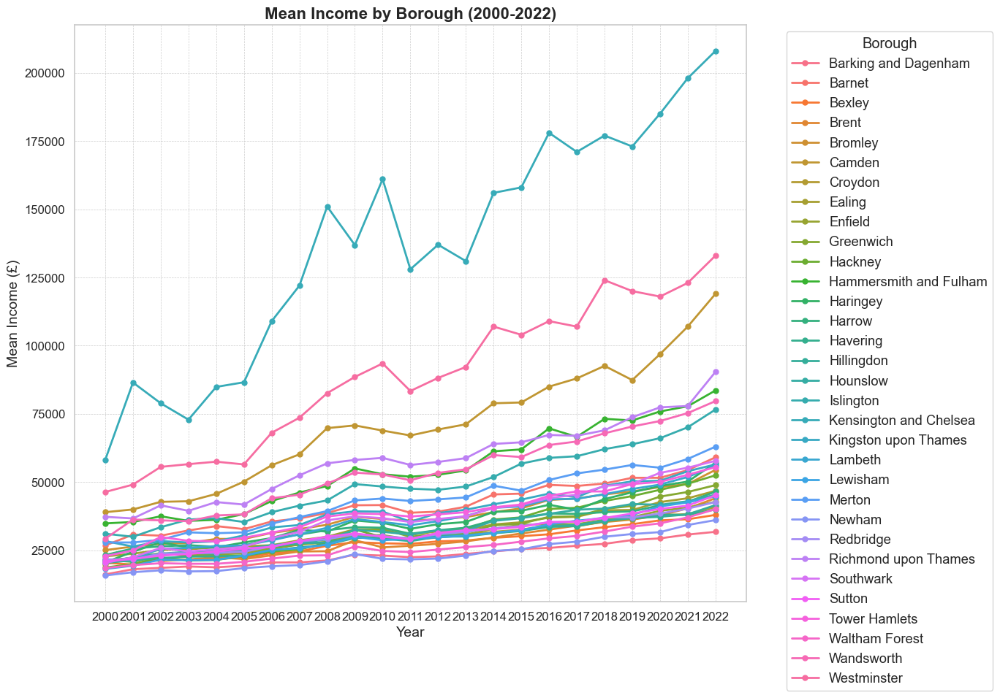

In [116]:
# Convert years to a single column
df_melted_income = df_income.melt(id_vars=["Borough", "Code", "Inner_Outer_London"], var_name="Year", value_name="Mean Income")

# Remove the 'income_' prefix from the 'Year' column
df_melted_income['Year'] = df_melted_income['Year'].str.replace('income_', '')

# Convert 'Year' from string to integer
df_melted_income['Year'] = df_melted_income['Year'].astype(int)

# Selecting boroughs for visualization
selected_boroughs = df_income['Borough']
df_selected = df_melted_income[df_melted_income['Borough'].isin(selected_boroughs)]

# Set a color palette
sns.set_palette('husl', len(selected_boroughs))

# Plotting
plt.figure(figsize=(14, 10))
for label, grp in df_selected.groupby('Borough'):
    plt.plot(grp['Year'], grp['Mean Income'], marker='o', linestyle='-', linewidth=2, markersize=5, label=label)

plt.title('Mean Income by Borough (2000-2022)', fontsize=16, fontweight='bold')
plt.xlabel('Year', fontsize=14)
plt.ylabel('Mean Income (£)', fontsize=14)
plt.legend(title='Borough', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', linewidth=0.5)
plt.xticks(range(df_melted_income['Year'].min(), df_melted_income['Year'].max() + 1))
plt.yticks(fontsize=12)
plt.xticks(fontsize=12)
plt.tight_layout()

# Show the plot
plt.show()

This line graph shows the mean income trend for various London boroughs from 2000 to 2022. A significant increase in mean income can be seen. The diverging lines between boroughs such as Barking and Dagenham, and Kensington and Chelsea, illustrate the widening income gap, highlighting socioeconomic disparities that can influence access to services like housing.

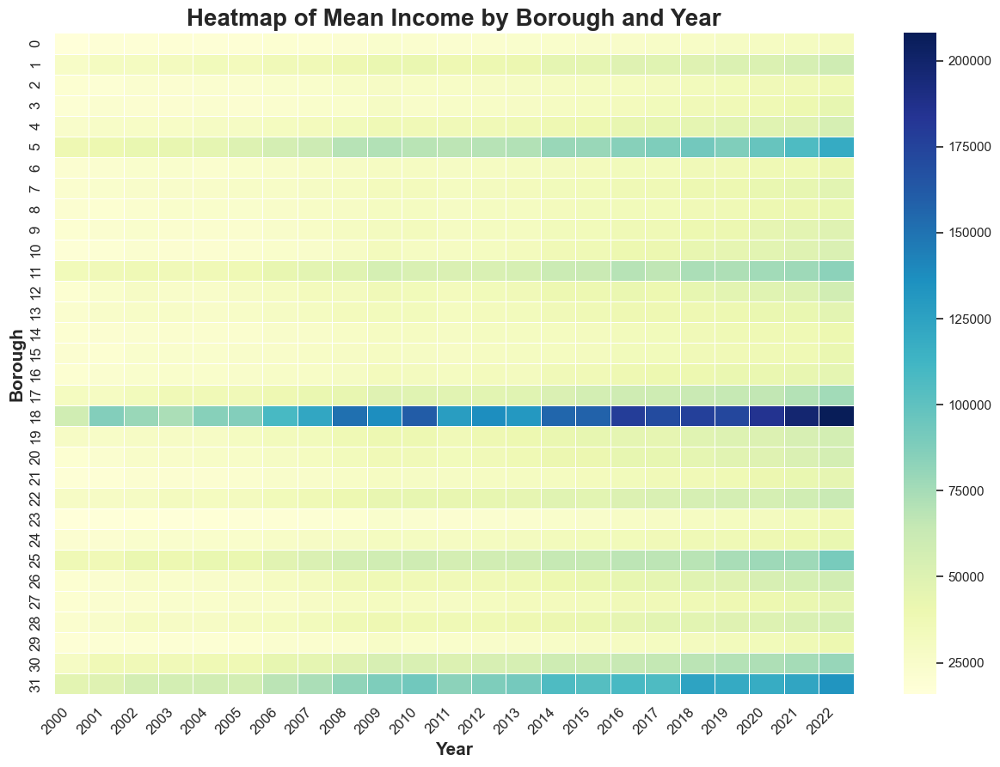

In [83]:
df_income_clean = df_income.copy()

# Apply the conversion only to year columns
year_columns = [col for col in df_income.columns if 'income_' in col]  
new_column_names = {year: year.replace('income_', '') for year in year_columns}  

# Rename the year columns
df_income_clean.rename(columns=new_column_names, inplace=True)

plt.figure(figsize=(15, 10))  # Adjust the figure size t

# Convert year columns to numeric to ensure correct sorting
year_columns = [col for col in df_income_clean.columns if col.isdigit()]  
year_columns_sorted = sorted(year_columns, key=int)  

# Heatmap creation 
sns.heatmap(df_income_clean[year_columns_sorted].astype(float), 
            cmap='YlGnBu',  
            annot=False,  # Remove annotations
            linewidths=0.5, linecolor='white')  

# Add titles and labels 
plt.title('Heatmap of Mean Income by Borough and Year', fontsize=20, fontweight='bold')
plt.xlabel('Year', fontsize=15, fontweight='bold')
plt.ylabel('Borough', fontsize=15, fontweight='bold')

# Customize x-tick and y-tick labels
plt.xticks(rotation=45, ha='right', fontsize=12)  # Rotate the x-tick labels for better readability
plt.yticks(fontsize=12)  

# Show the heatmap
plt.show()

The heatmap complements the line graph by visually representing income levels across different boroughs over the same period using color gradients. Darker shades indicate higher incomes, clearly showing that certain boroughs especially Kensington and Chelsea consistently have higher income levels.

### 5.1.6 Overview of Crimes

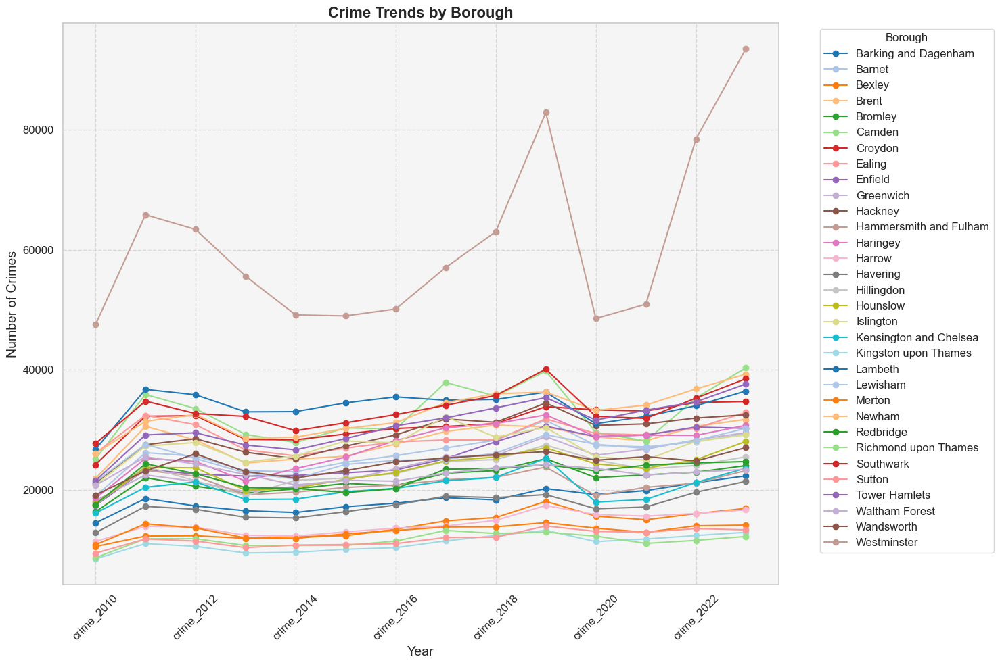

In [84]:
crime_years = df_crime.columns[df_crime.columns.str.startswith('crime_')]
df_crime.set_index('Borough', inplace=True)

# Plotting
plt.figure(figsize=(15, 10))

# Use a color palette
palette = sns.color_palette('tab20', len(df_crime.index))

# Plot each borough's crime trend with markers
for i, borough in enumerate(df_crime.index):
    df_crime.loc[borough, crime_years].plot(label=borough, color=palette[i], marker='o')

# Adding enhancements
plt.title('Crime Trends by Borough', fontsize=16, fontweight='bold')
plt.xlabel('Year', fontsize=14)
plt.ylabel('Number of Crimes', fontsize=14)
plt.legend(title='Borough', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=12)
plt.xticks(rotation=45, fontsize=12)
plt.yticks(fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)
plt.gca().set_facecolor('#f5f5f5')  # Light grey background

plt.tight_layout()

# Show the plot
plt.show()


This graph displays the number of crimes in each borough from 2010 to 2022. Westminster stands out with a significantly higher crime rate, peaking dramatically around 2019 and again in 2023. This could be due to it being a central and densely populated area with high tourist traffic.

Other boroughs show more stable but increasing trends over the years, reflecting general crime trends in urban areas possibly influenced by economic factors and population density.

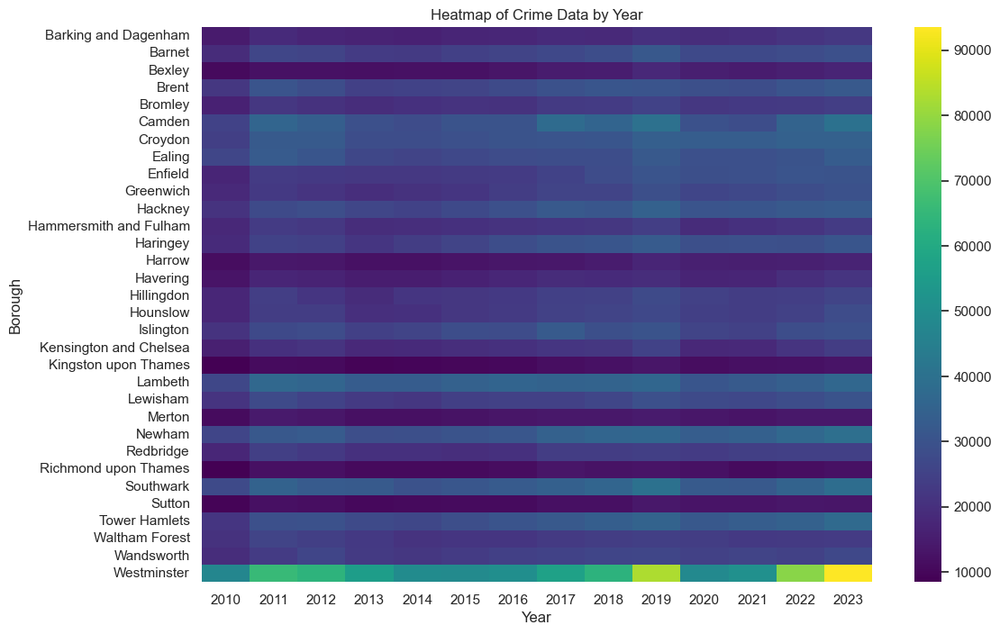

In [85]:
df_crime_clean = df_crime.copy()

# Isolate columns that begin with 'crime_' and are thus year columns
year_columns = [col for col in df_crime.columns if col.startswith('crime_')]

# Create a dictionary to map old column names to new ones without 'crime_'
new_column_names = {col: col.replace('crime_', '') for col in year_columns}

# Rename the columns using the dictionary
df_crime_clean.rename(columns=new_column_names, inplace=True)

# Ensure that only the crime data columns are converted to float for visualization
crime_data_columns = df_crime_clean.columns[df_crime_clean.columns.str.isnumeric()]

# Convert these columns to float
df_crime_clean[crime_data_columns] = df_crime_clean[crime_data_columns].astype(float)

plt.figure(figsize=(12, 8))
sns.heatmap(df_crime_clean.sort_index(axis=1)[crime_data_columns], cmap='viridis', annot=False)
plt.title('Heatmap of Crime Data by Year')
plt.xlabel('Year')
plt.ylabel('Borough')

# Show plot
plt.show()

The heatmap provides a visual representation of crime rates across different years and boroughs, using color intensity to indicate the frequency of crimes. Darker shades represent higher crime rates.

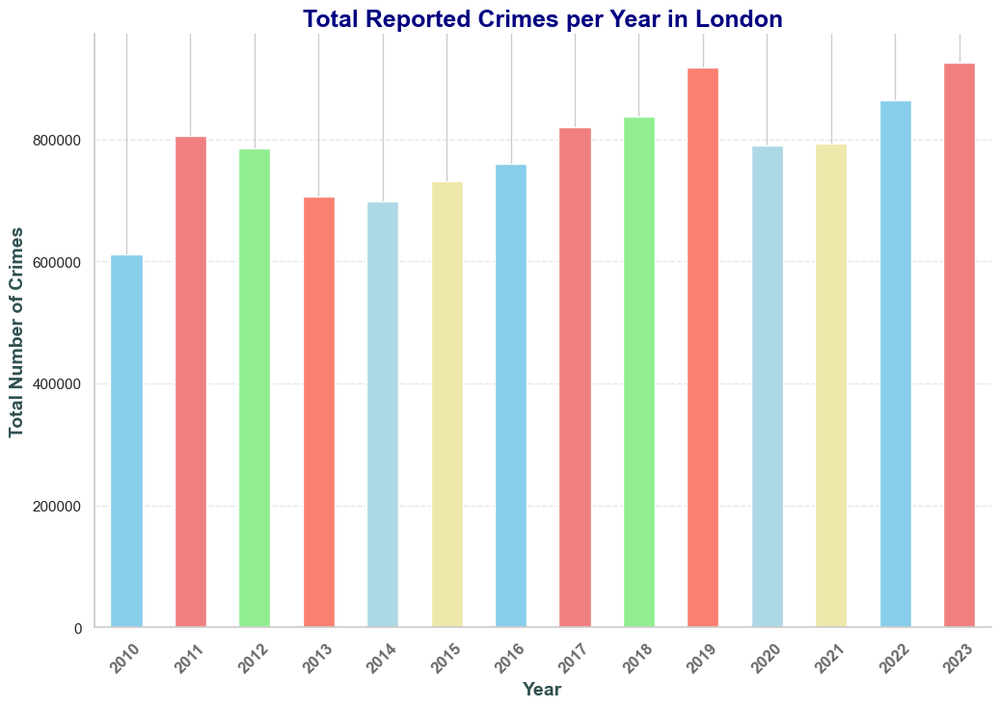

In [86]:
df_crime_totals = df_crime[crime_years].sum().rename(lambda x: x.replace('crime_', '')).astype(int)


# Select a color palette
colors = ['skyblue', 'lightcoral', 'lightgreen', 'salmon', 'lightblue', 'palegoldenrod']

# Plot the data
df_crime_totals.plot(kind='bar', color=colors, figsize=(12, 8))

# Set title and labels 
plt.title('Total Reported Crimes per Year in London', fontsize=18, fontweight='bold', color='navy')
plt.xlabel('Year', fontsize=14, fontweight='bold', color='darkslategray')
plt.ylabel('Total Number of Crimes', fontsize=14, fontweight='bold', color='darkslategray')

# Rotate x-axis labels for better readability
plt.xticks(rotation=45, fontsize=12, fontweight='bold', color='dimgray')

# Remove unnecessary spines
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

# Add gridlines for better alignment
plt.grid(axis='y', linestyle='--', alpha=0.5)

# Show the plot
plt.show()


The graph shows the total number of reported crimes across London from 2010 to 2023. There is a general increase in crime numbers, with notable peaks around 2019 and 2023. 

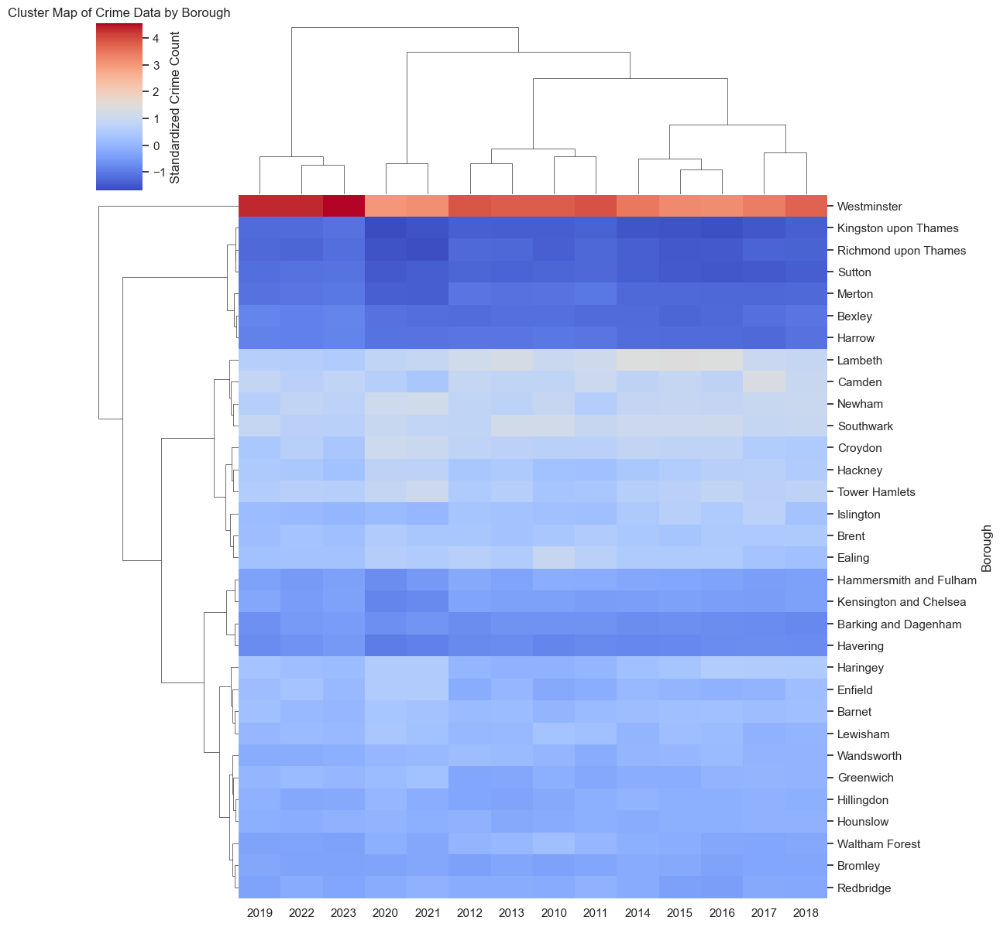

In [87]:
# Drop non-numeric columns
crime_numeric_df = df_crime_clean.drop(['Code', 'Inner_Outer_London'], axis=1)

# Convert all columns to numeric
crime_numeric_df = crime_numeric_df.apply(pd.to_numeric, errors='coerce')

# Standardize the data by subtracting the mean and dividing by the standard deviation
standardized_df = (crime_numeric_df - crime_numeric_df.mean()) / crime_numeric_df.std()

# Cluster map analysis
sns.clustermap(standardized_df, method='ward', cmap='coolwarm', figsize=(12, 12),
               cbar_kws={'label': 'Standardized Crime Count'})
plt.title('Cluster Map of Crime Data by Borough')

# Show the plot
plt.show()

This cluster analysis groups boroughs based on the similarity of their crime profiles over the years, providing a standardized crime count. Boroughs like Westminster, Kingston upon Thames, and Richmond upon Thames are highlighted, showing distinct patterns either due to higher or lower crime rates.

In [88]:
df_crime

,Code,Inner_Outer_London,crime_2010,crime_2011,crime_2012,crime_2013,crime_2014,crime_2015,crime_2016,crime_2017,crime_2018,crime_2019,crime_2020,crime_2021,crime_2022,crime_2023
Borough,,,,,,,,,,,,,,,,
Barking and Dagenham,E09000002,Outer London,14454,18533,17297,16500,16210,17167,17753,18670,18310,20201,19187,19853,21172,22306
Barnet,E09000003,Outer London,18937,26174,25595,23163,23000,24584,25678,26957,28263,31577,27390,27146,28000,29335
Bexley,E09000004,Outer London,10526,12283,12333,11896,12187,12335,13399,14804,15369,18062,15601,14997,16018,16895
Brent,E09000005,Outer London,21867,30556,28287,24457,25103,25579,27618,29707,30778,30451,28800,28156,30570,31731
Bromley,E09000006,Outer London,16314,22007,20586,19422,20152,21055,20692,22751,23187,25176,22013,22478,22919,24029
Camden,E09000007,Inner London,25107,35889,33520,29218,27880,30292,30130,37892,35606,39785,29574,28111,35283,40326
Croydon,E09000008,Outer London,24180,32252,32351,28381,28321,29290,30203,30540,31015,33853,33313,33128,34551,34698
Ealing,E09000009,Outer London,26076,32404,30841,26645,25647,26946,27966,28306,28294,31823,29361,29147,30258,32890
Enfield,E09000010,Outer London,17358,23373,22608,22266,22370,22812,23297,25192,28000,30588,28862,29124,30445,30236


In [89]:
# Resetting the index will move 'Borough' from index to a regular column
df_crime = df_crime.reset_index()

df_crime.rename(columns={'index': 'Borough'}, inplace=True)

# Display the first few rows to verify the change
df_crime.head()


,Borough,Code,Inner_Outer_London,crime_2010,crime_2011,crime_2012,crime_2013,crime_2014,crime_2015,crime_2016,crime_2017,crime_2018,crime_2019,crime_2020,crime_2021,crime_2022,crime_2023
0,Barking and Dagenham,E09000002,Outer London,14454,18533,17297,16500,16210,17167,17753,18670,18310,20201,19187,19853,21172,22306
1,Barnet,E09000003,Outer London,18937,26174,25595,23163,23000,24584,25678,26957,28263,31577,27390,27146,28000,29335
2,Bexley,E09000004,Outer London,10526,12283,12333,11896,12187,12335,13399,14804,15369,18062,15601,14997,16018,16895
3,Brent,E09000005,Outer London,21867,30556,28287,24457,25103,25579,27618,29707,30778,30451,28800,28156,30570,31731
4,Bromley,E09000006,Outer London,16314,22007,20586,19422,20152,21055,20692,22751,23187,25176,22013,22478,22919,24029


### 5.1.7 Overview of Education Levels

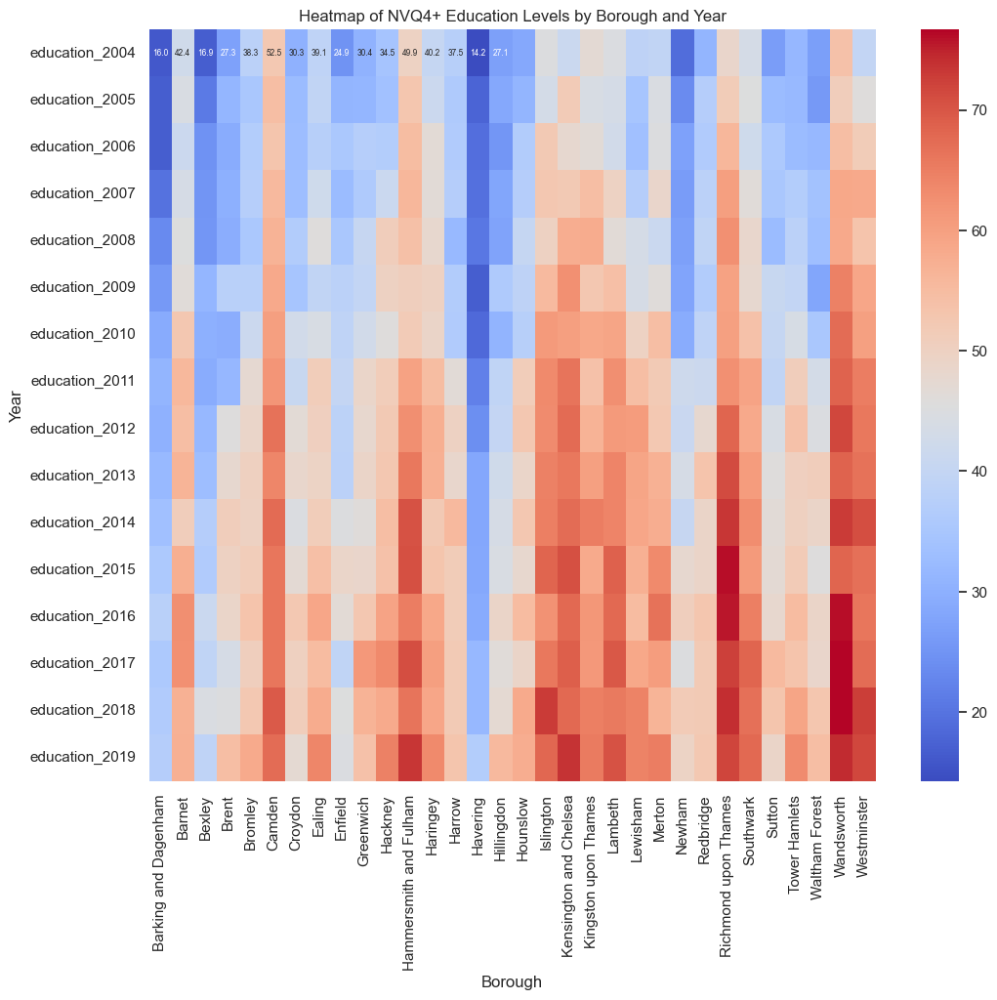

In [90]:
# Drop non-numeric columns
df_numeric = df_education.select_dtypes(include=[np.number])

if 'Borough' not in df_numeric.columns:
    df_numeric = pd.concat([df_education['Borough'], df_numeric], axis=1)

# Set 'Borough' as index
df_numeric = df_numeric.set_index('Borough')

# Transpose for suitable heatmap layout
heatmap_data = df_numeric.transpose()

# Plotting the heatmap with smaller annotations
plt.figure(figsize=(12, 10))
sns.heatmap(heatmap_data, annot=True, cmap="coolwarm", fmt=".1f", 
            annot_kws={"size": 6}) 
plt.title('Heatmap of NVQ4+ Education Levels by Borough and Year')
plt.xlabel('Borough')
plt.ylabel('Year')

# Show the plot
plt.show()

There is a general trend of increasing education levels across most boroughs, with a clear shift from blue to red over the years, suggesting a rise in higher education attainment.

In [91]:
df_melted = df_education.melt(id_vars=["Borough"], var_name="Year", value_name="Percentage with NVQ4+")
fig = px.bar(df_melted, x="Borough", y="Percentage with NVQ4+", color="Borough", animation_frame="Year",
             range_y=[0,100], title="Interactive NVQ4+ Education Levels by Borough")

# Show the plot
fig.show()


### 5.1.8 Overview of Economic Activity

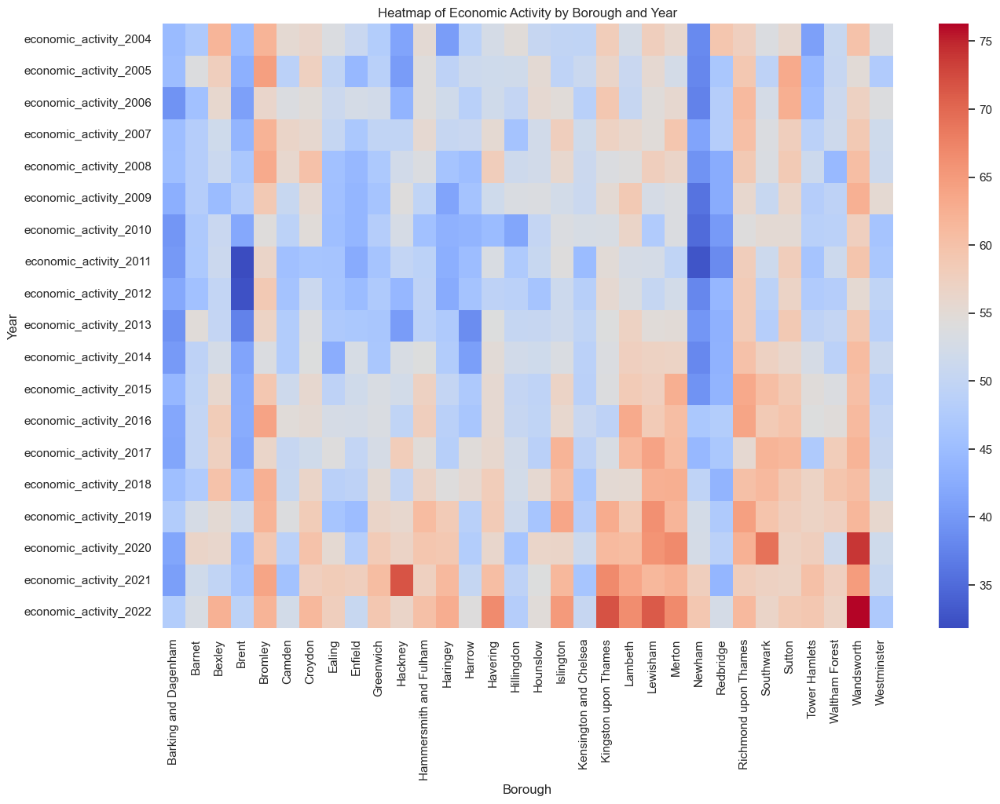

In [92]:
# Setting the index to 'Borough' for better heatmap labeling
heatmap_data = df_economic_activity.set_index('Borough').drop(columns=['Code', 'Inner_Outer_London']).transpose()

plt.figure(figsize=(15, 10))
sns.heatmap(heatmap_data, annot=False, cmap="coolwarm")
plt.title('Heatmap of Economic Activity by Borough and Year')
plt.xlabel('Borough')
plt.ylabel('Year')

# Show the plot
plt.show()

Most boroughs show a trend of increasing economic activity over the years, with some fluctuations. Notably, around the years following economic downturns or significant global events (like the 2008 financial crisis and the recent pandemic around 2020), there are visible shifts in activity levels.

Certain boroughs, such as Kingston upon Thames, Richmond upon Thames, and Wandsworth, often show higher levels of economic activity, indicated by consistently warmer tones. In contrast, boroughs like Barking and Dagenham, and Westminister, occasionally display lower activity levels.

In [93]:
df_melted = df_economic_activity.melt(id_vars=["Borough", "Code", "Inner_Outer_London"], var_name="Year", value_name="Economic Activity")

fig = px.bar(df_melted, x="Borough", y="Economic Activity", color="Borough", animation_frame="Year",
             range_y=[df_melted['Economic Activity'].min(), df_melted['Economic Activity'].max()])

# Show the plot
fig.show()


### 5.1.9 Overview of Job Density

In [94]:

df_melted_jd = df_job_density.melt(id_vars=["Borough", "Code", "Inner_Outer_London"], var_name="Year", value_name="Job Density")

fig = px.bar(df_melted_jd, x="Borough", y="Job Density", color="Borough", animation_frame="Year",
             range_y=[df_melted_jd['Job Density'].min(), df_melted_jd['Job Density'].max()])

# Show the plot
fig.show()

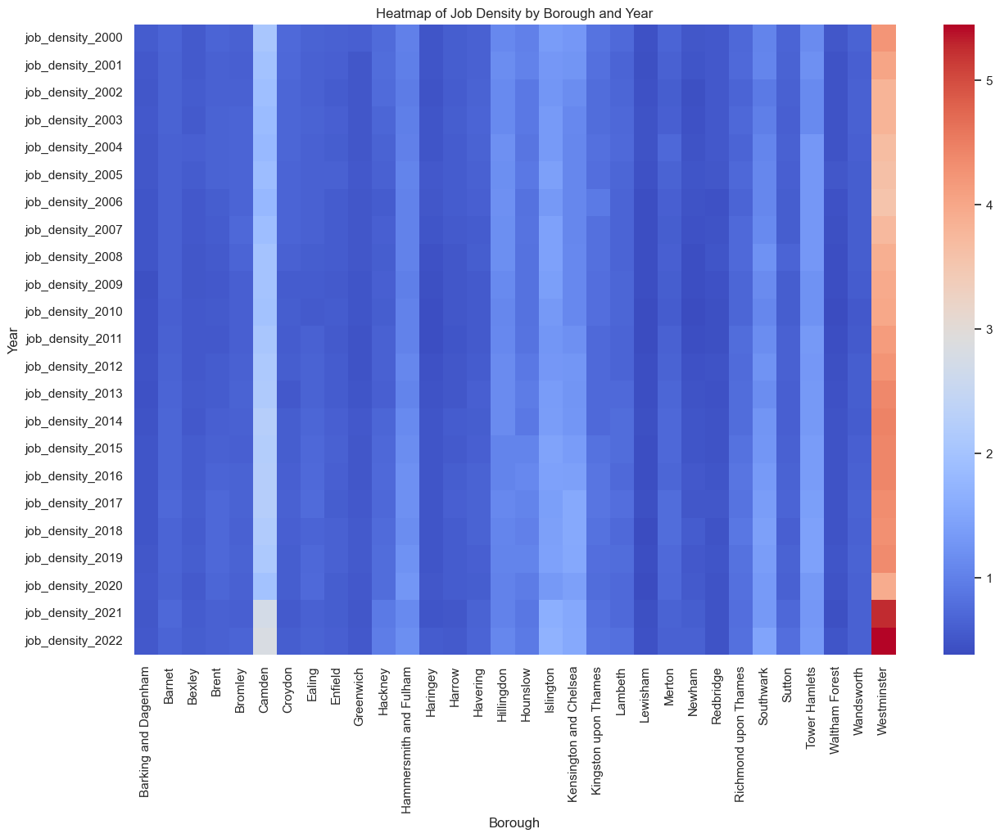

In [95]:
# Setting the index to 'Borough' for better heatmap labeling
heatmap_data_jd = df_job_density.set_index('Borough').drop(columns=['Code', 'Inner_Outer_London']).transpose()

plt.figure(figsize=(15, 10))
sns.heatmap(heatmap_data_jd, annot=False, cmap="coolwarm")
plt.title('Heatmap of Job Density by Borough and Year')
plt.xlabel('Borough')
plt.ylabel('Year')

# Show the plot
plt.show()

Boroughs like Westminster would typically show very high job densities due to the concentration of businesses and services. 

### 5.2 Correlation analysis
Here, investigations on potential correlations between affordable housing availability and socioeconomic indicators will be carried out.

In [96]:
df_affordable_housing_filtered = df_affordable_housing[["Borough", "Code", "Inner_Outer_London", "affordable_housing_2017", "affordable_housing_2018", "affordable_housing_2019", "affordable_housing_2020", "affordable_housing_2021", "affordable_housing_2022"]]
df_population_filtered = df_population[["Borough", "population_2017", "population_2018", "population_2019", "population_2020", "population_2021", "population_2022"]]
df_unemployment_filtered = df_unemployment[["Borough", "unemployment_2017", "unemployment_2018", "unemployment_2019", "unemployment_2020", "unemployment_2021"]]
df_income_filtered = df_income[["Borough", "income_2017", "income_2018", "income_2019", "income_2020", "income_2021", "income_2022"]]
df_crime_filtered = df_crime[["Borough", "crime_2017", "crime_2018", "crime_2019", "crime_2020", "crime_2021", "crime_2022"]]
df_education_filtered = df_education[["Borough", "education_2017", "education_2018", "education_2019"]]
df_economic_activity_filtered = df_economic_activity[["Borough", "economic_activity_2017", "economic_activity_2018", "economic_activity_2019", "economic_activity_2020", "economic_activity_2021", "economic_activity_2022"]]
df_job_density_filtered = df_job_density[["Borough", "job_density_2017", "job_density_2018", "job_density_2019", "job_density_2020", "job_density_2021", "job_density_2022"]]
df_housing_tenure_filtered = df_housing_tenure[["Borough", "Own Outright_2017","Own Outright_2018", "Own Outright_2019", "Own Outright_2020",  
                                                "Buying with mortgage_2017", "Buying with mortgage_2018", "Buying with mortgage_2019", "Buying with mortgage_2020", 
                                               "Rented from Local Authority or Housing Association_2017", "Rented from Local Authority or Housing Association_2018", "Rented from Local Authority or Housing Association_2019", "Rented from Local Authority or Housing Association_2020",  
                                               "Rented from Private landlord_2017", "Rented from Private landlord_2018", "Rented from Private landlord_2019", "Rented from Private landlord_2020"]]






In [97]:
# Merging multiple datasets on 'Borough'
final_dataset = df_affordable_housing_filtered.merge(df_population_filtered, on="Borough", how="inner")
final_dataset = final_dataset.merge(df_unemployment_filtered, on="Borough", how="inner")
final_dataset = final_dataset.merge(df_income_filtered, on="Borough", how="inner")
final_dataset = final_dataset.merge(df_crime_filtered, on="Borough", how="inner")
final_dataset = final_dataset.merge(df_education_filtered, on="Borough", how="inner")
final_dataset = final_dataset.merge(df_economic_activity_filtered, on="Borough", how="inner")
final_dataset = final_dataset.merge(df_job_density_filtered, on="Borough", how="inner")
final_dataset = final_dataset.merge(df_housing_tenure_filtered, on="Borough", how="inner")


In [98]:
final_dataset

,Borough,Code,Inner_Outer_London,affordable_housing_2017,affordable_housing_2018,affordable_housing_2019,affordable_housing_2020,affordable_housing_2021,affordable_housing_2022,population_2017,...,Buying with mortgage_2019,Buying with mortgage_2020,Rented from Local Authority or Housing Association_2017,Rented from Local Authority or Housing Association_2018,Rented from Local Authority or Housing Association_2019,Rented from Local Authority or Housing Association_2020,Rented from Private landlord_2017,Rented from Private landlord_2018,Rented from Private landlord_2019,Rented from Private landlord_2020
0,Barking and Dagenham,E09000002,Outer London,312,194,549,1007,1587,941,214017,...,22.9,22.6,30.7,30.4,32.8,39.4,22.0,20.7,25.4,18.8
1,Barnet,E09000003,Outer London,235,963,325,415,805,1207,384117,...,29.1,30.2,10.6,13.9,12.5,12.7,28.0,25.2,28.2,24.7
2,Bexley,E09000004,Outer London,83,164,258,653,374,192,244494,...,35.9,32.6,11.9,10.4,13.6,16.4,12.3,15.1,14.9,13.5
3,Brent,E09000005,Outer London,499,70,2002,1650,491,461,342439,...,21.4,21.9,24.9,23.5,20.0,20.2,31.2,29.2,31.8,30.1
4,Bromley,E09000006,Outer London,6,281,125,23,285,136,329134,...,37.2,37.8,13.3,13.3,9.7,12.8,13.1,19.1,21.1,14.0
5,Camden,E09000007,Inner London,356,126,367,51,216,218,218833,...,14.7,19.9,33.4,35.3,37.2,34.1,27.4,28.2,28.1,24.2
6,Croydon,E09000008,Outer London,282,540,697,1357,962,511,385567,...,32.6,35.8,14.8,17.6,17.6,13.8,21.5,19.2,27.1,23.2
7,Ealing,E09000009,Outer London,1138,1037,1092,948,898,1658,362670,...,30.8,28.5,13.8,11.2,12.7,13.7,26.4,25.6,30.1,30.2
8,Enfield,E09000010,Outer London,51,299,170,419,512,457,333077,...,31.4,33.7,17.6,19.0,20.7,16.9,25.7,26.2,21.6,16.6
9,Greenwich,E09000011,Outer London,358,452,430,1168,516,620,282376,...,32.6,27.1,29.3,26.1,25.9,29.3,21.1,19.7,20.3,23.0


### 5.2.1 Year 2017

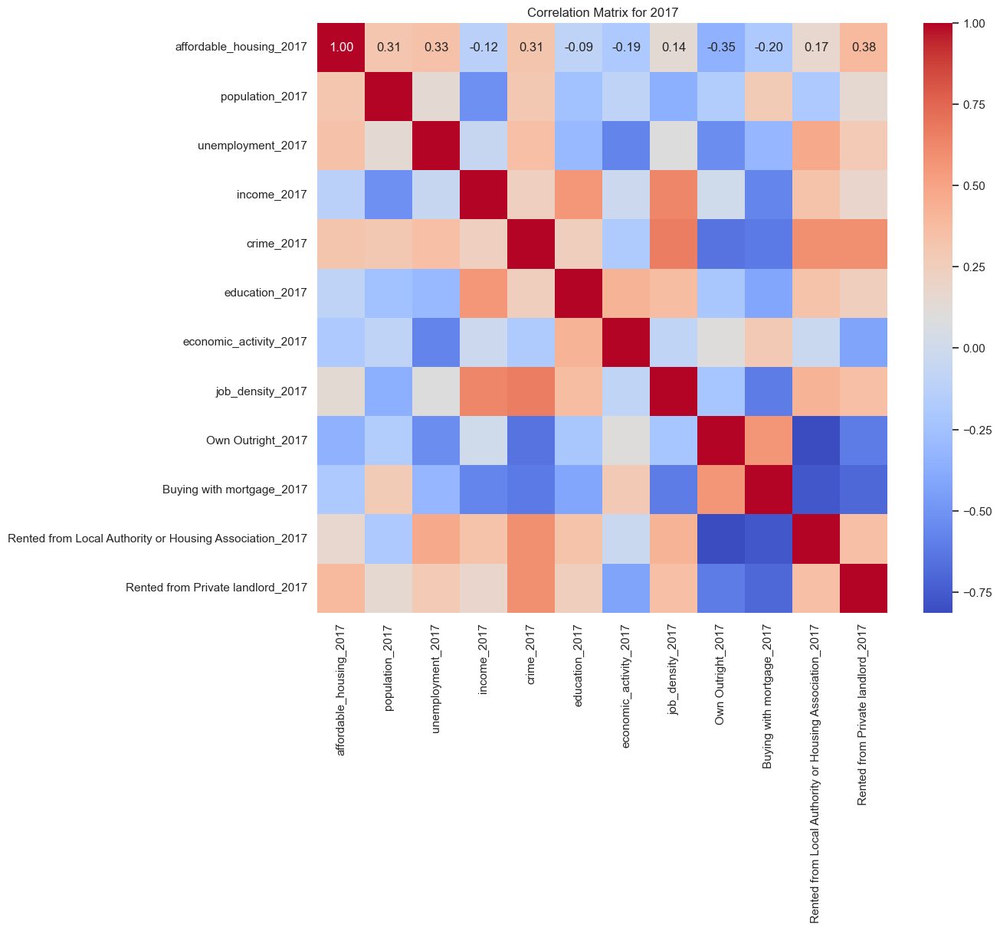

In [99]:
# Filter columns that have '_2017' in their column names
data_2017 = final_dataset.filter(regex='_2017$')

# Exclude non-numeric columns and compute the correlation matrix
numeric_data_2017 = data_2017.select_dtypes(include=[np.number])
corr_matrix_2017 = numeric_data_2017.corr()

# Plotting the correlation matrix
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix_2017, annot=True, fmt=".2f", cmap='coolwarm')
plt.title('Correlation Matrix for 2017')

# Show the plot
plt.show()

Affordable Housing and Population (0.31): There's a moderate positive correlation between population size and the availability of affordable housing. This suggests that areas with larger populations tend to have more affordable housing, potentially due to higher demand leading to more housing developments.

Affordable Housing and Unemployment (0.33): Similarly, a moderate positive correlation with unemployment may indicate that areas with more affordable housing also have higher unemployment rates, possibly reflecting lower-income levels that necessitate such housing.

Affordable Housing and Income (-0.12): A slight negative correlation indicates that higher levels of affordable housing tend to be in areas with somewhat lower average incomes.

Affordable Housing and Crime (0.31): There is a moderate positive correlation between affordable housing and crime rates, possibly reflecting socio-economic challenges in these areas.

Affordable Housing and Economic Activity (-0.19): A slight negative correlation suggests that regions with more affordable housing may have less economic activity.

Affordable Housing and Job Density (0.14): A weak positive correlation suggests a slight association between higher job density and affordable housing availability, possibly due to urban areas having both a concentration of jobs and housing options.

Affordable Housing and Housing Tenure:

Own Outright (-0.35) and Buying with Mortgage (-0.20): Both show negative correlations, indicating that areas with more affordable housing have lower rates of home ownership.

Rented from Local Authority or Housing Association (0.17): A weak positive correlation implies a slightly higher presence of publicly supported housing in areas with more affordable housing.

Rented from Private Landlord (0.38): A moderate positive correlation indicates that areas with more affordable housing have a higher proportion of rentals from private landlords, suggesting that these areas may offer more rental options, including possibly more affordable and sub-market rents.

### 5.2.2 Year 2018

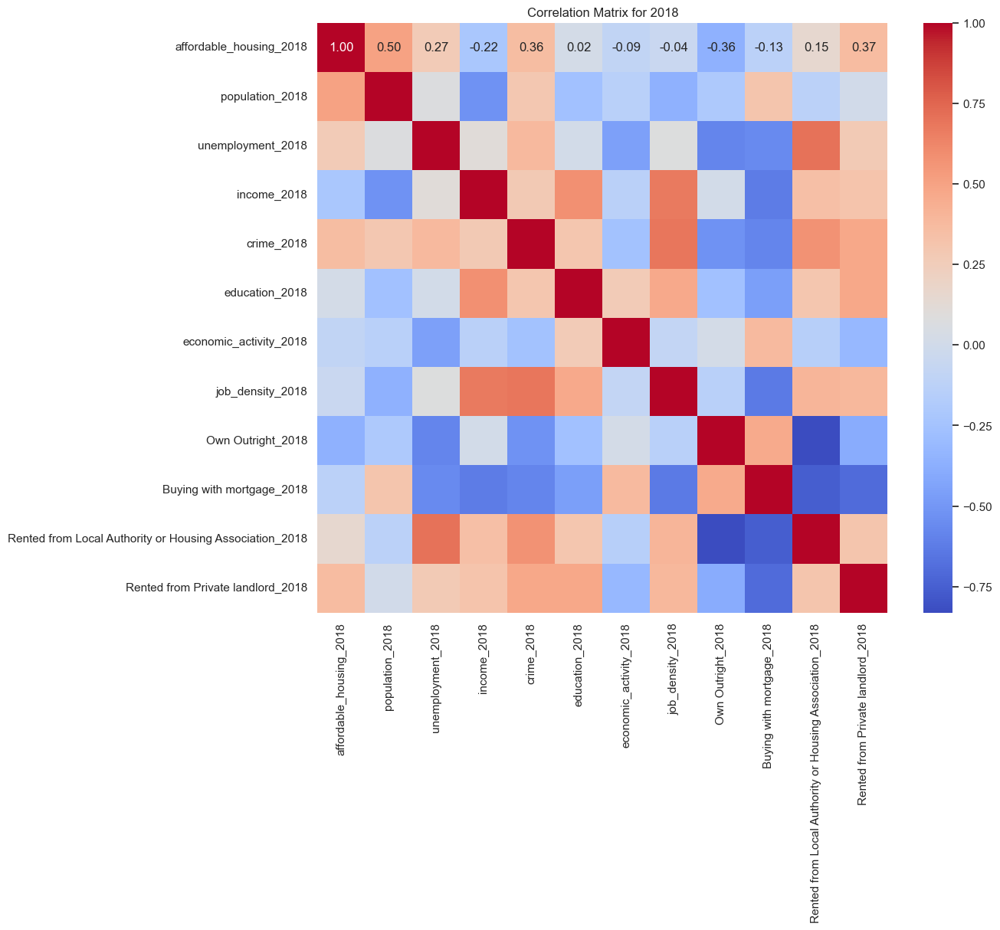

In [100]:
# Filter columns that have '_2018' in their column names
data_2018 = final_dataset.filter(regex='_2018$')

# Exclude non-numeric columns and compute the correlation matrix
numeric_data_2018 = data_2018.select_dtypes(include=[np.number])
corr_matrix_2018 = numeric_data_2018.corr()

# Plotting the correlation matrix
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix_2018, annot=True, fmt=".2f", cmap='coolwarm')
plt.title('Correlation Matrix for 2018')

# Show the plot
plt.show()

Affordable Housing and Population (0.50): A strong positive correlation suggests that areas with more affordable housing tend to have higher populations, potentially due to the attraction of more affordable living options.

Affordable Housing and Unemployment (0.27): A moderate positive correlation indicates that areas with more affordable housing also tend to have higher unemployment rates. This could reflect a concentration of lower-income, potentially less economically active populations in these areas.

Affordable Housing and Income (-0.22): A negative correlation with income supports the notion that affordable housing is more prevalent in lower-income areas, helping to provide housing solutions for economically disadvantaged populations.

Affordable Housing and Crime (0.36): The positive correlation suggests that areas with more affordable housing might also experience higher crime rates, which could be due to a variety of social and economic factors affecting these neighborhoods.

Affordable Housing and Economic Activity (-0.09) and Job Density (-0.04): Both show weak negative correlations with affordable housing, indicating that higher availability of affordable housing does not necessarily correlate with economic vibrancy or job concentration in these areas.

Affordable Housing and Housing Tenure:

Own Outright (-0.36) and Buying with Mortgage (-0.13): Both ownership categories show negative correlations with affordable housing, which might reflect a higher proportion of rental versus owner-occupied housing in areas with affordable housing.

Rented from Local Authority or Housing Association (0.15): A slight positive correlation suggests that areas with more affordable housing tend to have more public or subsidized housing options.

Rented from Private Landlord (0.37): A moderate positive correlation indicates a significant presence of private rentals in areas with affordable housing, possibly including both market-rate and subsidized units.

### 5.2.3 Year 2019

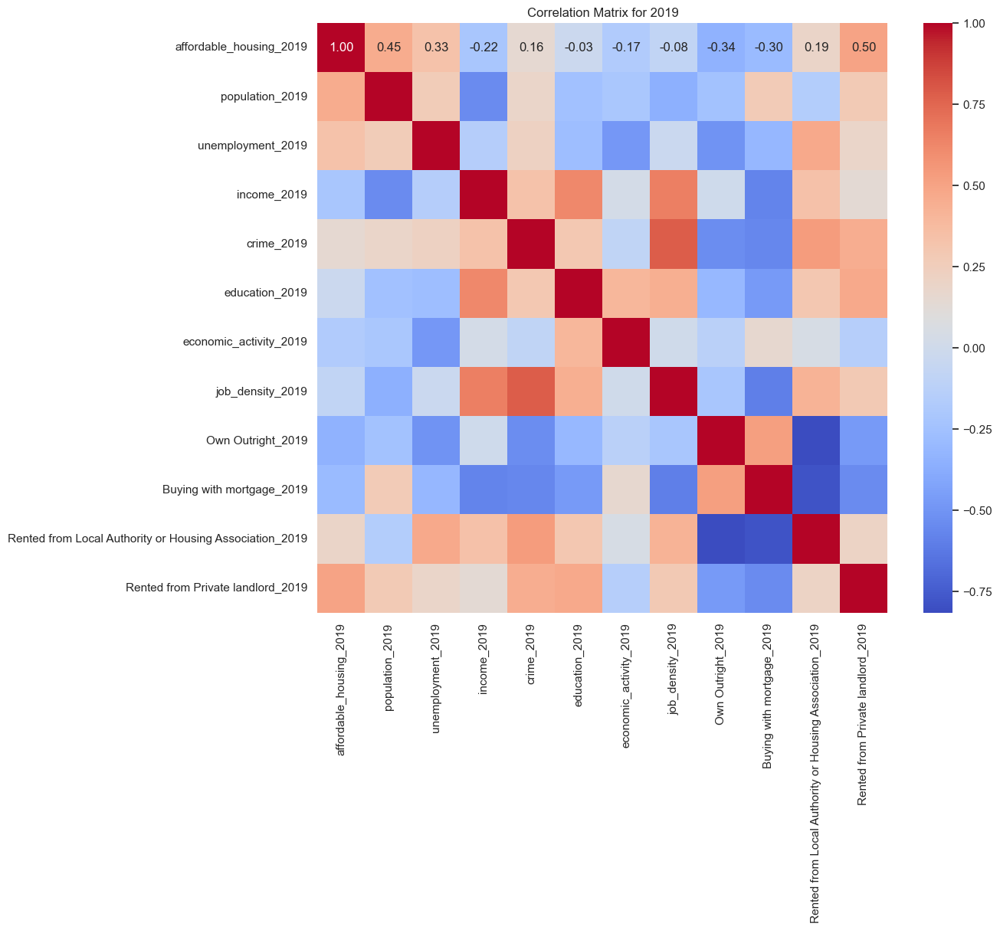

In [101]:
# Filter columns that have '_2019' in their column names
data_2019 = final_dataset.filter(regex='_2019$')

# Exclude non-numeric columns and compute the correlation matrix
numeric_data_2019 = data_2019.select_dtypes(include=[np.number])
corr_matrix_2019 = numeric_data_2019.corr()

# Plotting the correlation matrix
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix_2019, annot=True, fmt=".2f", cmap='coolwarm')
plt.title('Correlation Matrix for 2019')

# Show the plot
plt.show()

Affordable Housing and Population (0.45): There's a moderate positive correlation between affordable housing and population size, indicating that areas with more affordable housing also tend to have larger populations. This could suggest that affordable housing is more prevalent or necessary in more densely populated areas.

Affordable Housing and Unemployment (0.33): This moderate positive correlation may reflect that areas with more affordable housing also face higher unemployment rates, possibly due to socio-economic factors that drive both the need for affordable housing and higher unemployment.

Affordable Housing and Income (-0.22): The negative correlation with income supports the idea that affordable housing is more common in lower-income areas, helping provide essential housing options to lower-income residents.

Affordable Housing and Crime (0.16): A slight positive correlation suggests a mild association between higher rates of affordable housing and increased crime rates, although this correlation is weak and requires further contextual investigation to determine causality.

Affordable Housing and Economic Activity (-0.03) and Job Density (-0.08): Both show very weak correlations with affordable housing, implying that the presence of affordable housing does not strongly influence the level of economic activity or job density in an area.

Affordable Housing and Housing Tenure:

Own Outright (-0.34) and Buying with Mortgage (-0.30): Both demonstrate negative correlations with affordable housing, suggesting that increases in affordable housing are associated with lower levels of property ownership, perhaps because affordable housing primarily serves renters.

Rented from Local Authority or Housing Association (0.19): A positive correlation indicates that areas with more affordable housing tend to have a higher presence of public or social housing, which aligns with the goals of affordable housing policies.

Rented from Private Landlord (0.50): A strong positive correlation indicates a substantial overlap between areas with high levels of affordable housing and those with high rates of private rentals, suggesting that these areas may offer a range of rental options, including both market-rate and subsidized housing.

### 5.2.4 Year 2020

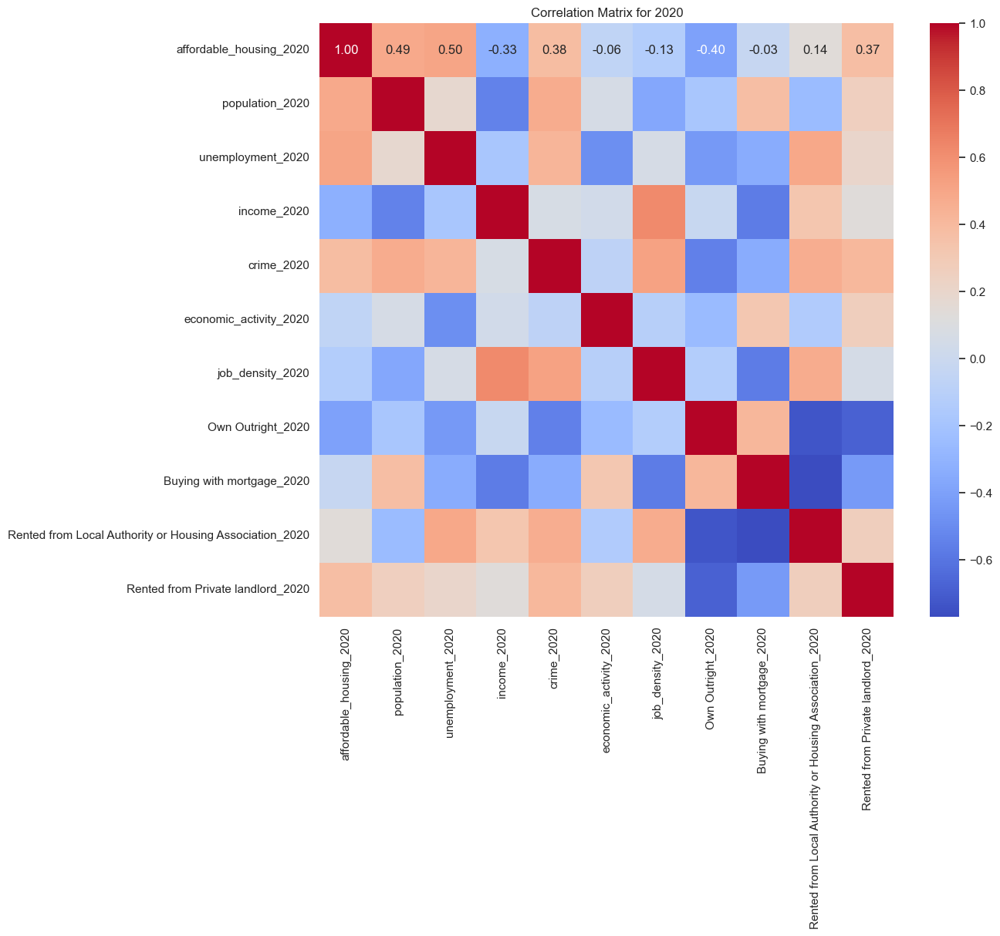

In [102]:
# Filter columns that have '_2020' in their column names
data_2020 = final_dataset.filter(regex='_2020$')

# Exclude non-numeric columns and compute the correlation matrix
numeric_data_2020 = data_2020.select_dtypes(include=[np.number])
corr_matrix_2020 = numeric_data_2020.corr()

# Plotting the correlation matrix
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix_2020, annot=True, fmt=".2f", cmap='coolwarm')
plt.title('Correlation Matrix for 2020')

# Show the plot
plt.show()

Affordable Housing and Population (0.49): A moderate positive correlation suggests that regions with more affordable housing tend to have larger populations. This might indicate that affordable housing attracts or supports larger communities, possibly due to its accessibility or affordability for larger segments of the population.

Affordable Housing and Unemployment (0.5): A strong positive correlation indicates that areas with more affordable housing tend to have higher unemployment rates. This may suggest that affordable housing is often situated in regions with higher unemployment, potentially due to economic disparities.

Affordable Housing and Income (-0.33): A moderate negative correlation with income suggests that areas with more affordable housing typically have lower average incomes. This aligns with the role of affordable housing in supporting lower-income communities.

Affordable Housing and Crime (0.38): A moderate positive correlation with crime rates indicates that higher levels of affordable housing are associated with higher crime rates. This correlation may reflect complex social dynamics and does not necessarily imply causation.

Affordable Housing and Economic Activity (-0.06): The near-zero correlation suggests there is no significant relationship between the level of economic activity and the availability of affordable housing in these areas, indicating that other factors may play a more crucial role in economic dynamics.

Affordable Housing and Job Density (-0.13): A slight negative correlation suggests that higher affordable housing availability might be slightly associated with lower job density. This could indicate that these areas are less commercially dense or have different types of employment sectors that might not require high job density.

Affordable Housing and Housing Tenure:

Own Outright (-0.04) and Buying with Mortgage (-0.03): Both show very weak negative correlations with affordable housing, suggesting that increases in affordable housing availability have minimal impact on homeownership rates.

Rented from Local Authority or Housing Association (0.14): A slight positive correlation indicates that areas with more affordable housing tend to have slightly higher rates of public or social housing, which is expected as both are forms of subsidized housing.

Rented from Private Landlord (0.37): A moderate positive correlation suggests that affordable housing areas may also have higher proportions of private rentals. This could be due to a combination of housing market dynamics where affordable and rental housing coexist or are interdependent.

### 5.2.5 Year 2021

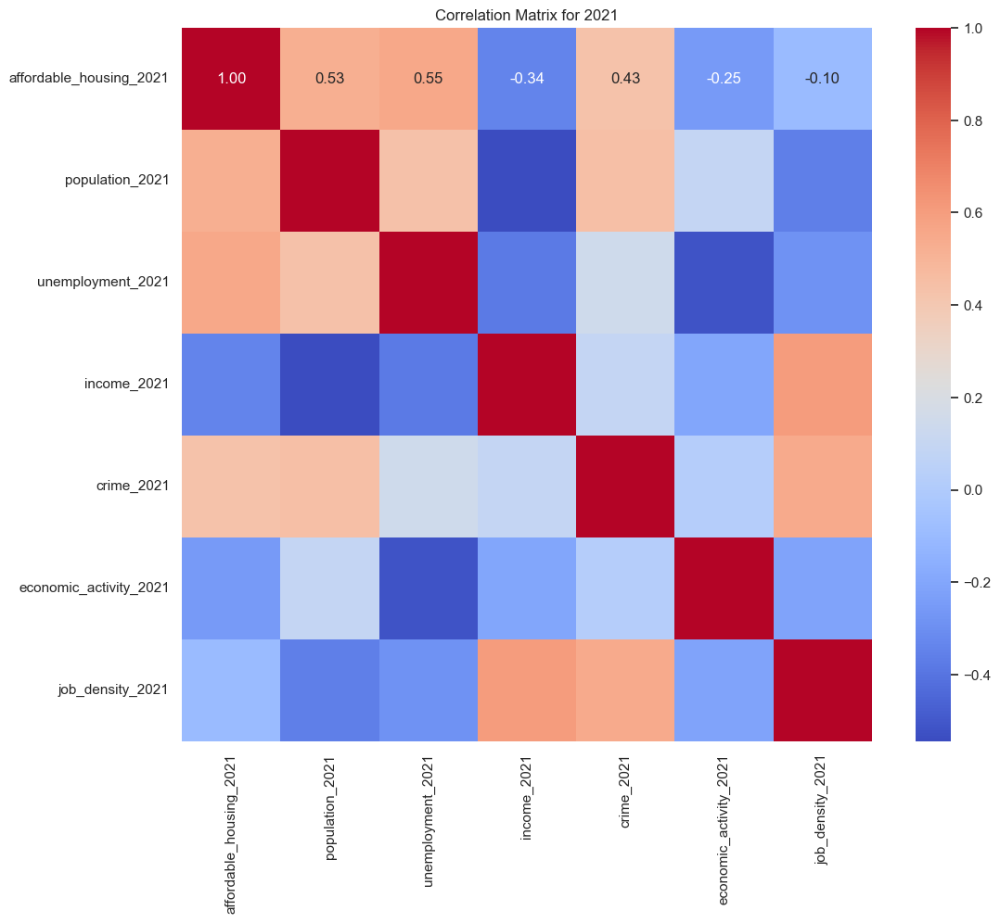

In [103]:
# Filter columns that have '_2021' in their column names
data_2021 = final_dataset.filter(regex='_2021$')

# Exclude non-numeric columns and compute the correlation matrix
numeric_data_2021 = data_2021.select_dtypes(include=[np.number])
corr_matrix_2021 = numeric_data_2021.corr()

# Plotting the correlation matrix
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix_2021, annot=True, fmt=".2f", cmap='coolwarm')
plt.title('Correlation Matrix for 2021')

# Show the plot
plt.show()

Affordable Housing and Population (0.53): A moderate positive correlation suggests that areas with more affordable housing tend to have larger populations. This indicates a focus on developing affordable housing in densely populated areas.

Affordable Housing and Unemployment (0.55): A strong positive correlation implies that higher rates of affordable housing are associated with higher unemployment rates. This may reflect that affordable housing is often situated in areas with economic challenges or that it serves populations with higher unemployment rates.

Affordable Housing and Income (-0.34): A moderate negative correlation suggests that boroughs with more affordable housing generally have lower income levels. This relationship might indicate that affordable housing is targeted towards lower-income demographics or that these areas inherently have lower incomes.

Affordable Housing and Crime (0.43): A moderate positive correlation indicates that boroughs with more affordable housing units tend to have higher crime rates. This correlation does not imply causation but points to complex social dynamics where affordable housing and higher crime rates may coexist.

Affordable Housing and Economic Activity (-0.25): This moderate negative correlation indicates that areas with more affordable housing tend to have slightly lower levels of economic activity. This could suggest that regions with higher concentrations of affordable housing may not be as economically vibrant or may attract less business and commercial investment.

Affordable Housing and Job Density (-0.10): A weak negative correlation suggesting that there is little relationship between the density of jobs and the availability of affordable housing. This may indicate that job density is not a primary factor in the placement or development of affordable housing.

### 5.2.6 Year 2022

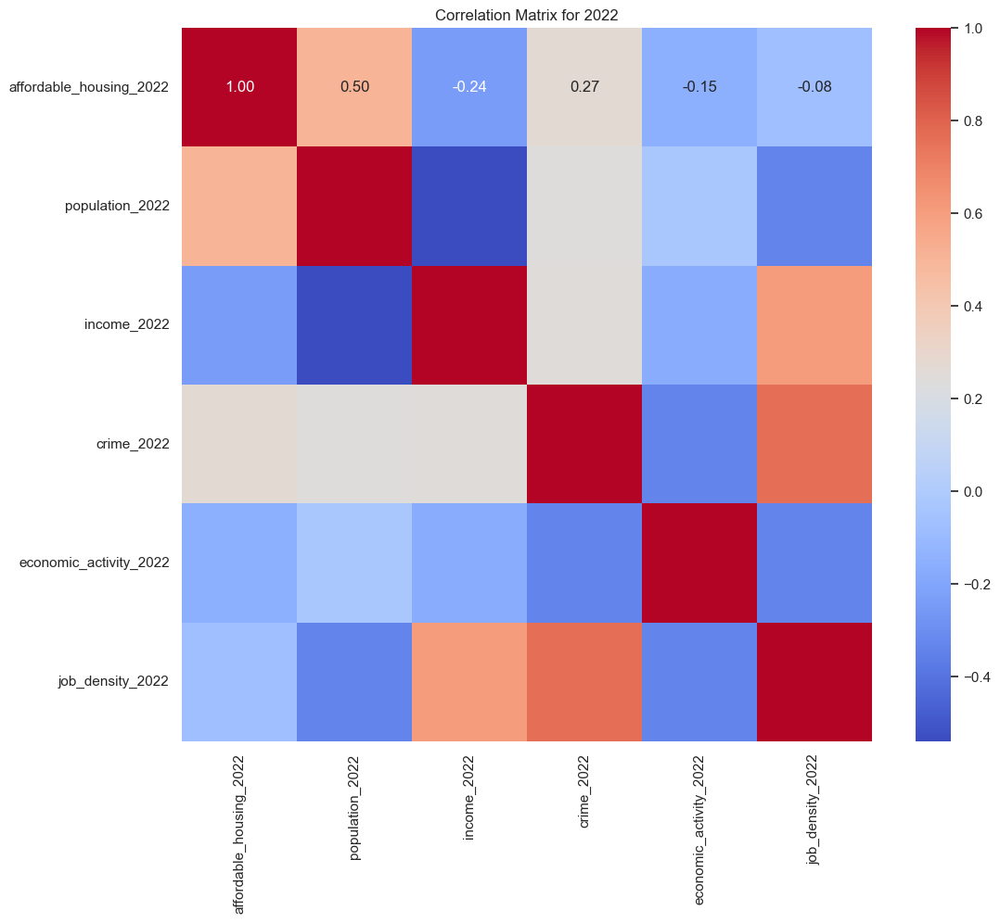

In [104]:
# Filter columns that have '_2022' in their column names
data_2022 = final_dataset.filter(regex='_2022$')

# Exclude non-numeric columns and compute the correlation matrix
numeric_data_2022 = data_2022.select_dtypes(include=[np.number])
corr_matrix_2022 = numeric_data_2022.corr()

# Plotting the correlation matrix
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix_2022, annot=True, fmt=".2f", cmap='coolwarm')
plt.title('Correlation Matrix for 2022')

# Show the plot
plt.show()

Affordable Housing and Population (0.50): A moderate positive correlation suggests that boroughs with larger populations tend to have more affordable housing units. This relationship indicates that areas with higher population densities are likely targets for affordable housing initiatives.

Affordable Housing and Income (-0.24): A slight negative correlation implies that boroughs with higher incomes might have fewer affordable housing units. This could suggest that more affluent areas may have less demand or availability for affordable housing, or that affordable housing is more commonly developed in lower-income areas.

Affordable Housing and Crime (0.27): A weak positive correlation indicates that areas with more affordable housing units have slightly higher crime rates. This does not imply causation but suggests that factors associated with locations chosen for affordable housing might also be related to higher crime rates.

Affordable Housing and Economic Activity (-0.15): This slight negative correlation suggests that boroughs with more economic activity might have slightly fewer affordable housing units. This could be due to economic activity often being higher in areas with higher property values, where less affordable housing is available.

Affordable Housing and Job Density (-0.08): There's a very weak negative correlation indicating almost no significant relationship between job density and the number of affordable housing units. This suggests that the presence of jobs is not a strong determinant of where affordable housing is developed.

### 6 Scatter Plot

A scatter plot matrix will be generated for 2017 to 2022, focusing on the socioeconomic indicators, affordable housing and their relationship with each other.

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


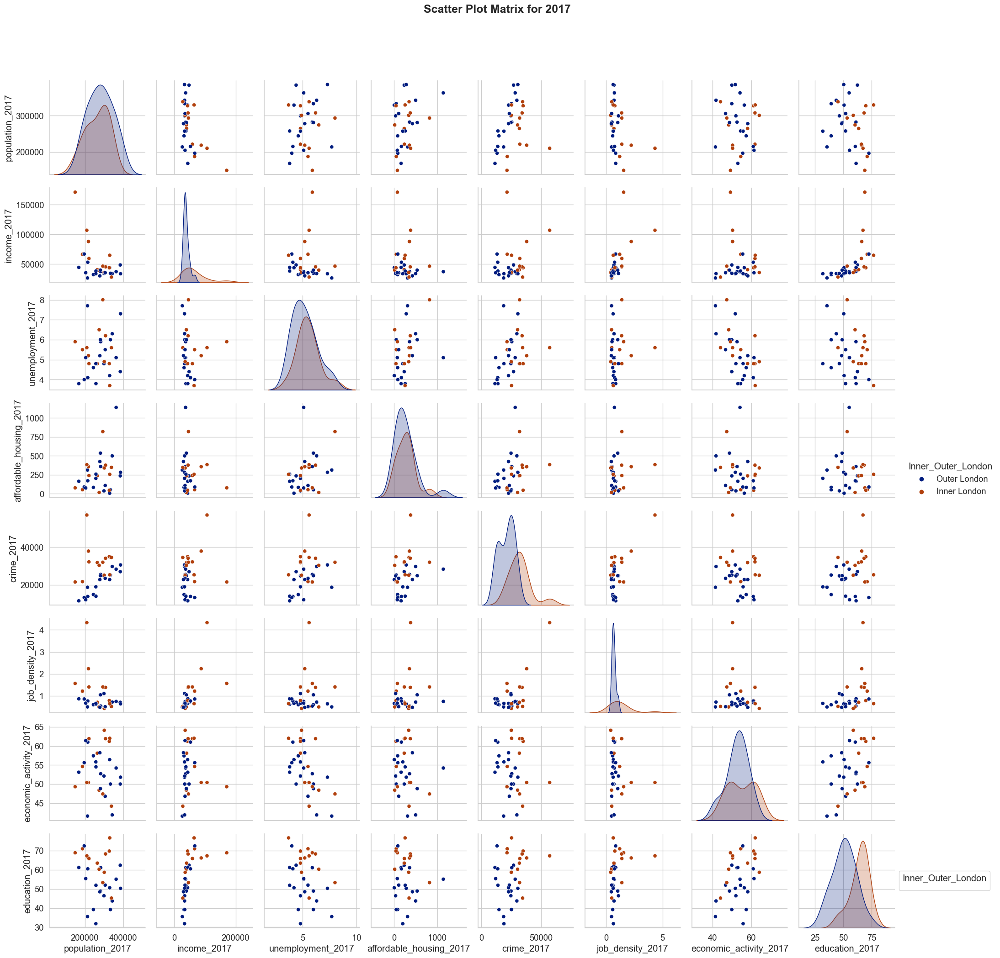

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


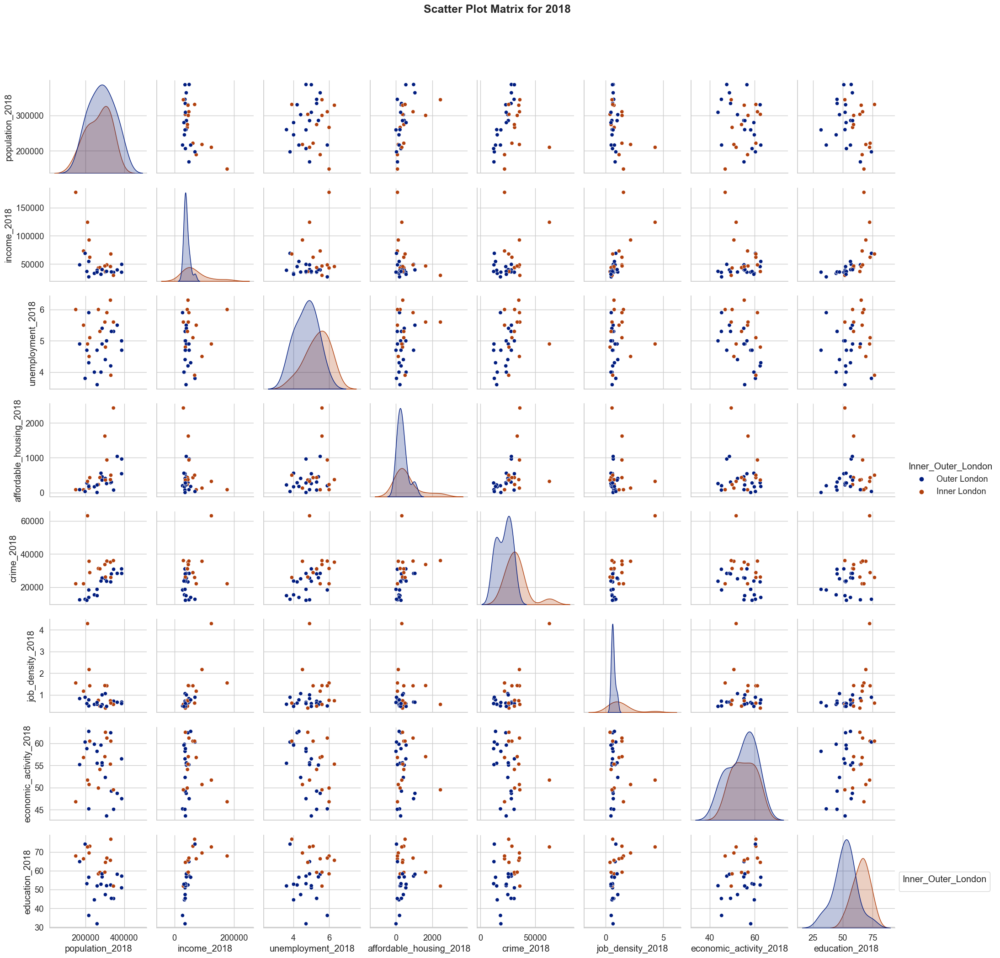

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


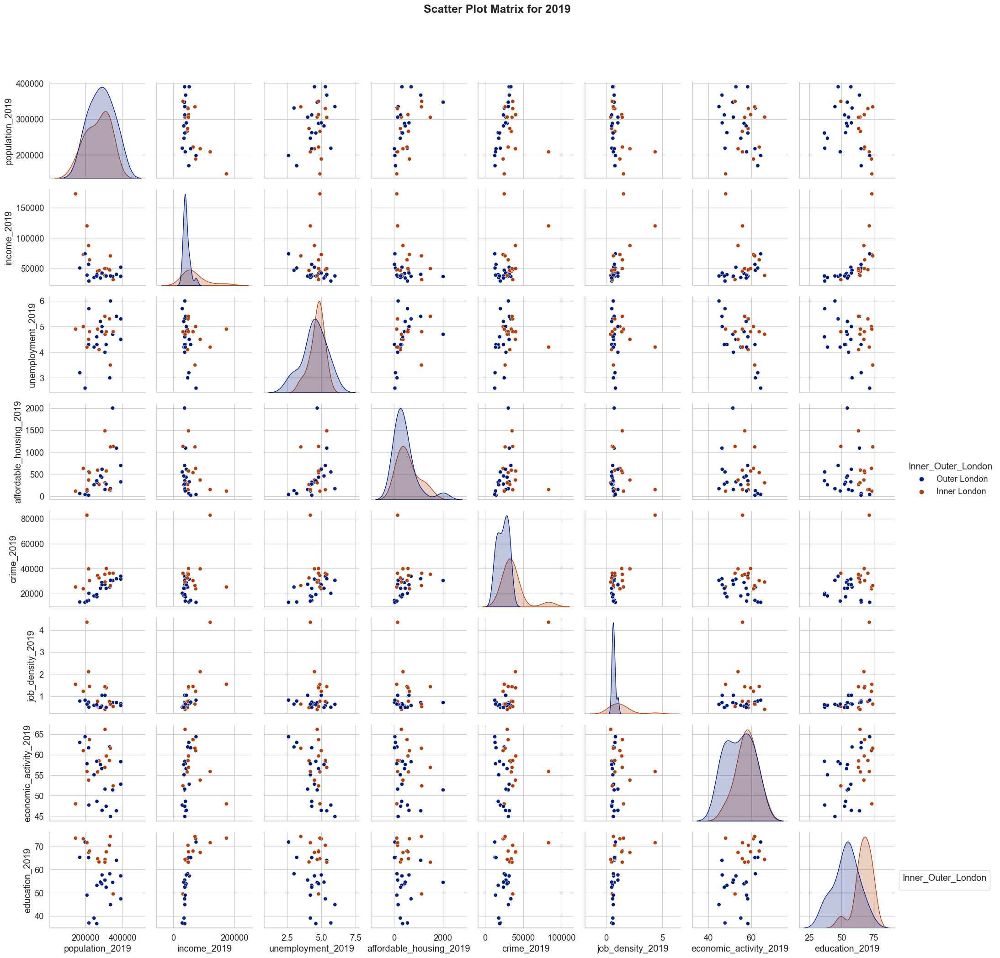

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


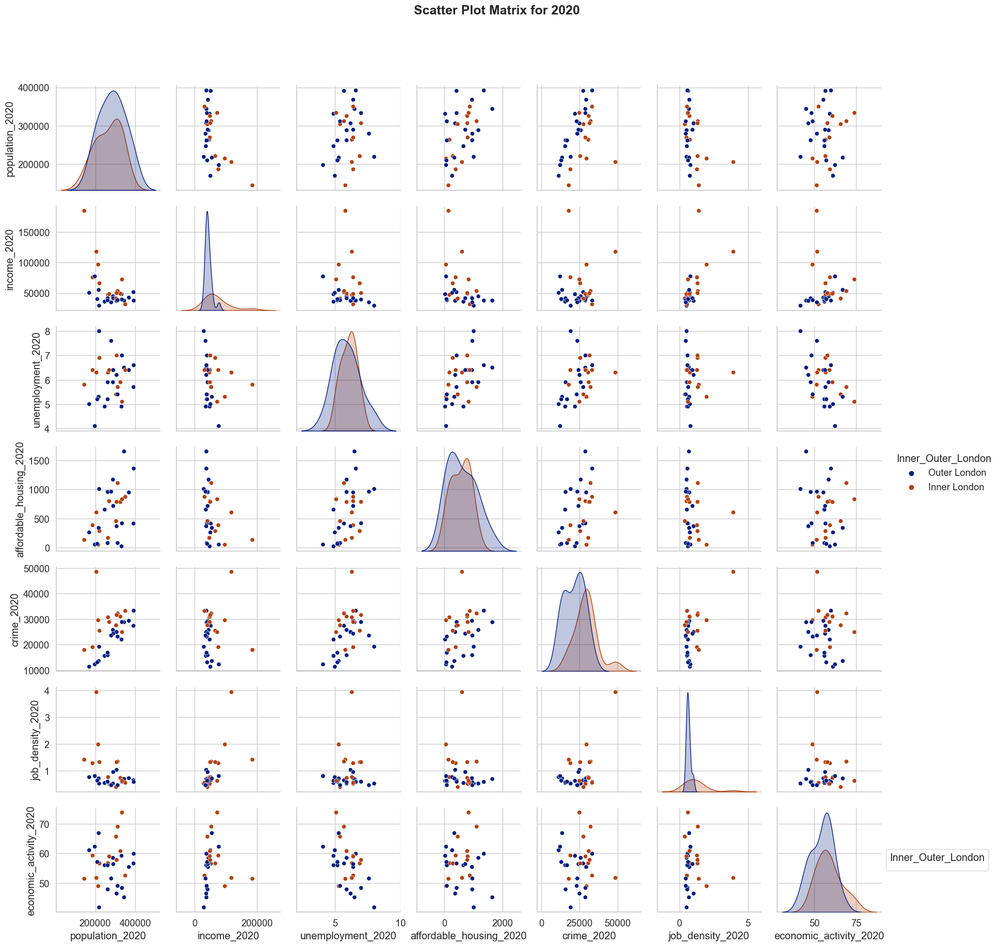

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


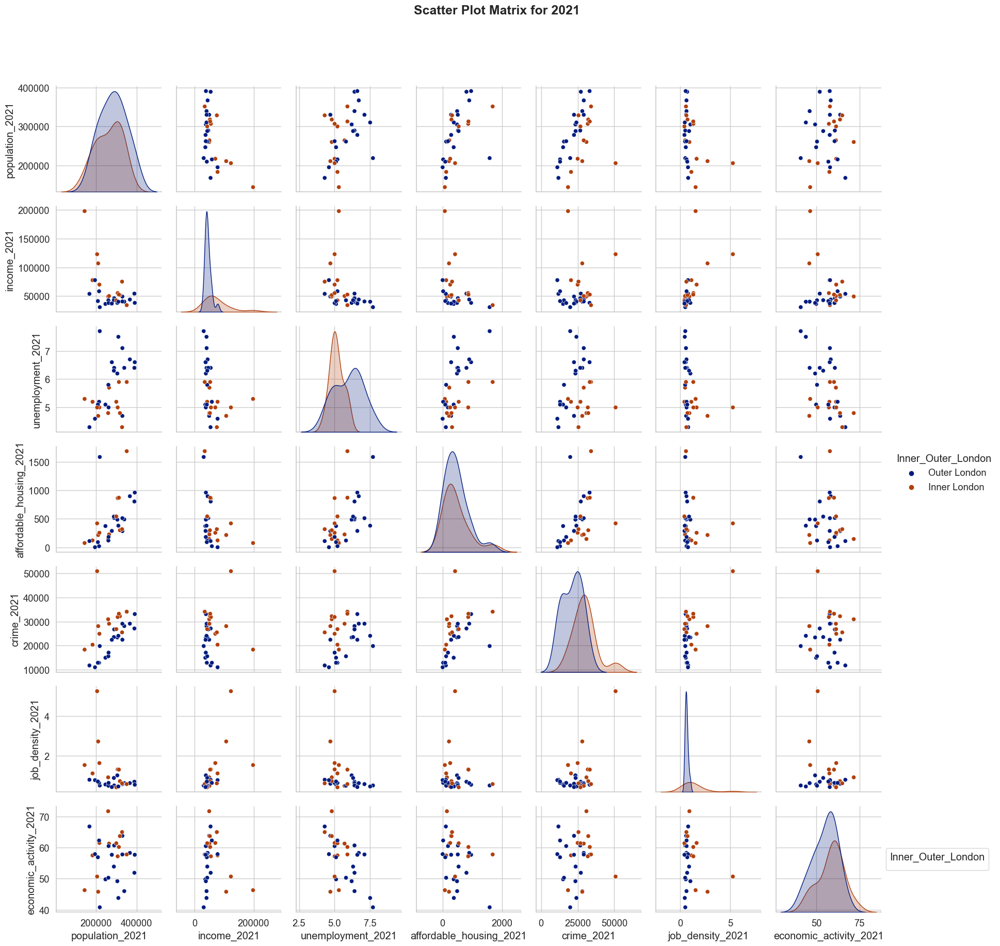

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


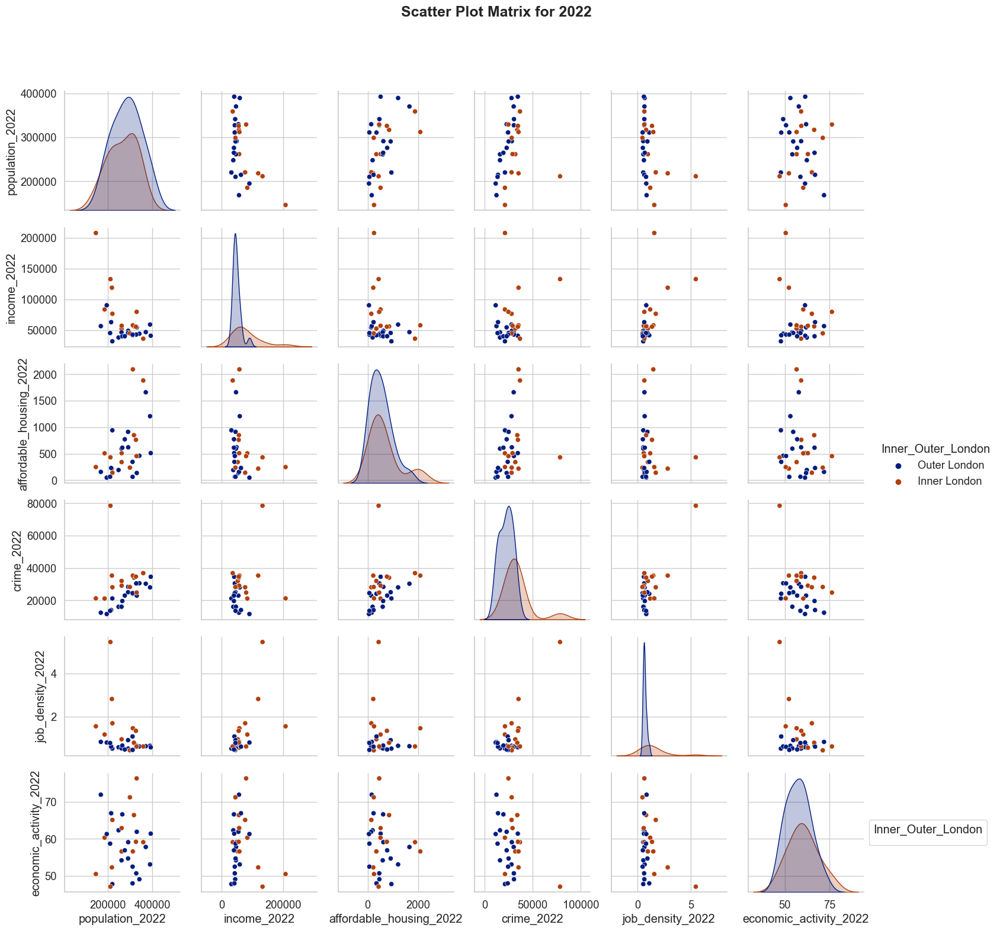

In [105]:
def plot_scatter_matrix(df, start_year, end_year, base_vars, hue=None):
    
    custom_palette = sns.color_palette("dark", len(base_vars))
    
    for year in range(start_year, end_year + 1):
        # Generate column names for the current year
        current_vars = [f"{var}_{year}" for var in base_vars if f"{var}_{year}" in df.columns]
        
        # Check if hue parameter is valid and in the DataFrame
        if hue and hue in df.columns:
            pairplot_args = {'hue': hue, 'palette': custom_palette}
        else:
            pairplot_args = {'palette': custom_palette}
        
        # Set style and context
        sns.set(style="whitegrid", font_scale=1.2)
        
        # Create the scatter plot matrix
        g = sns.pairplot(df[current_vars + ([hue] if hue else [])], **pairplot_args)
        
        # Title customization
        plt.suptitle(f'Scatter Plot Matrix for {year}', y=1.05, fontsize=18, fontweight='bold')  
        
        # Position the legend outside the plot
        if hue:
            plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), title=hue)
        
        # Adjust layout
        plt.tight_layout()
        
        # Show plot
        plt.show()

# Suppressing warnings
warnings.filterwarnings("ignore")

base_variables = [
    'population', 'income', 'unemployment', 'affordable_housing',
    'crime', 'job_density', 'economic_activity', 'education'
]
plot_scatter_matrix(final_dataset, 2017, 2022, base_variables, hue='Inner_Outer_London')

Population and Affordable Housing: Over the years, there is a general upward trend indicating that boroughs with larger populations tend to have more affordable housing units. This relationship is more dispersed in Inner London compared to Outer London, suggesting a potential variance in housing policies or the availability of space for development between these regions.

Income and Affordable Housing: The relationship between income and affordable housing doesn't show a clear trend across the years. This could imply that affordable housing availability is not directly proportional to the average income levels of a borough, perhaps reflecting diverse economic strategies or the effectiveness of affordable housing policies across different income brackets.

Unemployment and Affordable Housing: There's no clear pattern suggesting a direct relationship between unemployment rates and affordable housing units.

Crime and Affordable Housing: The scatter plots do not reveal a distinct correlation between crime rates and affordable housing across the years. The data points are widely spread across both axes with no visible trend, suggesting that crime rates might be influenced by other factors.

Education and Affordable Housing: Similar to crime, there is no apparent strong correlation between education levels and the number of affordable housing units.

Economic Activity and Affordable Housing: The scatter plot shows a varied distribution of points with no definitive trend linking economic activity and affordable housing. This suggests that the vibrancy of economic activities in boroughs may not be directly tied to how many affordable housing units are available.

Job Density and Affordable Housing: The plot does not indicate a clear relationship between job density and affordable housing. This could reflect that job-rich areas do not always coincide with zones prioritized for affordable housing.

### 7 Clustering Analysis (K-means Clustering)

Clustering analysis will be performed to explore and analyze patterns in multiple socioeconomic indicators across different boroughs of London over several years.

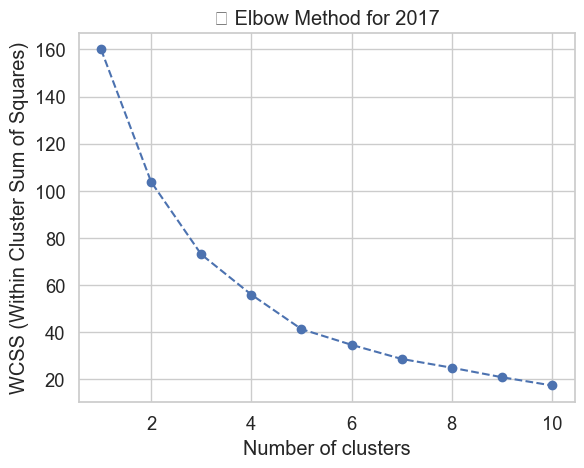

📊 Summary statistics for each cluster in 2017:
              population_2017    income_2017    crime_2017  \
Cluster_2017                                                 
0               255768.812500   45993.750000  21793.000000   
1               315162.153846   36692.307692  27280.461538   
2               192981.000000  122000.000000  38807.666667   

              economic_activity_2017  job_density_2017  
Cluster_2017                                            
0                          58.575000          0.789375  
1                          48.453846          0.725385  
2                          50.033333          2.706667  

📊 Count of boroughs per cluster in 2017:
Cluster_2017
0    16
1    13
2     3
Name: count, dtype: int64


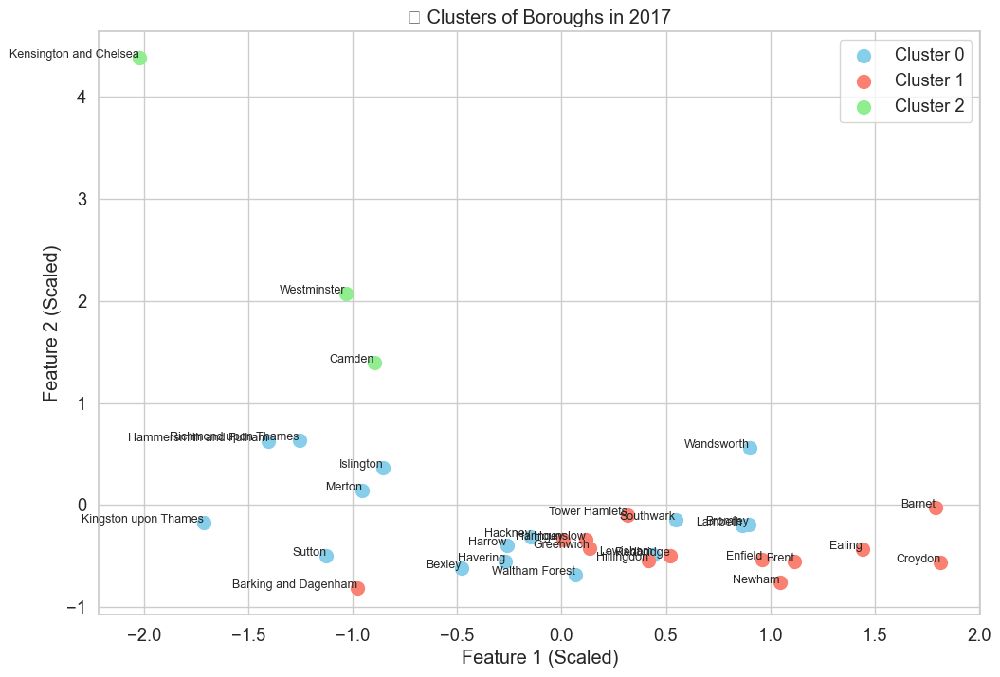

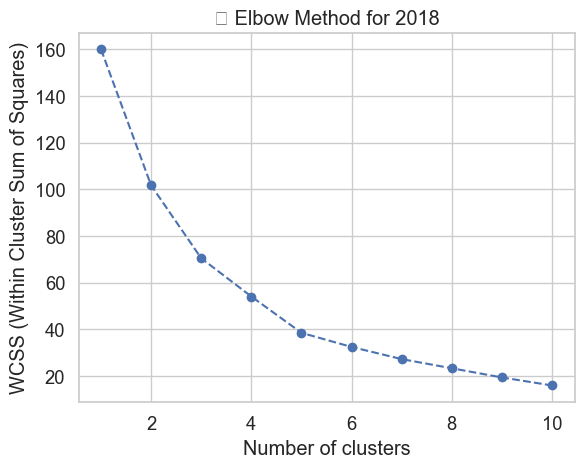

📊 Summary statistics for each cluster in 2018:
              population_2018    income_2018    crime_2018  \
Cluster_2018                                                 
0               251284.214286   48814.285714  20373.142857   
1               315395.800000   39093.333333  28757.133333   
2               192084.666667  131200.000000  40226.333333   

              economic_activity_2018  job_density_2018  
Cluster_2018                                            
0                          59.571429          0.784286  
1                          50.973333          0.718667  
2                          49.733333          2.670000  

📊 Count of boroughs per cluster in 2018:
Cluster_2018
1    15
0    14
2     3
Name: count, dtype: int64


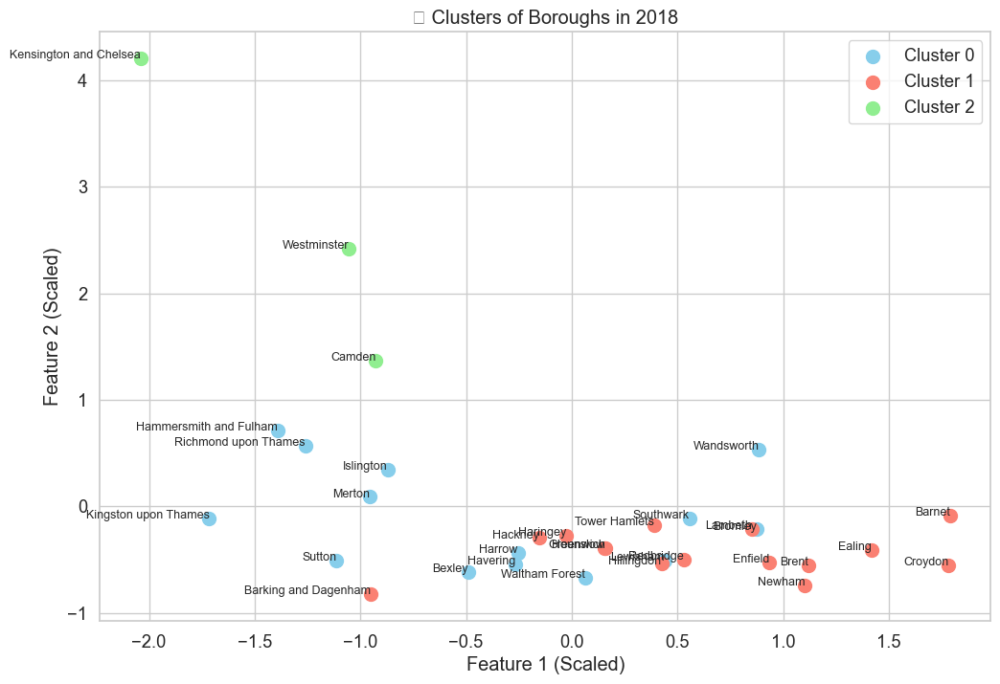

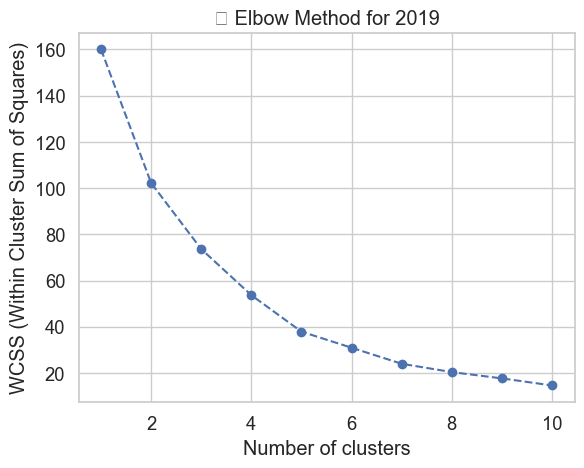

📊 Summary statistics for each cluster in 2019:
              population_2019    income_2019    crime_2019  \
Cluster_2019                                                 
0               324440.363636   37854.545455  28247.363636   
1               263321.000000   49694.444444  25468.611111   
2               190785.333333  126800.000000  49305.000000   

              economic_activity_2019  job_density_2019  
Cluster_2019                                            
0                          49.800000          0.678182  
1                          59.916667          0.798333  
2                          52.566667          2.666667  

📊 Count of boroughs per cluster in 2019:
Cluster_2019
1    18
0    11
2     3
Name: count, dtype: int64


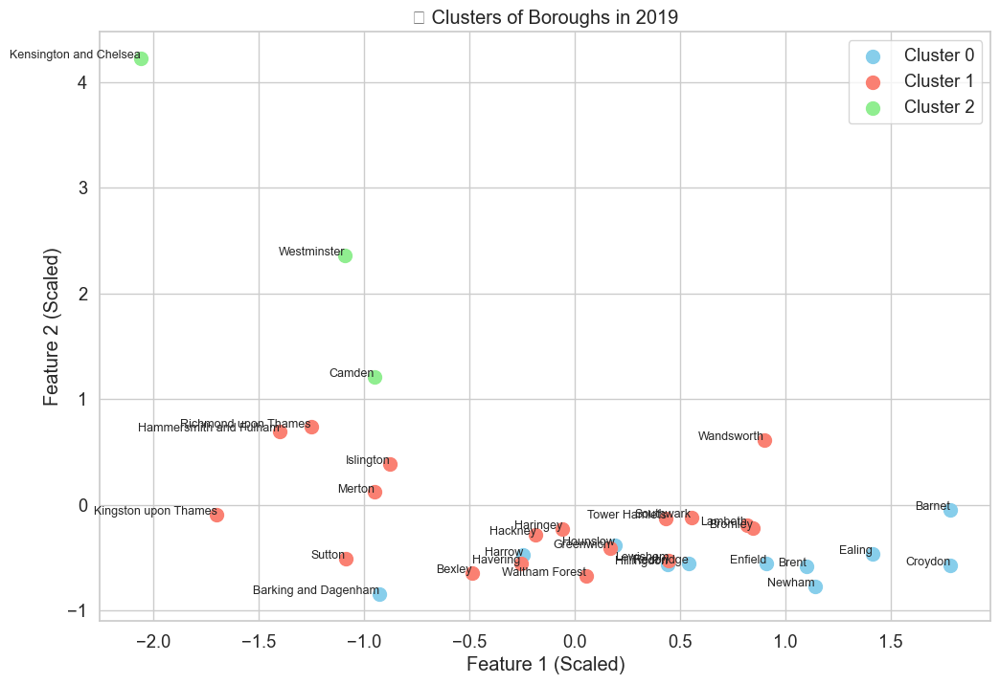

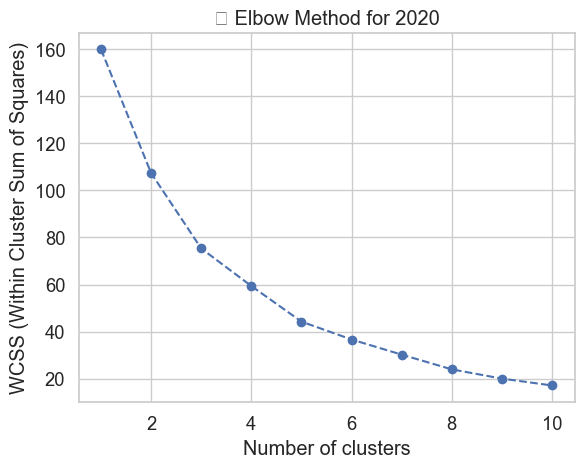

📊 Summary statistics for each cluster in 2020:
              population_2020    income_2020    crime_2020  \
Cluster_2020                                                 
0               188422.000000  133300.000000  32022.333333   
1               219250.000000   51040.000000  16222.900000   
2               321100.578947   44647.368421  27980.736842   

              economic_activity_2020  job_density_2020  
Cluster_2020                                            
0                          50.666667          2.440000  
1                          56.480000          0.772000  
2                          56.936842          0.709474  

📊 Count of boroughs per cluster in 2020:
Cluster_2020
2    19
1    10
0     3
Name: count, dtype: int64


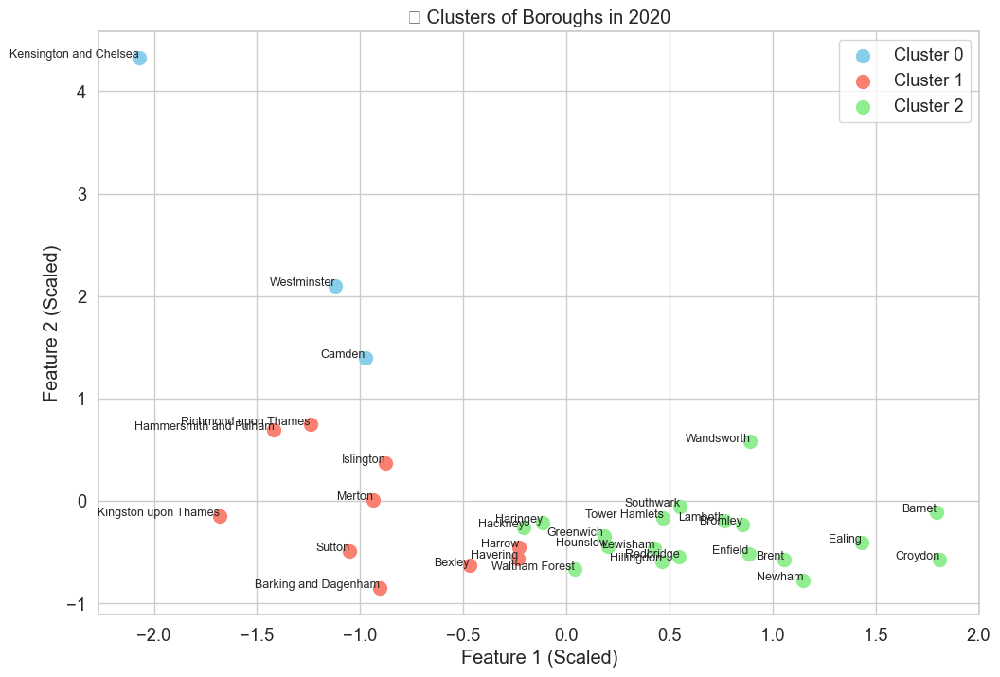

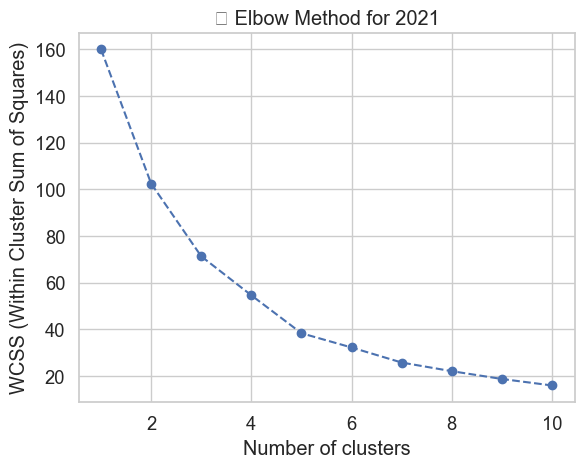

📊 Summary statistics for each cluster in 2021:
              population_2021    income_2021    crime_2021  \
Cluster_2021                                                 
0               217730.600000   52770.000000  16158.200000   
1               318830.578947   46521.052632  28077.263158   
2               186997.666667  142666.666667  32471.333333   

              economic_activity_2021  job_density_2021  
Cluster_2021                                            
0                          56.430000          0.790000  
1                          57.847368          0.704737  
2                          47.600000          3.176667  

📊 Count of boroughs per cluster in 2021:
Cluster_2021
1    19
0    10
2     3
Name: count, dtype: int64


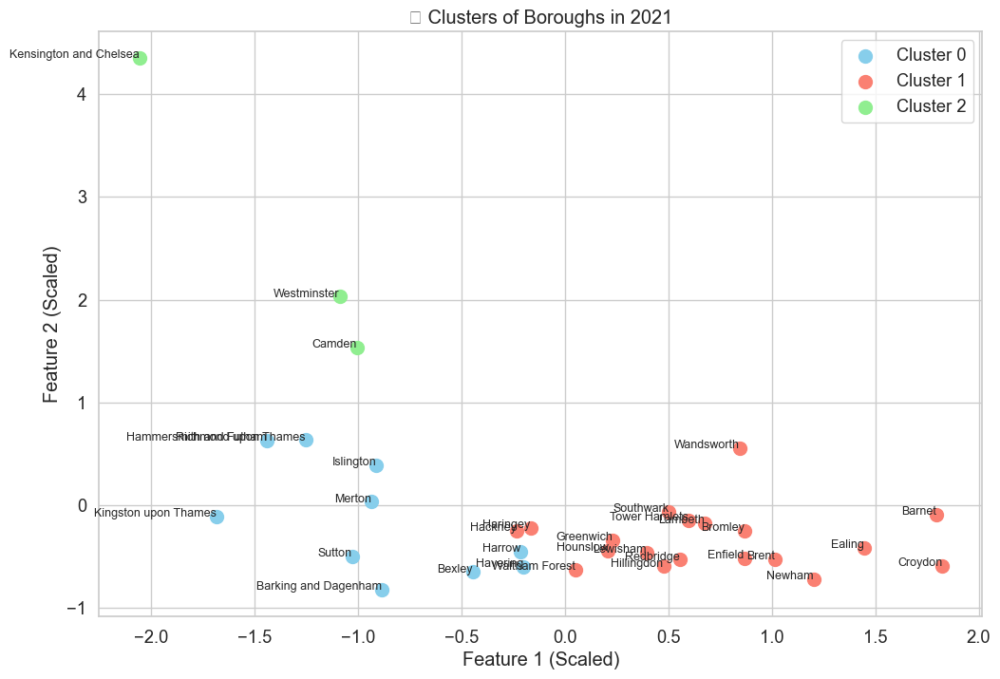

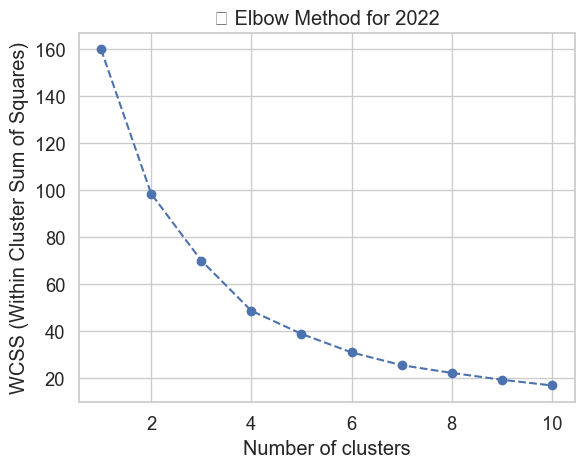

📊 Summary statistics for each cluster in 2022:
              population_2022    income_2022    crime_2022  \
Cluster_2022                                                 
0               191856.000000  153333.333333  44978.000000   
1               315786.611111   46844.444444  28413.388889   
2               235964.181818   61354.545455  19841.909091   

              economic_activity_2022  job_density_2022  
Cluster_2022                                            
0                          49.966667          3.276667  
1                          55.838889          0.753889  
2                          65.772727          0.804545  

📊 Count of boroughs per cluster in 2022:
Cluster_2022
1    18
2    11
0     3
Name: count, dtype: int64


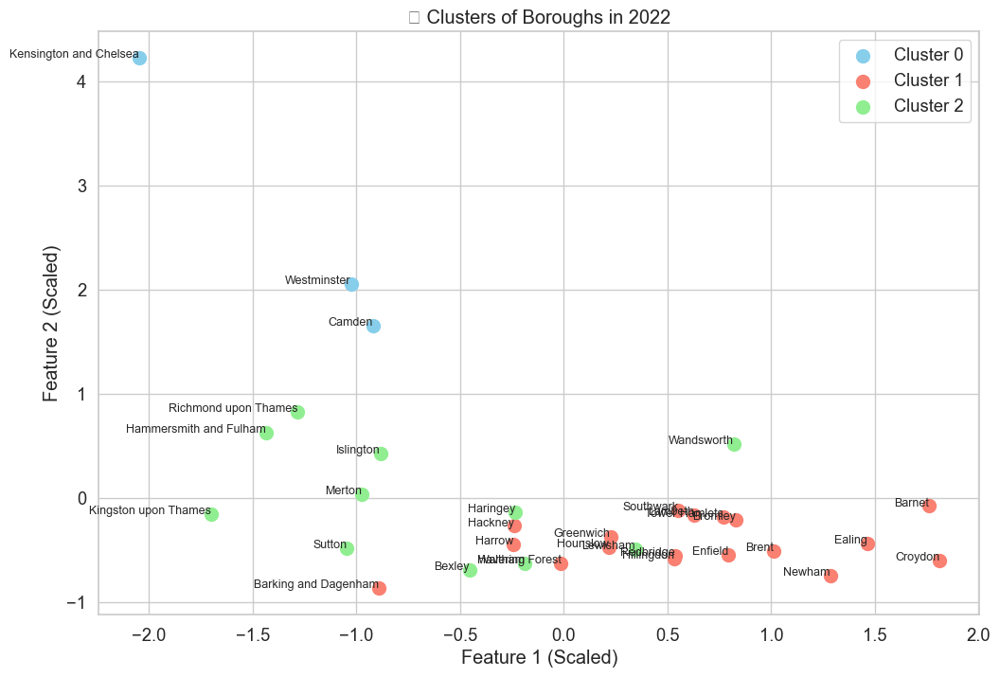

In [106]:
def run_clustering_for_all_years(dataset, years, num_clusters=3):
    scaler = StandardScaler()

    for year in years:
        # Select relevant features for clustering for the given year
        features = [f'population_{year}', f'income_{year}',  
                    f'crime_{year}', f'economic_activity_{year}', f'job_density_{year}']
        
        # Check if all features exist in the dataset
        if not all(feature in dataset.columns for feature in features):
            print(f"⚠️ Oops! Not all features are available for the year {year}. Skipping...")
            continue
        
        X = dataset[features]

        # Normalize the data
        X_scaled = scaler.fit_transform(X)

        # Compute WCSS to determine the optimal number of clusters using the elbow method
        wcss = []
        for i in range(1, 11):
            kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=10, random_state=0)
            kmeans.fit(X_scaled)
            wcss.append(kmeans.inertia_)

        plt.figure()
        plt.plot(range(1, 11), wcss, marker='o', linestyle='--', color='b')
        plt.title(f'📊 Elbow Method for {year}')
        plt.xlabel('Number of clusters')
        plt.ylabel('WCSS (Within Cluster Sum of Squares)')  
        plt.grid(True)
        plt.show()

        # Fit the model with optimal number of clusters
        kmeans = KMeans(n_clusters=num_clusters, init='k-means++', max_iter=300, n_init=10, random_state=0)
        y_kmeans = kmeans.fit_predict(X_scaled)

        # Adding the cluster results to the original data
        dataset[f'Cluster_{year}'] = y_kmeans

    
        cluster_names = ['Cluster 0', 'Cluster 1', 'Cluster 2']

        # Summary statistics for each cluster
        print(f"📊 Summary statistics for each cluster in {year}:")
        cluster_summary = dataset.groupby(f'Cluster_{year}')[features].mean()
        print(cluster_summary)

        # Count of boroughs per cluster
        print(f"\n📊 Count of boroughs per cluster in {year}:")
        cluster_counts = dataset[f'Cluster_{year}'].value_counts()
        print(cluster_counts)

        # Plotting the clusters
        plt.figure(figsize=(12, 8))
        colors = ['skyblue', 'salmon', 'lightgreen']
        for idx in range(num_clusters):
            plt.scatter(X_scaled[y_kmeans == idx, 0], X_scaled[y_kmeans == idx, 1], s=100, c=colors[idx], label=f'{cluster_names[idx]}')
            
            # Annotate points with borough names
            for i in range(len(X_scaled)):
                if y_kmeans[i] == idx:
                    plt.text(X_scaled[i, 0], X_scaled[i, 1], dataset['Borough'].iloc[i], fontsize=9, ha='right')

        plt.title(f'🌟 Clusters of Boroughs in {year}')
        plt.xlabel('Feature 1 (Scaled)')
        plt.ylabel('Feature 2 (Scaled)')
        plt.legend()
        
        # Show the plot
        plt.show()

run_clustering_for_all_years(final_dataset, [2017, 2018, 2019, 2020, 2021, 2022])


The series of K-means cluster analyses from 2017 to 2022 give a structured insight into how London's boroughs group together based on several socioeconomic and affordable housing availability. Boroughs in the same cluster like Kingstion and Chelsea, Westmiister and Candem all in Inner London share similar characteristics concerning population size, income levels, crime rates, job density and economic activity, like wise for other clusters.

Understanding these clusters can help policymakers tailor specific interventions, such as where to focus economic incentives or security enhancements. It also aids in predicting how changes in the housing market could affect other socio-economic factors.

The availability of affordable housing in London has multifaceted impacts on its socioeconomic landscape. Areas with significant affordable housing tend to cater to larger, possibly less affluent populations and exhibit diverse economic characteristics. Policymakers need to consider these complex relationships when planning housing, economic development, and community services to ensure balanced urban growth and stability.

The series of K-means cluster analyses you provided from 2017 to 2022 give a structured insight into how London's boroughs group together based on several socioeconomic and demographic factors, including affordable housing availability.

### 8 Spatial Analysis

Here, autocorrelation patterns will be explored to provide some spatial insight on the data.

In [107]:
final_dataset_merged_gdf = gdf_boroughs.merge(final_dataset, on='Borough', how='left')
final_dataset_merged_gdf.head()

,Borough,Code_x,HECTARES,NONLD_AREA,ONS_INNER,SUB_2009,SUB_2006,geometry,Code_y,Inner_Outer_London,...,Rented from Private landlord_2017,Rented from Private landlord_2018,Rented from Private landlord_2019,Rented from Private landlord_2020,Cluster_2017,Cluster_2018,Cluster_2019,Cluster_2020,Cluster_2021,Cluster_2022
0,Kingston upon Thames,E09000021,3726.117,0.000,F,None,None,"POLYGON ((516401.600 160201.800, 516407.300 16...",E09000021,Outer London,...,22.6,26.9,25.5,19.5,0,0,1,1,0,2
1,Croydon,E09000008,8649.441,0.000,F,None,None,"POLYGON ((535009.200 159504.700, 535005.500 15...",E09000008,Outer London,...,21.5,19.2,27.1,23.2,1,1,0,2,1,1
2,Bromley,E09000006,15013.487,0.000,F,None,None,"POLYGON ((540373.600 157530.400, 540361.200 15...",E09000006,Outer London,...,13.1,19.1,21.1,14.0,0,0,1,2,1,1
3,Hounslow,E09000018,5658.541,60.755,F,None,None,"POLYGON ((521975.800 178100.000, 521967.700 17...",E09000018,Outer London,...,23.8,21.6,28.4,24.7,1,1,0,2,1,1
4,Ealing,E09000009,5554.428,0.000,F,None,None,"POLYGON ((510253.500 182881.600, 510249.900 18...",E09000009,Outer London,...,26.4,25.6,30.1,30.2,1,1,0,2,1,1


In [108]:
final_dataset_merged_gdf = final_dataset_merged_gdf.to_crs(gdf_boroughs.crs)

### 8.1 Moran's I

In [109]:
def calculate_morans_I(df, start_year=2017, end_year=2022):
    results = []
    # Calculate spatial weights
    w = weights.Queen.from_dataframe(df)
    w.transform = 'r'  # Row-standardize the weights

    # Loop through each year and calculate Moran's I
    for year in range(start_year, end_year + 1):
        col_name = f'affordable_housing_{year}'
        if col_name in df.columns:
            moran = Moran(df[col_name], w)
            result = {
                'Year': year,
                'Moran\'s I': moran.I,
                'P-Value': moran.p_sim
            }
            results.append(result)
        else:
            print(f"Column {col_name} not found in DataFrame.")
    
    return results


moran_results = calculate_morans_I(final_dataset_merged_gdf)
for result in moran_results:
    print(result)


{'Year': 2017, "Moran's I": -0.04075136017754996, 'P-Value': 0.49}
{'Year': 2018, "Moran's I": 0.14135824249697115, 'P-Value': 0.059}
{'Year': 2019, "Moran's I": 0.018040340891672467, 'P-Value': 0.287}
{'Year': 2020, "Moran's I": -0.2127791364575301, 'P-Value': 0.071}
{'Year': 2021, "Moran's I": 0.10489361059042344, 'P-Value': 0.108}
{'Year': 2022, "Moran's I": -0.00920334628710205, 'P-Value': 0.37}


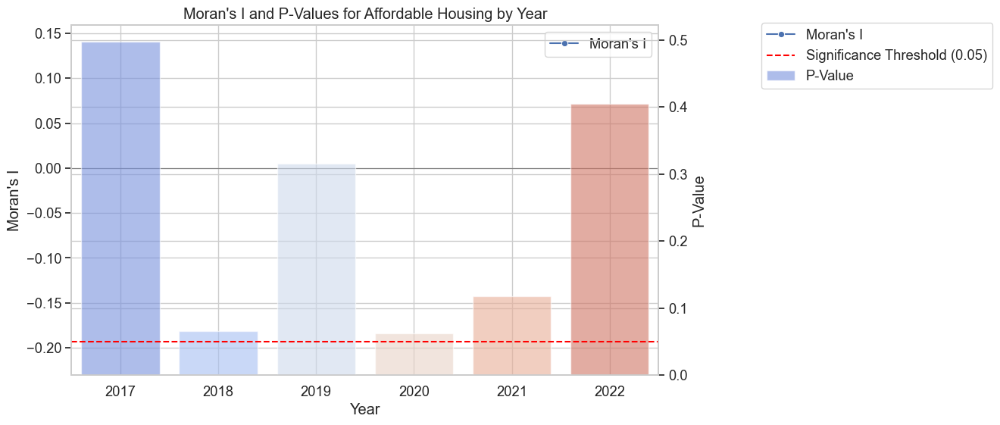

In [110]:
moran_results = [
    {'Year': 2017, "Moran's I": -0.04075136017754996, 'P-Value': 0.497},
    {'Year': 2018, "Moran's I": 0.14135824249697115, 'P-Value': 0.066},
    {'Year': 2019, "Moran's I": 0.018040340891672467, 'P-Value': 0.315},
    {'Year': 2020, "Moran's I": -0.2127791364575301, 'P-Value': 0.062},
    {'Year': 2021, "Moran's I": 0.10489361059042344, 'P-Value': 0.118},
    {'Year': 2022, "Moran's I": -0.00920334628710205, 'P-Value': 0.405}
]

# Convert to DataFrame for easier plotting
df_morans = pd.DataFrame(moran_results)

# Plotting
plt.figure(figsize=(10, 6))

# First axis for Moran's I
ax = sns.lineplot(data=df_morans, x='Year', y="Moran's I", marker='o', label="Moran's I")
plt.axhline(0, color='grey', lw=0.8)  # Add a line at zero for reference
ax.set_ylabel("Moran's I")

# Second axis for p-values
ax2 = ax.twinx()
sns.barplot(data=df_morans, x='Year', y='P-Value', alpha=0.6, ax=ax2, palette='coolwarm', label="P-Value")
ax2.set_ylabel('P-Value')
ax2.axhline(0.05, color='red', ls='--', label="Significance Threshold (0.05)")  # Significance threshold

# Labels and Legend
plt.title('Moran\'s I and P-Values for Affordable Housing by Year')
ax.figure.legend(loc='upper right', bbox_to_anchor=(1.35, 0.9))
plt.show()


The Moran's I results offers insights into the spatial autocorrelation of affordable housing units in London boroughs from 2017 to 2022.

2017: Moran's I = -0.041, P-Value = 0.497
The negative Moran’s I suggests a slight dispersion in the distribution of affordable housing, but the high p-value indicates that this pattern could be due to random chance. This implies no significant spatial autocorrelation.

2018: Moran's I = 0.141, P-Value = 0.066
A positive Moran's I value indicates some level of clustering of affordable housing, though the p-value slightly above 0.05 suggests this might not be statistically significant. There's a hint of spatial dependency where boroughs with similar levels of affordable housing are somewhat clustered.

2019: Moran's I = 0.018, P-Value = 0.315
This year shows a very weak clustering tendency, almost random, with a non-significant p-value. It suggests that the spatial distribution of affordable housing is mostly random.

2020: Moran's I = -0.213, P-Value = 0.062
The significantly negative Moran's I indicates a dispersion where boroughs with high affordable housing units might be surrounded by those with fewer units. The p-value close to 0.05 suggests this might be of interest, though not strongly statistically significant.

2021: Moran's I = 0.105, P-Value = 0.118
A return to weak positive autocorrelation suggests a mild clustering of affordable housing units. The pattern is not statistically significant, indicating the clustering might not be strong or consistent.

2022: Moran's I = -0.009, P-Value = 0.405
Very close to zero, suggesting a random distribution of affordable housing across London boroughs, with the high p-value supporting the lack of spatial autocorrelation.

## 9 Hypothesis Testing

### 9.1 Hypothesis 1

Higher availability of affordable housing leads to lower unemployment rate.

### 9.1.1 Null Hypothesis (H0)

H0: The increase in affordable housing units from 2017 to 2021 has no effect on the change in unemployment rates in the boroughs of London.

### 9.1.2 Alternative Hypothesis (H1)

H1: An increase in affordable housing units from 2017 to 2021 is associated with a decrease in unemployment rates in the boroughs of London.

### 9.1.3 Statistical Test

In [111]:
# Calculate growth rate affordable housing
final_dataset['housing_growth'] = (final_dataset['affordable_housing_2022'] - final_dataset['affordable_housing_2017']) / final_dataset['affordable_housing_2017']

# Calculate change in unemployment rates
final_dataset['unemployment_change'] = (final_dataset['unemployment_2021'] - final_dataset['unemployment_2017']) / final_dataset['unemployment_2017']

# Prepare the regression model
X = sm.add_constant(final_dataset['housing_growth'])  # Adds a constant term to the predictor
y = final_dataset['unemployment_change']
model = sm.OLS(y, X)
results = model.fit()

# Print out the statistics
print(results.summary())


                             OLS Regression Results                            
Dep. Variable:     unemployment_change   R-squared:                       0.018
Model:                             OLS   Adj. R-squared:                 -0.014
Method:                  Least Squares   F-statistic:                    0.5636
Date:                 Mon, 20 May 2024   Prob (F-statistic):              0.459
Time:                         06:35:05   Log-Likelihood:                 9.8120
No. Observations:                   32   AIC:                            -15.62
Df Residuals:                       30   BIC:                            -12.69
Df Model:                            1                                         
Covariance Type:             nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const              0.0961      0.0

The model's R-squared value of 0.018 suggests it explains only a small fraction of the variance in unemployment changes. Furthermore, the p-value for the housing growth coefficient is not statistically significant (p = 0.459), indicating no evidence to support the hypothesis that an increase in affordable housing units is associated with a decrease in unemployment rates. This analysis suggests that other factors might be more influential in explaining changes in unemployment.

### 9.2 Hypothesis 2

Boroughs with more affordable housing have higher population growth rates.

### 9.2.1 Null Hypothesis (H0)

H0: There is no relationship between the growth in affordable housing and the population growth in London boroughs from 2017 to 2022.

### 9.2.2 Alternative Hypothesis (H1)

H1: There is a relationship between the growth in affordable housing and the population growth in London boroughs from 2017 to 2022.

### 9.2.3 Statistical Test

In [112]:
# Calculate growth rates for population and affordable housing
final_dataset['population_growth'] = (final_dataset['population_2022'] - final_dataset['population_2017']) / final_dataset['population_2017'] * 100  # percent growth
final_dataset['housing_growth'] = (final_dataset['affordable_housing_2022'] - final_dataset['affordable_housing_2017']) / final_dataset['affordable_housing_2017'] * 100  # percent growth

# Prepare the regression model
X = sm.add_constant(final_dataset['housing_growth'])  # Adds a constant term to the predictor
y = final_dataset['population_growth']
model = sm.OLS(y, X)
results = model.fit()

# Print out the statistics
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:      population_growth   R-squared:                       0.146
Model:                            OLS   Adj. R-squared:                  0.118
Method:                 Least Squares   F-statistic:                     5.135
Date:                Mon, 20 May 2024   Prob (F-statistic):             0.0308
Time:                        06:35:05   Log-Likelihood:                -75.973
No. Observations:                  32   AIC:                             155.9
Df Residuals:                      30   BIC:                             158.9
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const              1.4383      0.539      2.

The model yielded an R-squared of 0.146, suggesting that approximately 14.6% of the variance in population growth can be explained by changes in affordable housing availability. The coefficient for housing_growth is statistically significant (p = 0.031), indicating a negative relationship, although very slight, between the increase in affordable housing and population growth. This outcome suggests that other factors not included in the model may also significantly impact population changes.

### 9.3 Hypothesis 3
Higher availability of affordable housing leads to lower crime rates.

### 9.3.1 Null Hypothesis (H0)

H0: There is no relationship between the increase in affordable housing and the change in crime rates.

### 9.3.2 Alternative Hypothesis (H1)

H1: There is a significant relationship between the increase in affordable housing and the change in crime rates.

### 6.3.3 Statistical Test

In [113]:
# Calculate change in crime rates
final_dataset['crime_change'] = (final_dataset['crime_2022'] - final_dataset['crime_2017']) / final_dataset['crime_2017']

# Prepare the regression model
X = sm.add_constant(final_dataset['housing_growth'])  # Adds a constant term to the predictor
model = sm.OLS(final_dataset['crime_change'], X)
results = model.fit()

# Print out the statistics
print(results.summary())


                            OLS Regression Results                            
Dep. Variable:           crime_change   R-squared:                       0.042
Model:                            OLS   Adj. R-squared:                  0.010
Method:                 Least Squares   F-statistic:                     1.327
Date:                Mon, 20 May 2024   Prob (F-statistic):              0.258
Time:                        06:35:05   Log-Likelihood:                 30.324
No. Observations:                  32   AIC:                            -56.65
Df Residuals:                      30   BIC:                            -53.72
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const              0.0570      0.019      2.

The model, with an R-squared of 0.042, explains only about 4.2% of the variance in crime rate changes, indicating a weak explanatory power. The coefficient for housing_growth is not statistically significant (p = 0.258), suggesting that changes in affordable housing availability have no significant effect on crime rate changes according to this model. This result supports the null hypothesis that there is no relationship between the increase in affordable housing and the change in crime rates.

### 10.1 Model Building

A regression model will be built to analyse each year from 2017 to 2022 to assess the impact of various socioeconomic factors on the availablity of affordable housing in London boroughs, checking how well the variables predict the number of affordable housing units available each year.

In [114]:
years = range(2017, 2023)

results = []

for year in years:
    predictors = ['population', 'unemployment', 'income', 'education', 'economic_activity', 'job_density']
    available_predictors = [f"{var}_{year}" for var in predictors if f"{var}_{year}" in final_dataset.columns]
    
    if available_predictors:
        X = final_dataset[available_predictors]
        y_var = f"affordable_housing_{year}"
        if y_var in final_dataset.columns:
            y = final_dataset[y_var]
            
            # Splitting the dataset into training and testing sets
            X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)
            
            # Create and fit the model
            model = LinearRegression()
            model.fit(X_train, y_train)
            
            # Predicting the Test set results
            y_pred = model.predict(X_test)
            
            # Evaluate the model
            mse = mean_squared_error(y_test, y_pred)
            r2 = r2_score(y_test, y_pred)
            
            # Store results
            results.append({
                'Year': year,
                'Predictors': available_predictors,
                'Coefficients': model.coef_,
                'Intercept': model.intercept_,
                'MSE': mse,
                'R^2': r2
            })

# Convert results to DataFrame for better visualization
results_df = pd.DataFrame(results)
results_df

,Year,Predictors,Coefficients,Intercept,MSE,R^2
0,2017,"[population_2017, unemployment_2017, income_20...","[0.0010729028616641063, 20.17671795214439, -0....",-187.832885,41321.492391,0.376489
1,2018,"[population_2018, unemployment_2018, income_20...","[0.003319051106706789, 159.8374012301908, -0.0...",-1455.626431,164470.309026,0.391217
2,2019,"[population_2019, unemployment_2019, income_20...","[0.0027216049479521875, 59.235630916160304, -0...",-366.785895,146238.013101,0.205271
3,2020,"[population_2020, unemployment_2020, income_20...","[0.0020578045457480694, 317.33862897845626, -0...",-2695.541703,98265.744064,-0.504510
4,2021,"[population_2021, unemployment_2021, income_20...","[0.002076618105716996, 144.469378279842, -0.00...",-586.384614,23640.980918,0.690394
5,2022,"[population_2022, income_2022, economic_activi...","[0.004134205651856776, -0.0005975876711121558,...",-73.821024,40189.135437,0.364201


This linear regression analysis investigates the influence of socioeconomic factors such as population, unemployment, income, education, economic activity, and job density on the availability of affordable housing in London boroughs from 2017 to 2022. The varied R² values across different years indicate fluctuating model effectiveness, with some years showing good predictive capability and others demonstrating poor fits. These findings highlight the complex and dynamic relationship between socioeconomic conditions and housing affordability, suggesting targeted policy interventions may need to consider annual economic shifts to effectively enhance affordable housing availability.

### 10.2 Model Evaluation

The R² values range significantly, from -0.504 in 2020 indicating a potentially poor model fit, to 0.690 in 2021 where the model explains approximately 69% of the variance in affordable housing. This variation suggests that external factors not included in the model may influence the results. The Mean Squared Error (MSE) values also vary, with the lowest error in 2021, indicating the most accurate predictions occurred in this year. Coefficients across different years suggest that the influence of predictors can fluctuate significantly, potentially due to economic or policy changes affecting housing markets. The negative R² in 2020 and high MSE in 2018 suggest the need for better data quality to improve reliability and accuracy of predictions in certain years. Overall, the analysis underscores the complexity of housing dynamics.